<h1><center>XYZ Sports Company</center></h1>
<h2><center>Customer Segmentation</center></h2>

## <center> *Group 99* </center>

| Student Names | Student Number | Student Email |
|--------------|----------------|---------------|
| Guilherme Sá           | 20230520               |  20230520@novaims.unl.pt             |
| Sebastião Rosalino           | 20230372               | 20230372@novaims.unl.pt              |
| Zenan Chen          |   20221390             | 20221390@novaims.unl.pt              |

<div style="text-align:center;">
    <img src="nova_ims_logo.png" alt="NOVA IMS logo" width="100" height="100">
</div>
<div style="text-align:center;">
    <img src="intro.jpg" alt="Intro" width="300" height="200">
</div>

1. [Introduction](#introduction)
2. [Data Exploration](#data-exploration)
3. [Data Preprocessing](#data-preprocessing)
   - 3.1. [1st Outlier Removal](#1st-outlier-removal)
     - [Metric Features](#metric-features-1st-outlier)
     - [Binary Features](#binary-features-1st-outlier)
     - [Date Features](#date-features-1st-outlier)
   - 3.2. [Addressing Data Inconsistencies](#addressing-data-inconsistencies)
   - 3.3. [Missing Data Handling](#missing-data-handling)
     - [Metric Features](#metric-features-missing-data)
     - [Binary Features](#binary-features-missing-data)
   - 3.4. [Feature Engineering](#feature-engineering)
   - 3.5. [2nd Outlier Removal](#2nd-outlier-removal)
     - [Metric Features](#metric-features-2nd-outlier)
     - [Removal with DBSCAN](#removal-with-db-scan)
     - [Binary Features](#binary-features-2nd-outlier)
   - 3.6. [Feature Selection](#feature-selection)
     - [Metric Features](#metric-features-feature-selection)
     - [Binary Features](#binary-features-feature-selection)
4. [Clustering](#clustering)
   - 4.1. [Hierarchical Clustering](#hierarchical-clustering)
   - 4.2. [KMeans](#kmeans)
   - 4.3. [Partioning Around Medoids](#partioning-around-medoids)
   - 4.4. [Self Organizing Maps](#self-organizing-maps)
   - 4.5. [Gaussian Mixture Models](#gaussian-mixture-models)
   - 4.6. [K-Prototypes](#k-prototypes)
   - 4.7. [Final Solution & Clustering By Perspective](#final-solution-and-clustering-by-perspective)
   - 4.8. [Cluster Solution Visualization](#cluster-solution-visualization)
5. [Outlier Reclassification](#outlier-reclassification)
6. [Conclusion](#conclusion)

In [4]:
import subprocess
import pkg_resources
import sys

try:
    # Check if scikit-learn-extra is already installed
    pkg_resources.get_distribution('scikit-learn-extra')
    print("scikit-learn-extra is already installed.")
except pkg_resources.DistributionNotFound:
    # If scikit-learn-extra is not installed, install it
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', 'scikit-learn-extra'])
    print("scikit-learn-extra has been installed.")

# Check if kmodes is already installed
try:
    pkg_resources.get_distribution('kmodes')
    print("kmodes is already installed.")
except pkg_resources.DistributionNotFound:
    # If kmodes is not installed, install it
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', 'kmodes'])
    print("kmodes has been installed.")

scikit-learn-extra is already installed.
kmodes is already installed.


In [105]:
# Standard libraries
import numpy as np
import pandas as pd
import statistics as sts
import re
import warnings

# Sklearn modules
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import AgglomerativeClustering, KMeans, MeanShift, estimate_bandwidth
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn_extra.cluster import KMedoids
from sklearn.base import clone
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz

# Graphviz modules
import graphviz

# SciPy modules
import scipy.stats as stats
from scipy.stats import chi2_contingency, pointbiserialr
from scipy.cluster.hierarchy import dendrogram, fcluster

# Visualization libraries
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

# SOM (Self Organizing Maps) library
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

# Kmodes modules
from kmodes.kprototypes import KPrototypes

# Suppress warnings
warnings.filterwarnings('ignore')

<a name="introduction"></a>

# 1. Introduction

In the dynamic landscape of the sports retail industry, effective customer segmentation stands as a key differentiator for businesses. This report presents an in-depth analysis and segmentation of the XYZ Sports Company's customer base, utilizing data from its Enterprise Resource Planning (ERP) system. The project leverages advanced data mining methodologies to offer actionable insights for strategic decision-making and enhanced customer engagement.  

XYZ Sports Company, with its diverse clientele, faces the dual challenge and opportunity of understanding and addressing varied customer needs. Traditional demographic-based segmentation methods are inadequate for capturing the complexities of modern consumer behavior. This project employs sophisticated data analysis techniques, transcending conventional approaches to reveal behavior-based customer segment

 

The essence of this project is transforming raw data into strategic insights. It involves a detailed data preparation phase to ensure the accuracy and reliability of the analysis. Advanced clustering techniques like K-Means and Gaussian Mixture Models are utilized to identify distinct customer groups. Each technique provides unique insights, and their comparative analysis ensures a thorough understanding of the customer base. Dimensionality reduction techniques, such as t-SNE, are employed for data visualization, facilitating the identification of patterns and relationships in high-dimensional data. This approach enhances both the analysis process and the presentation of findings, especially for stakeholders not versed in data science. Crucially, the project focuses on the interpretability of results. Understanding the defining characteristics of each customer segment is vital for practical applications, such as targeted marketing and personalized product recommendans. 

 

This report demonstrates how data mining can be applied to uncover valuable insights within customer data. The findings are anticipated to provide XYZ Sports Company with a deeper understanding of their customers, supporting data-driven decisions that strengthen customer relationships and propel business growth. 

<a name="data-exploration"></a>

# 2. Data Exploration

In [106]:
# Read the dataset from the file 'XYZ_sports_dataset.csv' into a pandas DataFrame 'df'.
# The features in the dataset are separated by semicolons (';').
df = pd.read_csv('XYZ_sports_dataset.csv', sep=';')

# Display the first three records of the DataFrame to provide an initial overview of the data.
df.head(3).T

,0,1,2
ID,10000,10001,10002
Age,60,29,23
Gender,Female,Female,Male
Income,5500.0,2630.0,1980.0
EnrollmentStart,2019-09-03,2014-08-12,2017-05-02
EnrollmentFinish,2019-10-31,2015-09-14,2017-06-01
LastPeriodStart,2019-07-01,2015-01-01,2017-01-01
LastPeriodFinish,2019-12-31,2015-12-31,2017-06-30
DateLastVisit,2019-10-30,2015-07-16,2017-05-25
DaysWithoutFrequency,1,60,7


In [107]:
# Display information about the DataFrame 'df' using the .info() method.
# This provides an overview of the dataset, including: size, column names, non-null values, data types and memory usage.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14942 entries, 0 to 14941
Data columns (total 31 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          14942 non-null  int64  
 1   Age                         14942 non-null  int64  
 2   Gender                      14942 non-null  object 
 3   Income                      14447 non-null  float64
 4   EnrollmentStart             14942 non-null  object 
 5   EnrollmentFinish            14942 non-null  object 
 6   LastPeriodStart             14942 non-null  object 
 7   LastPeriodFinish            14942 non-null  object 
 8   DateLastVisit               14942 non-null  object 
 9   DaysWithoutFrequency        14942 non-null  int64  
 10  LifetimeValue               14942 non-null  float64
 11  UseByTime                   14942 non-null  int64  
 12  AthleticsActivities         14906 non-null  float64
 13  WaterActivities             149

In [108]:
# Use the 'describe' method with the 'include' parameter set to 'all' to compute summary statistics for all columns,
# including non-numeric columns.
# Then, transpose the result (T) to have a more readable format with statistics as rows and column names as columns.
summary_statistics = df.describe(include='all').round(3).T
summary_statistics

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ID,14942.0,NaN,NaN,NaN,17470.5,4313.528,10000.0,13735.25,17470.5,21205.75,24941.0
Age,14942.0,NaN,NaN,NaN,26.016,14.157,0.0,19.0,23.0,31.0,87.0
Gender,14942,2,Female,8931,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income,14447.0,NaN,NaN,NaN,2230.816,1566.528,0.0,1470.0,1990.0,2790.0,10890.0
EnrollmentStart,14942,1490,2015-03-02,92,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EnrollmentFinish,14942,1300,2015-09-16,1684,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LastPeriodStart,14942,12,2019-07-01,3172,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LastPeriodFinish,14942,11,2019-12-31,3694,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DateLastVisit,14942,1384,2019-10-31,475,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DaysWithoutFrequency,14942.0,NaN,NaN,NaN,81.225,144.2,0.0,13.0,41.0,83.75,1745.0


### *Takeways*

- ID: No missing data, ranging from 10,000 to 24,941. These IDs are unique identifiers for each individual.

- Age: The average is approximately 26 years, with a wide range from 0 to 87 years.

- Gender: The most frequent gender is "Female," which appears 8,931 times.

- Income: The income data is available for 14,447 individuals (out of 14942), with an average income of approximately 2,231 currency units. Incomes vary widely, ranging from 0 to 10,890 units.

- Enrollment and Last Period Dates: Since these are dates being interpreted as objects, there is no detailed summary provided 

- Date Last Visit: Most individuals visited last on October 31, 2019. There are 1,384 unique last visit dates.

- Days Without Frequency: On average, individuals had approximately 81 days without visiting. The standard deviation is relatively high, indicating significant variation in this feature. The minimum value is 0.0 and the maximum is 1745.0, suggesting the presence of outliers.

- Lifetime Value: The average is approximately 302.56 units. The values range from 0 to 6,727.80 units, suggesting the presence of outliers.

- Use By Time: Binary feature, with a mean value of around 0.047. It's mostly centered around 0, with some occurrences of 1.

- Activity Categories: The dataset includes various activity categories (e.g., Athletics, Water, Fitness, Dance, Team, Racket, Combat, Nature, Special, Other). These are all binary features (0 or 1). It is noteworthy to mention that the mean of "DanceActivities" and "NatureActivities" is 0, indicating no customer participation. "DanceActivity" and "Nature Activities" are univariate.

- Number of Frequencies: Individuals attended classes an average of 40.12 times, with a wide range of values. The minimum value is 1.0 and the maximum is 1031.0, suggesting the presence of outliers.

- Attended Classes: On average, individuals attended approximately 10 classes, but this feature has a wide variation with a high standard deviation. The maximum value is 581.0 suggesting the presence of outliers.

- Allowed Weekly Visits by SLA: The average allowed weekly visits by service level agreement (SLA) is approximately 5.76. Most of the values are around 7, indicating that many individuals are allowed seven weekly visits.

- Allowed Number of Visits by SLA: Individuals are allowed an average of approximately 41.64 visits by SLA, with some variation in these allowances. The minimum value is 0.56 and the maximum is 240.03, suggesting the presence of outliers.

- Real Number of Visits: On average, individuals had approximately 5.32 real visits. There is some variation, with a maximum of 84 visits, suggesting a possible outlier situation.

- Number of Renewals: The average number of renewals is approximately 1.21, with a maximum of 6 renewals.

- Has References: Most individuals have no references (0), with an average of around 0.02, and some have references (1).

- Number of References: The average number of references is approximately 0.022, with values ranging from 0.0 to 3.0.

- Dropout: Binary feature, with a mean of approximately 0.801, indicating that a significant portion of individuals has dropped out (1).

In [109]:
# Drop the 'ID' feature, inplace, since it is irrelevant to the customer segmentation process
df.drop('ID',axis=1, inplace=True)

# Drop the 'DanceActivities' and 'NatureActivities' features since they are full of 0, indicating no participation among customers, 
# being therefore irrelevant to the segmentation process (univariate variables)
df.drop(['DanceActivities', 'NatureActivities'], axis=1, inplace=True)

In [110]:
# Count and calculate the relative frequencies (normalized) of unique values in the 'Gender' column.
gender_distribution = df['Gender'].value_counts(normalize=True) * 100
gender_distribution

Gender
Female    59.771115
Male      40.228885
Name: proportion, dtype: float64

### *Takeways*

- The result indicates the distribution of gender within the dataset as follows:

    - Approximately 59.77% of the individuals in the dataset are labeled as "Female."
    - About 40.23% of the individuals in the dataset are labeled as "Male."

In [111]:
# Map the binary values "Male" to 1 and "Female" to 0, converting gender labels into binary values, for future data preprocess purposes.
df['Gender'] = df['Gender'].map({'Male': 1, 'Female': 0})

In [112]:
def rename_dataframe_columns(df):
    """
    Standardize column names in the given DataFrame by converting camelCase to snake_case.
    
    Parameters:
    df (DataFrame): The DataFrame containing column names to be standardized.
    
    Returns:
    None
    
    Explanation:
    This function iterates through the existing column names in the DataFrame and applies a regular expression pattern.
    The regular expression pattern 'r'([a-z])([A-Z])' is used to identify instances where a lowercase letter (the first 
    '([a-z])' group) is immediately followed by an uppercase letter (the second '([A-Z])' group). When a match is found,
    this pattern inserts an underscore ('_') between the lowercase and uppercase letters. In other words, it converts 
    camelCase column names to snake_case. For example, 'ColumnName' becomes 'column_name'. The standardized column names
    help improve code readability and maintain consistency in column naming across the DataFrame.
    """
    for old_column_name in df.columns:
        new_column_name = re.sub(r'([a-z])([A-Z])', r'\1_\2', old_column_name).lower()
        df.rename(columns={old_column_name: new_column_name}, inplace=True)
        
# Calling the 'rename_dataframe_columns' function to standardize the column names in the DataFrame 'df.'
rename_dataframe_columns(df)

In [113]:
# Check that every renaming worked as expected
df.columns

Index(['age', 'gender', 'income', 'enrollment_start', 'enrollment_finish',
       'last_period_start', 'last_period_finish', 'date_last_visit',
       'days_without_frequency', 'lifetime_value', 'use_by_time',
       'athletics_activities', 'water_activities', 'fitness_activities',
       'team_activities', 'racket_activities', 'combat_activities',
       'special_activities', 'other_activities', 'number_of_frequencies',
       'attended_classes', 'allowed_weekly_visits_by_sla',
       'allowed_number_of_visits_by_sla', 'real_number_of_visits',
       'number_of_renewals', 'has_references', 'number_of_references',
       'dropout'],
      dtype='object')

locator: <matplotlib.ticker.AutoLocator object at 0x0000021429B4D060>


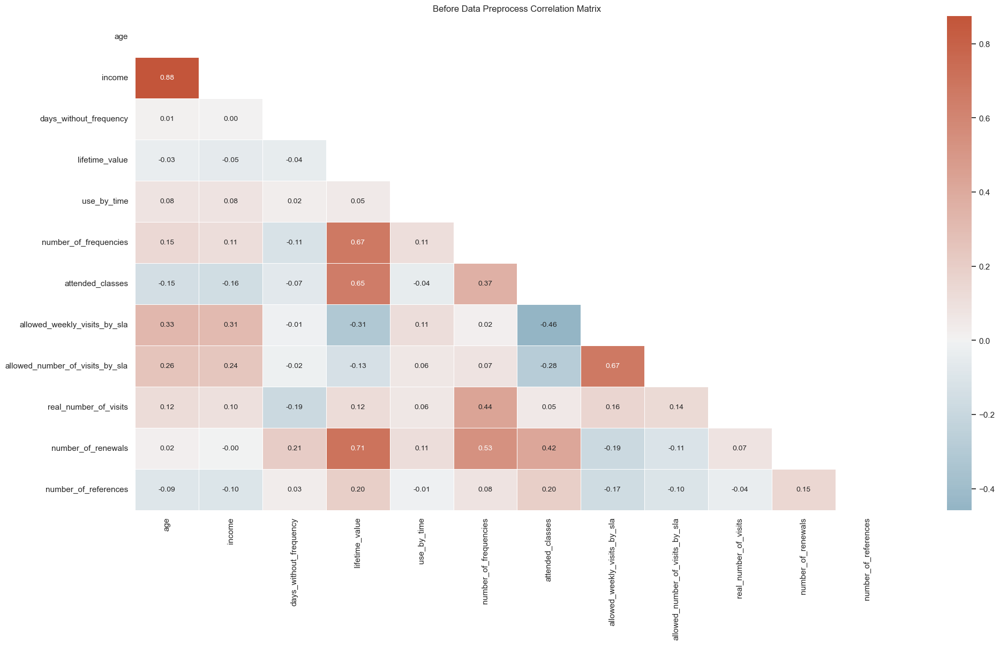

In [114]:
# Calculate the correlation matrix for the DataFrame 'df'
correlation_matrix = df[['age', 'income', 'days_without_frequency', 'lifetime_value', 'use_by_time', 'number_of_frequencies',
                         'attended_classes', 'allowed_weekly_visits_by_sla', 'allowed_number_of_visits_by_sla', 
                         'real_number_of_visits', 'number_of_renewals', 'number_of_references']].corr()

# Create a mask for the upper triangle of the correlation matrix
upper_triangle = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the figure for the heatmap and define its size
plt.figure(figsize=(23, 12))

# Set the style for the heatmap
sns.set(style="white")

# Create a color palette for the heatmap using a diverging color scheme
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Create the heatmap using the correlation matrix, applying the upper triangle mask, and annotating values
sns.heatmap(correlation_matrix, mask=upper_triangle, annot=True, cmap=cmap, center=0, linewidths=0.5, fmt=".2f", annot_kws={"size": 10})

# Set the title for the heatmap
plt.title("Before Data Preprocess Correlation Matrix")

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)

# Show the correlation matrix heatmap
plt.show()

### *Takeaways*

* **Positive Moderate Correlations:**

    - 'lifetime_value' and 'attended_classes' exhibit a moderate positive correlation of 0.65, indicating that customers with higher lifetime values tend to attend more classes.

    - 'number_of_frequencies' and 'number_of_renewals' demonstrate a moderate positive correlation of 0.53, suggesting that an increase in workout frequency is associated with a higher likelihood of membership renewal.

    - 'allowed_weekly_visits_by_sla' and 'allowed_number_of_visits_by_sla' show a moderate positive correlation of 0.67, pointing to a consistent relationship between the number of visits allowed weekly and the total number of visits permitted as per the service level agreement.

* **Positive Strong Correlations:**

    - There is a strong positive correlation of 0.88 between 'age' and 'income', implying that income levels tend to increase with age.

    - 'lifetime_value' and 'number_of_renewals' have a strong positive correlation of 0.71, suggesting a robust link between a customer's overall value and their frequency of membership renewal.

* **Negative Correlations:**

    - No strong or moderate negative correlations are present among the metric features, indicating the absence of significant inverse relationships within the dataset.

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

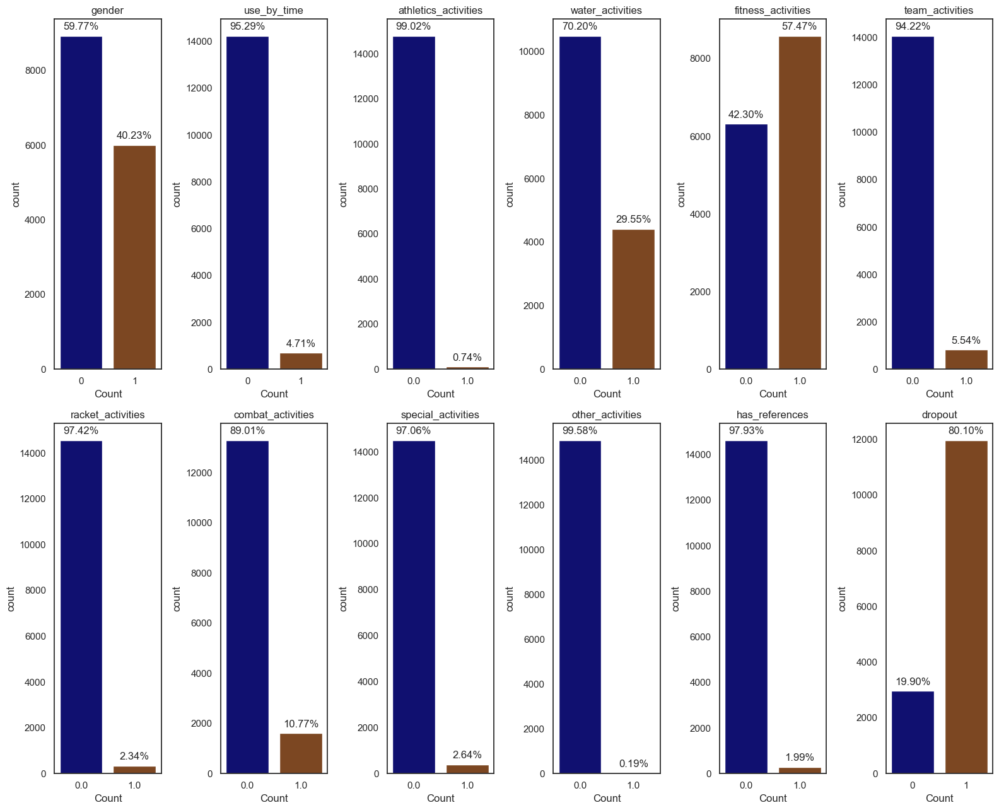

In [115]:
# Create subplots
fig, axes = plt.subplots(2, 6, figsize=(16, 13))

# Flatten the axes array to easily iterate through the subplots
axes = axes.flatten()

# Define the binary features of the dataset
binary_features = df[['gender', 'use_by_time', 'athletics_activities', 'water_activities', 'fitness_activities',
       'team_activities', 'racket_activities', 'combat_activities', 'special_activities', 'other_activities', 'has_references',
                                          'dropout']]

# Define two colors for the bars: navy blue and brown
colors = ['navy', 'saddlebrown']

# Create horizontal countplots for each binary feature
for i, feature in enumerate(binary_features):
    ax = sns.countplot(data=df, x=feature, ax=axes[i], palette=colors)  # Use x instead of y
    axes[i].set_title(f'{feature}')
    axes[i].set_xlabel('Count')  # Set label for the x-axis

    # Calculate percentage values
    total = len(df)
    for p in ax.patches:
        # Calculate the percentage as (count of category / total) * 100
        percentage = 100 * p.get_height() / total
        
        # Annotate the percentage on top of each bar
        ax.annotate(f'{percentage:.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Hide the second row and sixth column subplot
for i in range(len(binary_features), 2 * 6):
    fig.delaxes(axes[i])

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

### *Takeaways*

- Notably, 'gender', 'water_activities,' and 'fitness_activities' exhibit balanced or close-to-balanced distributions. The least represented class, denoted as '1' in 'water_activities,' constitutes 29.55% of the values in that feature.

- On the other hand, 'dropout' can be characterized as moderately imbalanced, with the minority class '0' accounting for only 19.90% of the values.

- The remaining features are deemed imbalanced, demonstrating low and very low values for their respective minority classes. The highest minority class representation is observed in 'combat_activities' with 10.77% for '1', while 'other_activities' has the lowest representation at 0.19% for the '1' class. These imbalances suggest a skewed distribution within these features, with certain classes being significantly underrepresented compared to others.

<a name="data-preprocessing"></a>
# 3. Data Preprocessing

<a name='1st-outlier-removal'></a>
## 3.1. 1st Outlier Removal

In [116]:
# Initialize an empty list to store indices of outliers for future outlier cluster reclassification
outlier_indices = []

In [117]:
# A reminder of the dataset's columns, non-null values and datatypes. Note that the 'gender' column is not of type
# 'object' anymore but rather 'int', in which 0's stands for Female and 1's stands for Male.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14942 entries, 0 to 14941
Data columns (total 28 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   age                              14942 non-null  int64  
 1   gender                           14942 non-null  int64  
 2   income                           14447 non-null  float64
 3   enrollment_start                 14942 non-null  object 
 4   enrollment_finish                14942 non-null  object 
 5   last_period_start                14942 non-null  object 
 6   last_period_finish               14942 non-null  object 
 7   date_last_visit                  14942 non-null  object 
 8   days_without_frequency           14942 non-null  int64  
 9   lifetime_value                   14942 non-null  float64
 10  use_by_time                      14942 non-null  int64  
 11  athletics_activities             14906 non-null  float64
 12  water_activities  

In [118]:
# Define features related to metrics (discrete or continuous).
metric_features = ['age', 'income', 'days_without_frequency', 'lifetime_value', 'number_of_frequencies',
                   'attended_classes', 'allowed_weekly_visits_by_sla', 'allowed_number_of_visits_by_sla',
                   'real_number_of_visits', 'number_of_renewals', 'number_of_references']

# Define binary features (representing categories with two values, 0 or 1)
binary_features = ['gender', 'use_by_time', 'athletics_activities', 'water_activities', 'fitness_activities',
                   'team_activities', 'racket_activities', 'combat_activities', 'special_activities',
                   'other_activities', 'has_references', 'dropout']

# Define date features (representing dates or time-related information)
date_features = ['enrollment_start', 'enrollment_finish', 'last_period_start', 'last_period_finish', 'date_last_visit']

<a name="metric-features-1st-outlier"></a>
### Metric Features

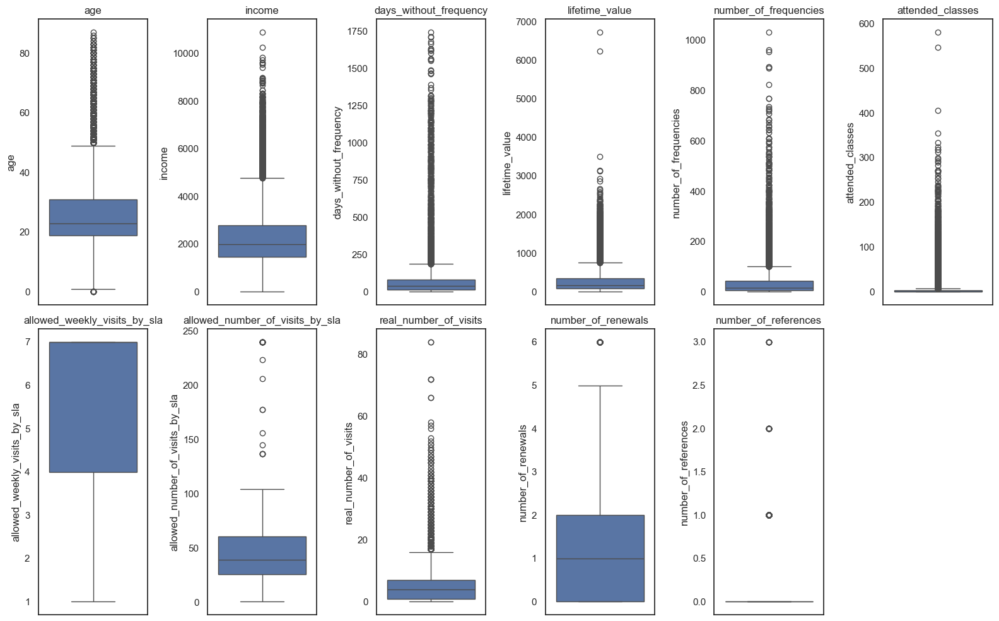

In [119]:
# There are 11 metric features, therefore set the number of rows to 2 and the number of columns to 6
num_cols = 6
num_rows = 2

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 10))

# Flatten the axes array to easily iterate through the subplots
axes = axes.flatten()

# Create boxplots for each metric feature
for i, feature in enumerate(metric_features):
    sns.boxplot(data=df, y=feature, ax=axes[i])
    axes[i].set_title(f'{feature}')

# Hide the second row and sixth column subplot
for i in range(len(metric_features), num_rows * num_cols):
    fig.delaxes(axes[i])

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

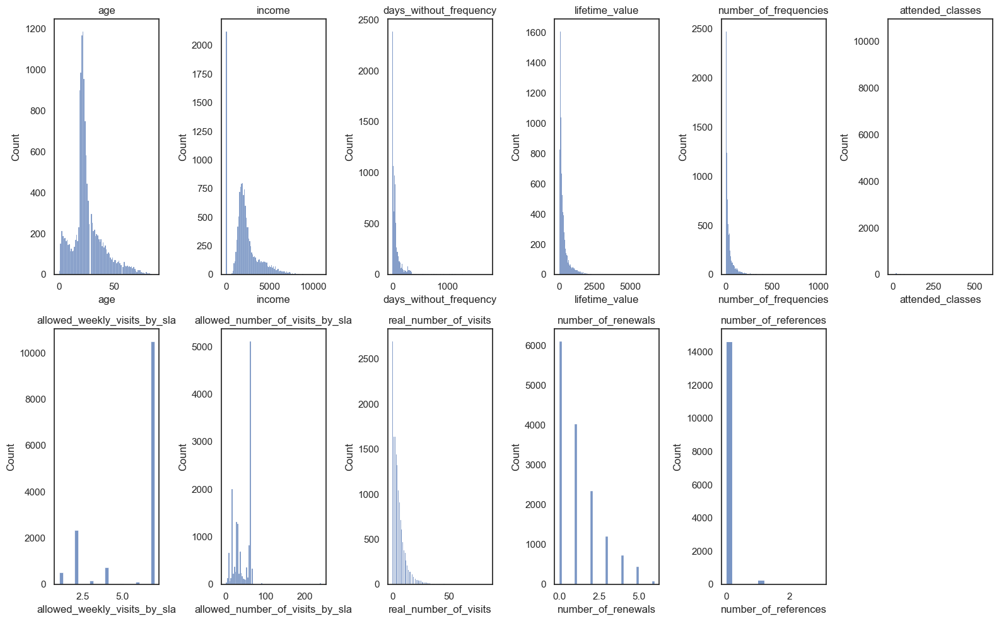

In [120]:
# There are 11 metric features, therefore set the number of rows to 2 and the number of columns to 6
num_cols = 6
num_rows = 2

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 10))

# Flatten the axes array to easily iterate through the subplots
axes = axes.flatten()

# Create histograms for each metric feature
for i, feature in enumerate(metric_features):
    sns.histplot(data=df, x=feature, kde=False, ax=axes[i])
    axes[i].set_title(f'{feature}')

# Hide the second row and sixth column subplot
for i in range(len(metric_features), num_rows * num_cols):
    fig.delaxes(axes[i])

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

**Outlier Handling Approach Based on Metric Features Boxplots & Histograms Analysis**

* In the process of managing the more extreme outliers, a comprehensive analysis of the dataset's boxplots and histograms was carried out. This analysis aimed to identify specific data points that exhibited exceptionally deviant behavior, distinctly distant from the main cluster of data. The strategy involved selectively removing these extreme outliers while preserving a substantial amount of the dataset.

* To implement this approach, the following key decisions were made:

    - Removal of 'lifetime_value' Outliers: It was determined that data points with 'lifetime_value' greater than 6000 were exceptionally rare and notably far from the central distribution of values. These extreme outliers, which could potentially distort the overall analysis and modeling, were removed from the dataset.

    - Removal of 'attended_classes' Outliers: Data points with 'attended_classes' exceeding 500 were considered as highly unusual and significantly distant from the typical range of attendance. To maintain data integrity and enhance the quality of analysis, these extreme 'attended_classes' outliers were also removed.
    
    - Removal of 'allowed_number_of_visits_by_sla' Outliers: Data points with 'allowed_number_of_visits_by_sla' exceeding 200 were considered as highly unusual and significantly distant from the typical range of the allowed number of visits the customers can make to the facilities according to the service they had hired in the last 2 months of their registration. To maintain data integrity and enhance the quality of analysis, these extreme 'allowed_number_of_visits_by_sla' outliers were also removed.

    - Removal of 'real_number_of_visits' Outliers: Similarly, data points with 'real_number_of_visits' surpassing 70 were recognized as extremely uncommon and far removed from the central pattern. To prevent these outliers from adversely affecting the analysis, they were eliminated from the dataset.

    - Removal of 'number_of_references' Outliers: It was observed that 'number_of_references' values exceeding 0.5 were rare and positioned far from the majority of observations. In order to maintain a consistent and reliable dataset, these extreme outliers were systematically removed.

In [121]:
# Create a copy of the dataset for outlier handling operations
no_outlier_df = df.copy()

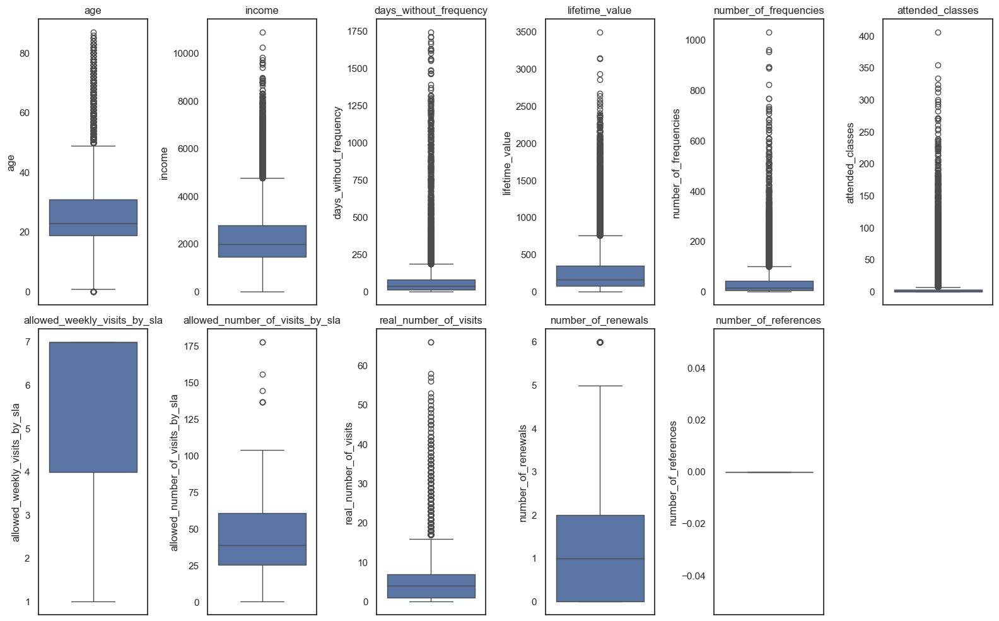

In [122]:
# Define the number of rows and columns for subplots
num_cols = 6
num_rows = 2

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 10))

# Flatten the axes array to easily iterate through the subplots
axes = axes.flatten()

# Define the extreme outlier removal criteria for each metric feature, 
# discussed in 'Outlier Handling Approach Based on Metric Features Boxplots & Histograms Analysis'
outlier_criteria = {
    'lifetime_value': 6000,
    'attended_classes': 500,
    'allowed_number_of_visits_by_sla': 200,
    'real_number_of_visits': 70,
    'number_of_references': 0.5
}

# Create boxplots for each metric feature and remove extreme outliers
for i, feature in enumerate(metric_features):
    # Check if the feature has a specific outlier criterion in the dictionary
    criterion = outlier_criteria.get(feature, None)
    
    if criterion is not None:
        # If it does, filter the data to remove more extreme outliers
        filtered_data = no_outlier_df[no_outlier_df[feature] <= criterion]
    else:
        # Otherwise, if no specific criterion is defined, use the original data
        filtered_data = no_outlier_df
    
    # Create boxplots for each metric feature
    sns.boxplot(data=filtered_data, y=feature, ax=axes[i])
    axes[i].set_title(f'{feature}')

# Hide the second row and sixth column subplot
for i in range(len(metric_features), num_rows * num_cols):
    fig.delaxes(axes[i])

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

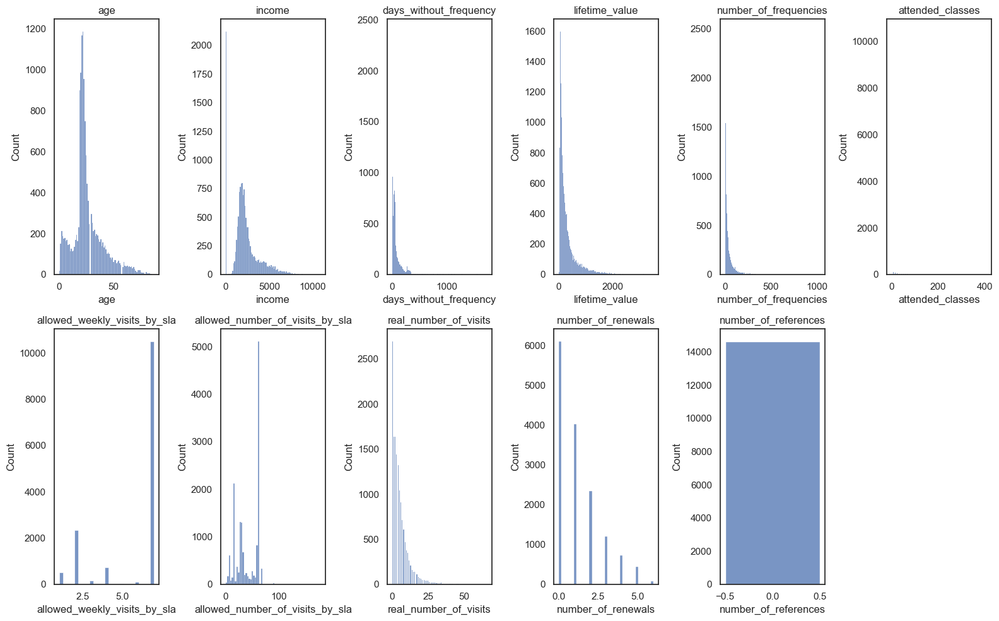

In [123]:
# Define the number of rows and columns for subplots
num_cols = 6
num_rows = 2

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 10))

# Flatten the axes array to easily iterate through the subplots
axes = axes.flatten()

# Define the extreme outlier removal criteria for each metric feature, 
# discussed in 'Outlier Handling Approach Based on Metric Features Boxplots & Histograms Analysis'
outlier_criteria = {
    'lifetime_value': 6000,
    'attended_classes': 500,
    'allowed_number_of_visits_by_sla': 200,
    'real_number_of_visits': 70,
    'number_of_references': 0.5
}

# Create boxplots for each metric feature and remove extreme outliers
for i, feature in enumerate(metric_features):
    # Check if the feature has a specific outlier criterion in the dictionary
    criterion = outlier_criteria.get(feature, None)
    
    if criterion is not None:
        # If it does, filter the data to remove more extreme outliers
        filtered_data = no_outlier_df[no_outlier_df[feature] <= criterion]
    else:
        # Otherwise, if no specific criterion is defined, use the original data
        filtered_data = no_outlier_df
    
    # Create histograms for each metric feature
    sns.histplot(data=filtered_data, x=feature, kde=False, ax=axes[i])
    axes[i].set_title(f'{feature}')

# Hide the second row and sixth column subplot
for i in range(len(metric_features), num_rows * num_cols):
    fig.delaxes(axes[i])

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

In [124]:
# The distribution of the values in the 'number_of_references' was further examined.

# Count and display the occurrences of each value in the 'number_of_references' feature.
value_counts = no_outlier_df['number_of_references'].value_counts()
value_counts

number_of_references
0    14646
1      267
2       21
3        8
Name: count, dtype: int64

**Refining Outlier Handling for 'number_of_references' Feature**

* In the process of addressing outliers within the 'number_of_references' variable, a nuanced scenario unfolded. Initially, after conducting a thorough examination using boxplots and histograms, it was determined that categories 1, 2, and 3 should be removed as they exhibited characteristics of extreme outliers, resulting in the retention of only category 0.

* However, upon closer scrutiny of the dataset, a pivotal observation was made. A value count of the original records pre-outlier handling disclosed that category 1 encompassed a significant number of data points, specifically 267 records. This realization triggered a reconsideration of the outlier handling strategy.

* In the spirit of preserving valuable data while adhering to the objective of outlier management, a decision was made. Categories 2 and 3, which represented a comparatively smaller number of records (29 in total), were removed, in alignment with the initial boxplot indications. Meanwhile, the records pertaining to category 1 were preserved, recognizing their substantive presence in the dataset.

* This refined approach acknowledges the importance of balancing effective outlier management with the retention of pertinent data. As a result, category 1, comprising 267 records, remains a relevant component of the 'number_of_references' feature, contributing valuable insights to the subsequent analysis and clustering.

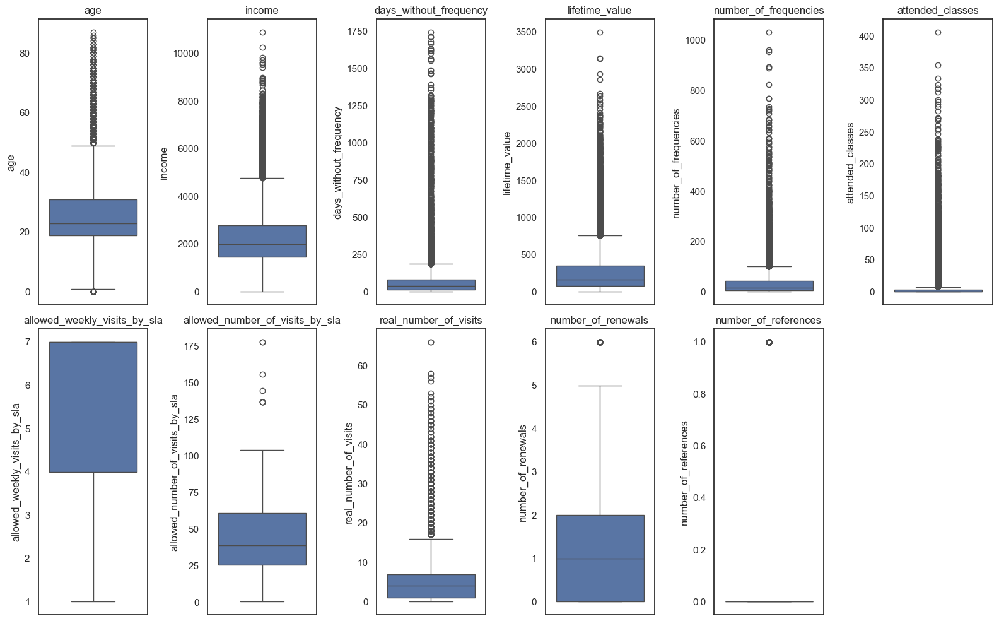

In [125]:
# Define the number of rows and columns for subplots
num_cols = 6
num_rows = 2

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 10))

# Flatten the axes array to easily iterate through the subplots
axes = axes.flatten()

# Define the extreme outlier removal criteria for each metric feature, 
# after the redifining outlier handling for the 'number_of_references' feature
outlier_criteria = {
    'lifetime_value': 6000,
    'attended_classes': 500,
    'allowed_number_of_visits_by_sla': 200,
    'real_number_of_visits': 70,
    'number_of_references': 1
}

# Create boxplots for each metric feature and remove extreme outliers
for i, feature in enumerate(metric_features):
    # Check if the feature has a specific outlier criterion in the dictionary
    criterion = outlier_criteria.get(feature, None)
    
    if criterion is not None:
        # If it does, filter the data to remove more extreme outliers
        filtered_data = no_outlier_df[no_outlier_df[feature] <= criterion]
    else:
        # Otherwise, if no specific criterion is defined, use the original data
        filtered_data = no_outlier_df
    
    # Create boxplots for each metric feature
    sns.boxplot(data=filtered_data, y=feature, ax=axes[i])
    axes[i].set_title(f'{feature}')

# Hide the second row and sixth column subplot
for i in range(len(metric_features), num_rows * num_cols):
    fig.delaxes(axes[i])

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

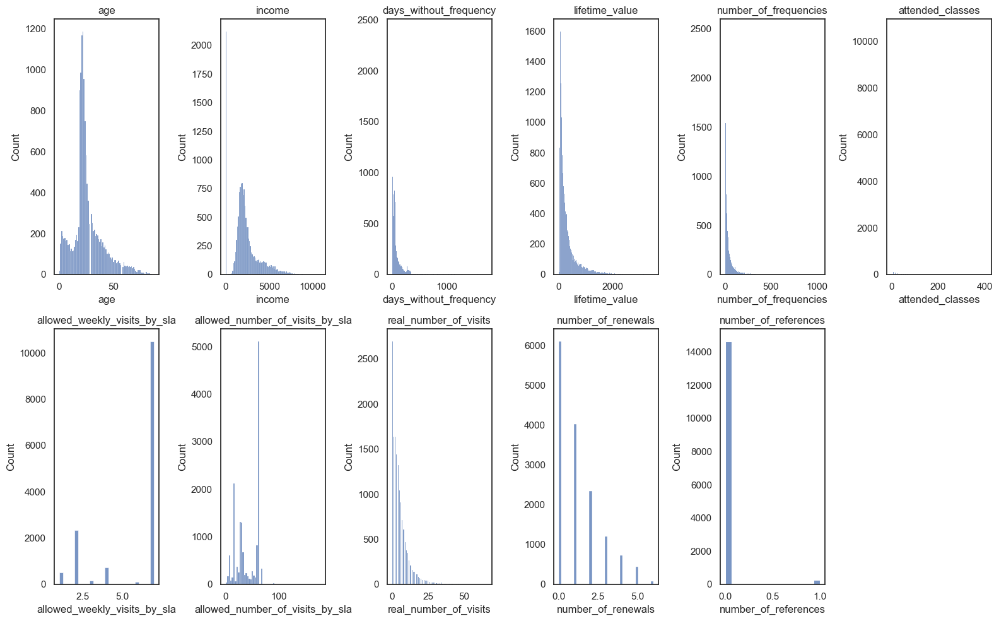

In [126]:
# Define the number of rows and columns for subplots
num_cols = 6
num_rows = 2

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 10))

# Flatten the axes array to easily iterate through the subplots
axes = axes.flatten()

# Define the extreme outlier removal criteria for each metric feature, 
# after the redifining outlier handling for the 'number_of_references' feature
outlier_criteria = {
    'lifetime_value': 6000,
    'attended_classes': 500,
    'allowed_number_of_visits_by_sla': 200,
    'real_number_of_visits': 70,
    'number_of_references': 1
}

# Create boxplots for each metric feature and remove extreme outliers
for i, feature in enumerate(metric_features):
    # Check if the feature has a specific outlier criterion in the dictionary
    criterion = outlier_criteria.get(feature, None)
    
    if criterion is not None:
        # If it does, filter the data to remove more extreme outliers
        filtered_data = no_outlier_df[no_outlier_df[feature] <= criterion]
    else:
        # Otherwise, if no specific criterion is defined, use the original data
        filtered_data = no_outlier_df
    
    # Create histograms for each metric feature
    sns.histplot(data=filtered_data, x=feature, kde=False, ax=axes[i])
    axes[i].set_title(f'{feature}')

# Hide the second row and sixth column subplot
for i in range(len(metric_features), num_rows * num_cols):
    fig.delaxes(axes[i])

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

In [127]:
# Store indices of outliers based on 'number_of_references' condition
outliers = no_outlier_df[(no_outlier_df['number_of_references'] != 0) & (no_outlier_df['number_of_references'] != 1)].index
outlier_indices.extend(outliers.tolist())

# Actual outlier removal for 'number_of_references'
no_outlier_df = no_outlier_df[(no_outlier_df['number_of_references'] == 0) | (no_outlier_df['number_of_references'] == 1)]

# Define custom outlier criteria for specific metric features
outlier_criteria = {
    'lifetime_value': 6000,
    'attended_classes': 500,
    'allowed_number_of_visits_by_sla': 200,
    'real_number_of_visits': 70,
}

# Loop through each metric feature and apply outlier removal based on the defined criteria
for feature, criterion in outlier_criteria.items():
    # Store indices of outliers based on each feature's criterion
    outliers = no_outlier_df[no_outlier_df[feature] > criterion].index
    outlier_indices.extend(outliers.tolist())

    # Remove outliers for the current feature
    no_outlier_df = no_outlier_df[no_outlier_df[feature] <= criterion]

# Now, outlier_indices contains indices of all the outliers removed

In [128]:
print(f'The percentage of original data removed after the first metric outlier handling is {(round(1 - no_outlier_df.shape[0]/df.shape[0],3))*100}%')

The percentage of original data removed after the first metric outlier handling is 0.4%


<a name="binary-features-1st-outlier"></a>
### Binary Features

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

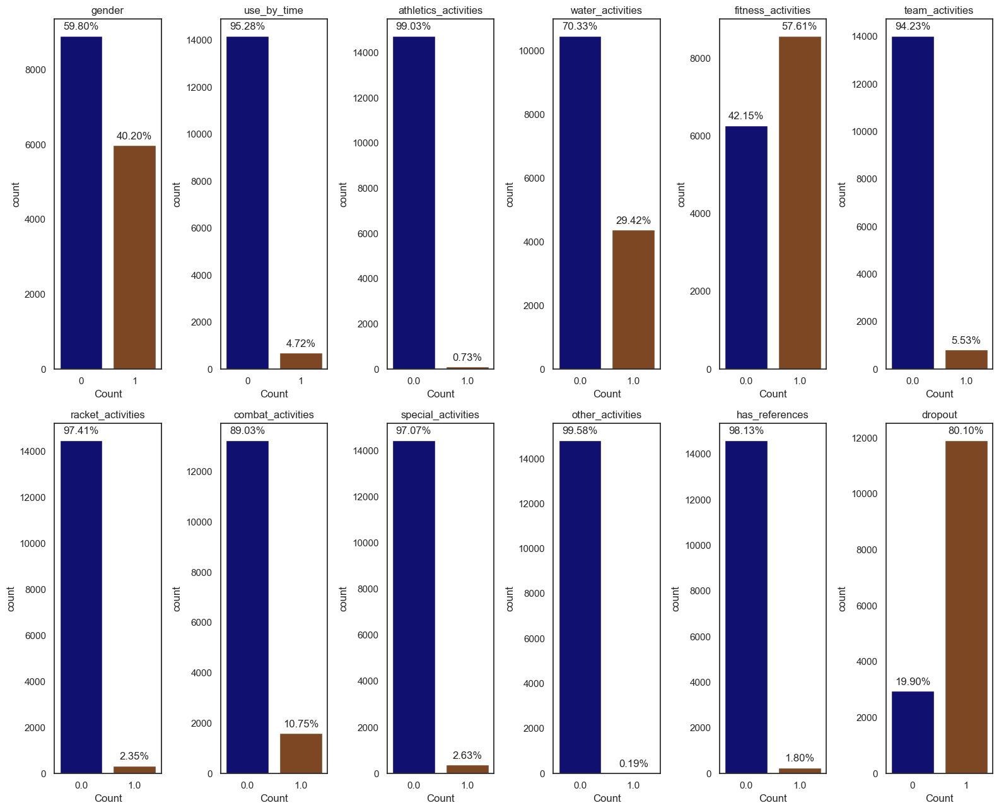

In [129]:
# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 13))

# Flatten the axes array to easily iterate through the subplots
axes = axes.flatten()

# Define two colors for the bars: navy blue and brown
colors = ['navy', 'saddlebrown']

# Create horizontal countplots for each binary feature
for i, feature in enumerate(binary_features):
    ax = sns.countplot(data=no_outlier_df, x=feature, ax=axes[i], palette=colors)  # Use x instead of y
    axes[i].set_title(f'{feature}')
    axes[i].set_xlabel('Count')  # Set label for the x-axis

    # Calculate percentage values
    total = len(no_outlier_df)
    for p in ax.patches:
        # Calculate the percentage as (count of category / total) * 100
        percentage = 100 * p.get_height() / total
        
        # Annotate the percentage on top of each bar
        ax.annotate(f'{percentage:.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Hide the second row and sixth column subplot
for i in range(len(binary_features), num_rows * num_cols):
    fig.delaxes(axes[i])

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

**Outlier Handling Approach Based on Binary Features Count Plot Analysis**

* In the pursuit of custom segmentation for the dataset, a thorough analysis of the binary features was conducted. This analysis involved the creation of count plots for each binary feature, facilitating the visualization of binary value distributions within these features.

* Upon a meticulous examination of the count plots, a notable pattern emerged within specific binary features, characterized by the dominance of a single binary value. In this analysis, a binary feature was categorized as "dominated" when one of the binary values accounted for over 94% of the feature's distribution. This threshold was chosen to address binary features with less than 6% of one binary value, where records with the minority binary value would be considered outliers and would be subsequently removed. This process would result in binary features dominated by a univariate value.

* Consequently, the decision was made to eliminate the binary features where a single binary value significantly dominated the distribution. Notably, 'use_by_time', 'athletics_activities', 'team_activities', 'racket_activities', 'special_activities', 'other_activities,' and 'has_references' exhibited minimal presence of one of the binary values. 'use_by_time' merely contained 4.72% of '1's, 'athletics_activities' contained merely 0.73% of '1's, 'team_activities' presents only 5.53% of '1's, 'racket_activities' only 2.35% of '1's, 'other_activities' displayed a mere 0.19% of '1's, and 'has_references' had a negligible 1.80 of '1's. The removal of these features was prompted by the substantial imbalance in their binary value distributions and aims to maintain data quality and a more balanced distribution.

* This approach seeks to ensure that the custom segmentation analysis is conducted based on meaningful and balanced binary features, enhancing the accuracy and quality of the segmentation results. The decisions made in this phase contribute to a more robust dataset, aligning with the goal of retaining records that provide valuable insights while effectively addressing outliers in the data. The strategy outlined here establishes a foundation for a more reliable and representative dataset for subsequent stages of the custom segmentation project.

In [130]:
# Create a list of binary features to remove based on their dominance threshold (+94% of a single binary value)
features_to_remove = []

# Define the dominance threshold (94%)
dominance_threshold = 0.94

# Loop through the binary features
for feature in binary_features:
    # Calculate the percentage of the dominant binary value
    dominant_percentage = no_outlier_df[feature].value_counts(normalize=True).max()
    
    # Check if the dominant binary value percentage exceeds the threshold
    if dominant_percentage > dominance_threshold:
        # If it does, add the feature to the list of features to remove
        features_to_remove.append(feature)

# Remove the dominated binary features from the DataFrame
no_outlier_df.drop(features_to_remove, axis=1, inplace=True)

# Delete the binary features to remove from the 'binary_features' list
binary_features = [binary_feature for binary_feature in binary_features if binary_feature not in features_to_remove]

# Ensure the features were correctly removed from the DataFrame
no_outlier_df.columns

Index(['age', 'gender', 'income', 'enrollment_start', 'enrollment_finish',
       'last_period_start', 'last_period_finish', 'date_last_visit',
       'days_without_frequency', 'lifetime_value', 'water_activities',
       'fitness_activities', 'combat_activities', 'number_of_frequencies',
       'attended_classes', 'allowed_weekly_visits_by_sla',
       'allowed_number_of_visits_by_sla', 'real_number_of_visits',
       'number_of_renewals', 'number_of_references', 'dropout'],
      dtype='object')

In [131]:
print(f'The cumulative percentage of original data removed after the first binary outlier handling is {(round(1 - no_outlier_df.shape[0]/df.shape[0],3))*100}%')

The cumulative percentage of original data removed after the first binary outlier handling is 0.4%


<a name="date-features-1st-outlier"></a>
### Date Features

In [132]:
# Iterate through each date feature in the 'date_features' list
for feature in date_features:
    # Convert the original date feature to datetime format
    no_outlier_df[feature] = pd.to_datetime(df[feature])

# Check the data types of the transformed date features
no_outlier_df[date_features].dtypes

enrollment_start      datetime64[ns]
enrollment_finish     datetime64[ns]
last_period_start     datetime64[ns]
last_period_finish    datetime64[ns]
date_last_visit       datetime64[ns]
dtype: object

In [133]:
# Calculate 'enrollment_duration' by subtracting 'enrollment_start' from 'enrollment_finish' and converting to days
no_outlier_df['enrollment_duration'] = (no_outlier_df['enrollment_finish'] - no_outlier_df['enrollment_start']).dt.days

# Add the newly-created 'enrollment_duration' feature to the 'metric_features' lists
metric_features.append('enrollment_duration')

# Calculate 'last_period_duration' by subtracting 'last_period_start' from 'last_period_finish' and converting to days
no_outlier_df['last_period_duration'] = (no_outlier_df['last_period_finish'] - no_outlier_df['last_period_start']).dt.days

# Add the newly-created 'last_period_duration' feature to the 'metric_features' lists
metric_features.append('last_period_duration')

# Define a reference date as January 1, 1970
reference_date = pd.to_datetime('1970-01-01')

# Calculate 'date_last_visit' as the number of days since January 1, 1970
no_outlier_df['date_last_visit'] = (no_outlier_df['date_last_visit'] - reference_date).dt.days

# Add the transformed 'date_last_visit' feature to the 'metric_features' list, as it now contains the number of days since the
# customer's last visit to the sports facility
metric_features.append('date_last_visit')

# Display the first 3 rows of the new duration features and 'date_last_visit'
no_outlier_df[['enrollment_duration', 'last_period_duration', 'date_last_visit']].head(3)

,enrollment_duration,last_period_duration,date_last_visit
0,58,183,18199
1,398,364,16632
2,30,180,17311


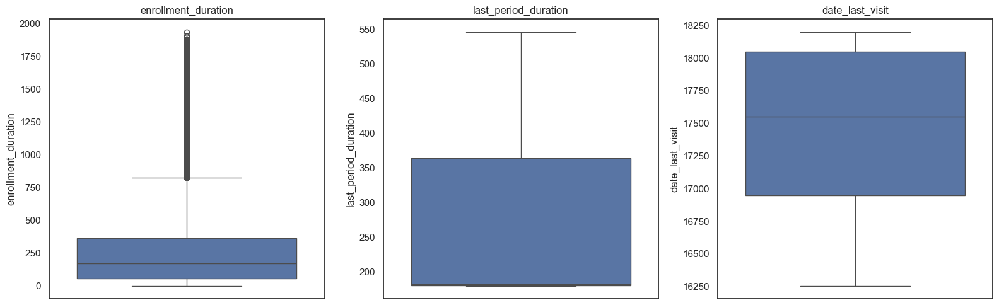

In [134]:
# Create subplots in a 1-row, 3-column grid with a specific figure size
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# Create a boxplot for 'enrollment_duration' in the first subplot
sns.boxplot(data=no_outlier_df, y='enrollment_duration', ax=axes[0])
axes[0].set_title('enrollment_duration')

# Create a boxplot for 'last_period_duration' in the second subplot
sns.boxplot(data=no_outlier_df, y='last_period_duration', ax=axes[1])
axes[1].set_title('last_period_duration')

# Create a boxplot for 'date_last_visit' in the third subplot
sns.boxplot(data=no_outlier_df, y='date_last_visit', ax=axes[2])
axes[2].set_title('date_last_visit')

# Adjust spacing between subplots for better visualization
plt.tight_layout()

# Display the boxplots
plt.show()

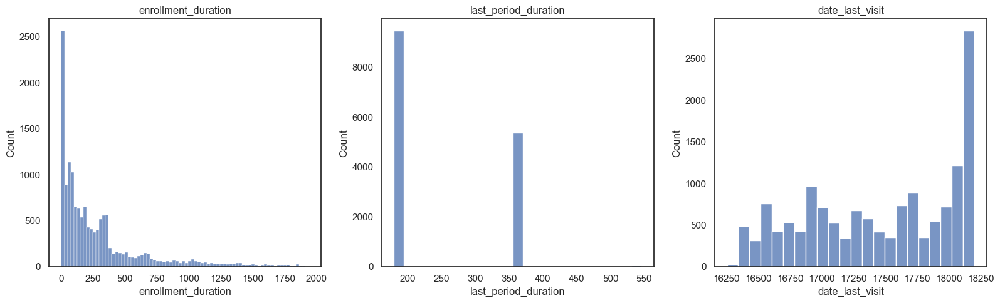

In [135]:
# Create subplots in a 1-row, 3-column grid with a specific figure size
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# Create a histogram for 'enrollment_duration' in the first subplot
sns.histplot(data=no_outlier_df, x='enrollment_duration', kde=False, ax=axes[0])
axes[0].set_title('enrollment_duration')

# Create a histogram for 'last_period_duration' in the second subplot
sns.histplot(data=no_outlier_df, x='last_period_duration', kde=False, ax=axes[1])
axes[1].set_title('last_period_duration')

# Create a histogram for 'date_last_visit' in the third subplot
sns.histplot(data=no_outlier_df, x='date_last_visit', kde=False, ax=axes[2])
axes[2].set_title('date_last_visit')

# Adjust spacing between subplots for better visualization
plt.tight_layout()

# Display the boxplots
plt.show()

**Outlier Handling Approach Based on Date Features Boxplot & Histogram Analysis**

* After conducting an analysis of the boxplots and histograms for the date-related features, including 'enrollment_duration,' 'last_period_duration,' and 'date_last_visit,' it was observed that 'enrollment_duration' is the only feature with the presence of outliers. However, these outliers, though numerous, are closely clustered together.

* Upon careful consideration, it was decided not to remove these outliers, primarily due to their substantial quantity. Removing them would result in a significant loss of data, potentially removing valuable information that could be essential for clustering.

* In contrast, the remaining two features, 'last_period_duration' and 'date_last_visit,' exhibited no outliers, making them suitable for further analysis without the need for outlier removal.

* This approach to outlier handling is aimed at preserving the integrity and richness of the dataset, ensuring that potential insights and nuances are not lost during the data preprocessing phase.

In [136]:
print(f'The cumulative percentage of original data removed after the 1st Outlier Removal stage is {(round(1 - no_outlier_df.shape[0]/df.shape[0],3))*100}%')

The cumulative percentage of original data removed after the 1st Outlier Removal stage is 0.4%


<a name="addressing-data-inconsistencies"></a>
## 3.2. Addressing Data Inconsistencies

In [137]:
# Create a boolean condition to identify inconsistencies where 'last_period_duration' is greater than 0 but 'enrollment_duration' is 0
inconsistencies = (no_outlier_df['last_period_duration'] > 0) & (no_outlier_df['enrollment_duration'] == 0)

# Filter the DataFrame using the boolean condition to get rows with the identified inconsistencies
rows_with_condition = no_outlier_df[inconsistencies]

# Display the relevant columns of the first 3 rows with identified inconsistencies
rows_with_condition[['last_period_duration', 'enrollment_duration']].head(3)

,last_period_duration,enrollment_duration
25,183,0
36,183,0
38,183,0


In [138]:
rows_with_condition['dropout'].value_counts()

dropout
0    2410
Name: count, dtype: int64

**Findings Explanation**

An inconsistency was identified in cases where 'last_period_duration' had a positive value (indicating an active membership period), while 'enrollment_duration' was 0 (suggesting no enrollment duration). Initially, this situation might seem illogical, as an active membership period should imply some enrollment duration.

Upon closer examination, these so-called inconsistencies were discovered to be records of customers who have never canceled their memberships. Since these customers are continuously enrolled, their 'enrollment_finish' date is yet not set, leading to an 'enrollment_duration' of 0 when subtracted from the 'enrollment_start' date. Meanwhile, they have an ongoing 'last_period_duration' that is correctly calculated based on their activity.

The value_counts() method was used on the 'dropout' column for rows with these conditions, revealing that all instances (2,410 in total) had a dropout value of 0. This further confirms that these customers are currently active and have not dropped out, which aligns with the finding that they have never terminated their contracts.

In summary, what appeared to be data inconsistencies turned out to be a logical pattern for a subset of customers with continuous memberships. These customers' records show activity in their last period but no calculated enrollment duration due to the absence of an 'enrollment_finish' date. The discovery emphasizes the importance of contextual understanding when addressing data inconsistecies.

In [139]:
# Find the latest 'last_period_finish' date across all customers in the DataFrame
# This represents the most recent date a customer finished their last membership period
finish_date = max(no_outlier_df['last_period_finish'])

# For rows where 'last_period_duration' is greater than 0 but 'enrollment_duration' is 0,
# which were previously identified as active customers who have never canceled their membership,
# set their 'enrollment_finish' date to the most recent 'last_period_finish' date found in the DataFrame.
no_outlier_df.loc[inconsistencies, 'enrollment_finish'] = finish_date

# After updating the 'enrollment_finish' date for these customers, recalculate their 'enrollment_duration'.
# The new 'enrollment_duration' is the number of days between 'enrollment_start' and the updated 'enrollment_finish'.
# This corrects the earlier issue where the duration was incorrectly set to 0 for continuously enrolled customers.
no_outlier_df.loc[inconsistencies, 'enrollment_duration'] = (
    no_outlier_df.loc[inconsistencies, 'enrollment_finish'] - 
    no_outlier_df.loc[inconsistencies, 'enrollment_start']
).dt.days

In [140]:
finish_date

Timestamp('2019-12-31 00:00:00')

In [141]:
# Find inconsistencies where 'number_of_frequencies' < 'real_number_of_visits'
inconsistencies = no_outlier_df['number_of_frequencies'] < no_outlier_df['real_number_of_visits']

# Display the records with inconsistencies
inconsistent_records = no_outlier_df[inconsistencies][['number_of_frequencies', 'real_number_of_visits']]
inconsistent_records.head(3)

,number_of_frequencies,real_number_of_visits
117,15.0,16
140,5.0,6
165,14.0,17


**Findings Explanation**

An additional inconsistency was identified between two related metrics: 'number_of_frequencies' and 'real_number_of_visits'. The 'number_of_frequencies' is defined as the count of visits to the sports facility from the start of the first enrollment to the end of the last enrollment period. In contrast, 'real_number_of_visits' represents the actual number of visits made during the last active period of the membership. Logically, it is not possible for the 'real_number_of_visits' to exceed the 'number_of_frequencies' because the former is a subset of the latter.

Upon discovery of records where 'number_of_frequencies' was inexplicably less than 'real_number_of_visits', a thorough review was conducted. The decision to rectify this was carefully considered, with the goal of maintaining the highest level of data integrity and consistency across the metrics. Therefore, in instances of discrepancy, these inconsistencies were deemed as data entry errors and they were resolved by deciding that 'number_of_frequencies' would be set equal to 'real_number_of_visits'. This adjustment ensures that the data reflects a coherent and accurate account of member engagement within the observed periods.

In [142]:
# Correct these inconsistencies by setting 'number_of_frequencies' to 'real_number_of_visits'
no_outlier_df.loc[inconsistencies, 'number_of_frequencies'] = no_outlier_df.loc[inconsistencies, 'real_number_of_visits']

**Addressing Data Inconsistencies Approach Explanation**

In the pursuit of data consistency, a thorough process was undertaken to address and correct inconsistencies within the dataset, particularly focusing on the relationship between last_period_duration and enrollment_duration. An initial analysis revealed cases where customers had a positive last_period_duration but a zero enrollment_duration.

Further investigation revealed that these instances were not errors but rather indicative of a specific customer group. These were customers with continuous XYZ Sports memberships who had not canceled their subscriptions. Their enrollment_duration was inaccurately recorded as zero due to the ongoing nature of their memberships, resulting in the absence of an enrollment_finish date.

To rectify this, the most recent date from all customers' last_period_finish was identified and used to update the enrollment_finish date for this customer group. This update corrected the inconsistency, as the enrollment_duration was recalculated to reflect the actual time span between the enrollment_start and the new enrollment_finish date. Subsequent to this, another discrepancy was observed between 'number_of_frequencies' and 'real_number_of_visits'. Upon closer examination, it was clear that in certain records the 'number_of_frequencies', which should encompass the total number of visits from the start of the first enrollment till the end of the last enrollment, was less than 'real_number_of_visits', which counts the visits in the last membership. This was counterintuitive as the latter is a subset of the former and should logically be equal or less.

To address this, it was decided to equalize 'number_of_frequencies' to 'real_number_of_visits' for the affected records. This decision was made to preserve the logical coherence of the data, ensuring that the 'number_of_frequencies' accurately reflected all visits up to the last period.

This methodical approach to data correction ensured an accurate representation of customer engagement, distinguishing between actual data anomalies and patterns consistent with active memberships. The result is a more reliable and accurate dataset, better suited for subsequent analyses and decision-making processes.

In [143]:
# Drop datetime format features from the DataFrame
# These features ('enrollment_start', 'enrollment_finish', 'last_period_start', 'last_period_finish') are being dropped
# because numerical information has already been extracted from them during feature engineering.
# The extracted information provides more relevant data for analysis, making the original datetime features redundant.
no_outlier_df.drop(['enrollment_start', 'enrollment_finish', 'last_period_start', 'last_period_finish'], axis=1, inplace=True)

<a name="missing-data-handling"></a>
## 3.3. Missing Data Handling

In [144]:
# Calculate the percentage of missing data for each column in the DataFrame 'no_outlier_df'
# and store the results in a Series named 'missing_data_by_column'.
missing_data_by_column = (no_outlier_df.isna().sum() / len(no_outlier_df)) * 100

# The 'no_outlier_df.isna().sum()' part generates a Series with counts of missing values for each column,
# and 'len(no_outlier_df)' represents the total number of rows in the DataFrame.
# The division computes the proportion of missing data, and multiplying by 100 converts it to percentages.
# The resulting Series provides insights into the extent of missing data for each column.
missing_data_by_column

age                                0.000000
gender                             0.000000
income                             3.306007
date_last_visit                    0.000000
days_without_frequency             0.000000
lifetime_value                     0.000000
water_activities                   0.248622
fitness_activities                 0.235183
combat_activities                  0.221744
number_of_frequencies              0.167988
attended_classes                   0.000000
allowed_weekly_visits_by_sla       3.594947
allowed_number_of_visits_by_sla    0.000000
real_number_of_visits              0.000000
number_of_renewals                 0.000000
number_of_references               0.000000
dropout                            0.000000
enrollment_duration                0.000000
last_period_duration               0.000000
dtype: float64

### *Takeaways:*

* The dataset exhibits varying degrees of data completeness, with several columns containing no missing values. Essential features such as 'age,' 'gender,' 'enrollment_duration,' 'last_period_duration', 'date_last_visit,' 'days_without_frequency,' 'lifetime_value,' 'attended_classes,' 'number_of_renewals,' 'number_of_references' and 'dropout', are entirely free from missing data, contributing to the overall dataset's robustness.

* Columns associated with activity types, including 'water_activities,' 'fitness_activities', 'combat_activities' display a low percentage of missing data, ranging from approximately 0.22% to 0.25%. These features are relevant to customer engagement and may require careful imputation to maintain data quality.

* The 'income' feature, which pertains to customer's income, shows a slightly higher percentage of missing data, approximately 3.30%. Given its importance, addressing the missing information in this column is critical for comprehensive analysis.

* Another noteworthy case is the 'allowed_weekly_visits_by_sla' feature, which exhibits a more substantial rate of missing data, approximately 3.60%. Effective imputation strategies are essential to preserve the integrity of this contractual term-related feature.

* Additionally, the 'number_of_frequencies' feature shows a moderate rate of missing data, approximately 0.17%. Comprehensive analysis and imputation may be necessary to ensure data quality and readiness for further exploration.

In [145]:
# Create a copy of the DataFrame 'no_outlier_df'
no_outlier_no_missing_df = no_outlier_df.copy()

<a name="metric-features-missing-data"></a>
### Metric Features

In [146]:
# Define the metric features with missing data
metric_features_with_missing = ['income', 'number_of_frequencies', 'allowed_weekly_visits_by_sla']

# Initialize the StandardScaler for data standardization on metric features
scaler_no_outlier_no_missing = StandardScaler()

# Select the features to standardize, which correspond to the metric features
features_to_standardize = metric_features

# Standardize the metric features
no_outlier_no_missing_df[features_to_standardize] = scaler_no_outlier_no_missing.fit_transform(no_outlier_no_missing_df[features_to_standardize])

# Initialize the KNNImputer with 5 neighbors
knn_imputer = KNNImputer(n_neighbors=5)

# Impute missing values in the metric features with missings using KNN with 5 neighbors
no_outlier_no_missing_df[metric_features_with_missing] = knn_imputer.fit_transform(no_outlier_no_missing_df[metric_features_with_missing])

In [147]:
# Confirming the successful standardization
no_outlier_no_missing_df[metric_features].head(3)

,age,income,days_without_frequency,lifetime_value,number_of_frequencies,attended_classes,allowed_weekly_visits_by_sla,allowed_number_of_visits_by_sla,real_number_of_visits,number_of_renewals,number_of_references,enrollment_duration,last_period_duration,date_last_visit
0,2.401238,2.089685,-0.555225,-0.594253,-0.477622,-0.106109,-1.116414,-1.783152,-0.533008,-0.871492,-0.134905,-0.861866,-0.736914,1.245067
1,0.210276,0.254800,-0.146529,0.501383,-0.261918,-0.318304,-1.777789,-1.217108,-0.694298,0.578429,-0.134905,-0.090615,1.299564,-1.409964
2,-0.213781,-0.160767,-0.513662,-0.739691,-0.523844,-0.353670,0.584266,-0.576370,0.112151,-0.871492,-0.134905,-0.925380,-0.770668,-0.259507


**Metric Features Missing Data Handling Inputation Approach with KNN Imputer Explanation**

* In this data preprocessing step, the challenge of handling missing data within the metric features was addressed. Metric features, comprising numeric variables vital for the custom segmentation analysis and clustering tasks, were scrutinized for missing values, including 'income,' 'number_of_frequencies,' and 'allowed_weekly_visits_by_sla.'

* The process unfolded in two stages. Initially, data standardization was applied exclusively to the metric features. This crucial step normalizes the scale of these features, ensuring their comparability. It's important to note that binary features were exempted from standardization due to their significant differences from metric features in terms of nature and values.

* Following the standardization, the K-Nearest Neighbors (KNN) Imputer was employed to address the missing data in the metric features. KNN Imputation is a supervised technique that estimates missing values by considering their nearest neighbors in the feature space. It was decided to specify 5 neighbors to influence the imputed values by the closest data points.

* This approach served two objectives: restoration of the integrity of the metric features and maintenance of the original data's statistical distribution. The KNN Imputer identifies the nearest neighbors for each missing value, taking into account distances between data points, to generate imputed values. This methodology provides an informed, data-driven solution for handling gaps in metric features.

* By executing this procedure, completeness and standardization of metric features were ensured, laying a strong foundation for robust data analysis and clustering.

<a name="binary-features-missing-data"></a>
### Binary Features

In [148]:
# List of binary features with missing data
binary_features_with_missing = ['water_activities', 'fitness_activities', 'combat_activities']

# Iterate through each binary feature with missing values
for target_feature in binary_features_with_missing:
    # Step 1: Define the input features for the fitting of the Logistic Regression model
    # Select the input features for the Logistic Regression model
    input_features = metric_features
    
    # Step 2: Data Preparation
    # Create a training dataset with non-missing values except the target binary feature
    training_data = no_outlier_no_missing_df.dropna(subset=[target_feature])
    
    # Create a dataset with only the rows containing missing values for the target binary feature
    missing_data = no_outlier_no_missing_df[no_outlier_no_missing_df[target_feature].isnull()]

    # Step 3: Model Selection
    # Initialize a Logistic Regression model for imputation
    imputation_model = LogisticRegression()

    # Step 4: Model Training
    # Prepare the training data (input features and target binary feature)
    X_train = training_data[input_features]
    y_train = training_data[target_feature]
    
    # Fitting the Logistic Regression model
    imputation_model.fit(X_train, y_train)

    # Step 5: Model Prediction
    # Prepare the data with missing values for the input features
    X_missing = missing_data[input_features]
    
    # Use the trained model to predict the missing binary values
    imputed_values = imputation_model.predict(X_missing)

    # Step 6: Imputation
    # Replace the missing binary feature values with the predicted values
    no_outlier_no_missing_df.loc[missing_data.index, target_feature] = imputed_values

**Binary Features Missing Data Handling Inputation Approach with Logistic Regression Explanation**

*Step 1 - Input Feature Definition:*

- In the initial step, the binary feature necessitating imputation, referred to as the "target_feature," is identified.

- The selection of input features for the Logistic Regression model is made. These input features encompass all metric features, excluding the target binary feature. This step ensures that the imputation model exclusively relies on the available standardized metric features of the dataset.

*Step 2 - Data Preparation:*

- Two distinct datasets are constructed:
    - 'training_data' comprises solely those rows that contain non-missing values for the target binary attribute. This dataset is exclusively employed for the training of the imputation model.

    - 'missing_data' comprises rows that contain missing values for the target binary attribute. These rows represent the dataset requiring imputation.

*Step 3 - Model Selection:*

- Initialization of a Logistic Regression model, a suitable choice for imputing binary features in a supervised learning context.

*Step 4 - Model Training:*

- The model training process commences with the preparation of training data. This includes input features ('X_train') and the target binary feature ('y_train').

- The Logistic Regression model is trained on the training dataset. Through this training, the model becomes capable of predicting the target binary attribute based on the provided input features.

*Step 5 - Model Prediction:*

- The data containing missing values for the input features ('X_missing') is prepared for the subsequent model prediction stage.

- The trained Logistic Regression model is effectively deployed to predict the missing binary values. It generates predictions for the rows housing missing data within the 'missing_data' dataset.

*Step 6 - Imputation:*

- In the concluding step, the missing binary feature values present within the original dataset ('no_outlier_no_missing_df') are substituted with the predicted values ('imputed_values'). This finalizes the imputation of missing binary data using the Logistic Regression model. This approach ensures the supervised imputation of binary features, incorporating information from other dataset attributes and maintaining dataset structural integrity. The process facilitates dataset completion while preserving information reliability, preparing the data for subsequent analyses and modeling.

In [149]:
# Display information about the DataFrame 'no_outlier_no_missing_df' using the .info() method.
# This provides an overview of the dataset, including: size, column names, non-null values, data types and memory usage.
# The output confirms there is no missing data after the missing data inputation process.
no_outlier_no_missing_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14882 entries, 0 to 14941
Data columns (total 19 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   age                              14882 non-null  float64
 1   gender                           14882 non-null  int64  
 2   income                           14882 non-null  float64
 3   date_last_visit                  14882 non-null  float64
 4   days_without_frequency           14882 non-null  float64
 5   lifetime_value                   14882 non-null  float64
 6   water_activities                 14882 non-null  float64
 7   fitness_activities               14882 non-null  float64
 8   combat_activities                14882 non-null  float64
 9   number_of_frequencies            14882 non-null  float64
 10  attended_classes                 14882 non-null  float64
 11  allowed_weekly_visits_by_sla     14882 non-null  float64
 12  allowed_number_of_visit

<a name="feature-engineering"></a>
## 3.4. Feature Engineering

In [150]:
# Create a copy of the DataFrame for the Feature Engineering stage
df_feature_engineer = no_outlier_no_missing_df.copy()

In [151]:
# Invert the standardization for the metric features using the scaler_no_outlier_no_missing's inverse_transform method
df_feature_engineer[metric_features] = scaler_no_outlier_no_missing.inverse_transform(df_feature_engineer[metric_features])

# Display the first 3 rows of the DataFrame to inspect the changes of reverting the standardization
df_feature_engineer.head(3)

,age,gender,income,date_last_visit,days_without_frequency,lifetime_value,water_activities,fitness_activities,combat_activities,number_of_frequencies,attended_classes,allowed_weekly_visits_by_sla,allowed_number_of_visits_by_sla,real_number_of_visits,number_of_renewals,number_of_references,dropout,enrollment_duration,last_period_duration
0,60.0,0,5500.0,18199.0,1.0,89.35,0.0,1.0,0.0,9.0,7.0,3.4,6.28,2.0,0.0,0.0,0,58.0,183.0
1,29.0,0,2630.0,16632.0,60.0,479.20,0.0,0.0,0.0,23.0,1.0,2.0,17.42,1.0,2.0,0.0,1,398.0,364.0
2,23.0,1,1980.0,17311.0,7.0,37.60,0.0,1.0,0.0,6.0,0.0,7.0,30.03,6.0,0.0,0.0,1,30.0,180.0


In [152]:
# Create a binary feature indicating whether the user has references (number_of_references > 0)
df_feature_engineer['has_references'] = (df_feature_engineer['number_of_references'] > 0).astype(int)

# Define bins and labels for creating age groups
bins = [0, 20, 35, 49, 65, float('inf')]
labels = ['0-19', '20-34', '35-48', '49-64', '65+']

# Create a categorical feature 'age_group' based on age bins
df_feature_engineer['age_group'] = pd.cut(df_feature_engineer['age'], bins=bins, labels=labels, right=False)

# Create a feature calculating the average weekly frequency throughout the enrollment period
df_feature_engineer['weekly_average_frequency'] = df_feature_engineer['number_of_frequencies'] / (df_feature_engineer['enrollment_duration'] / 7)

# Sum the counts of different activity types to create a 'number_of_activities' feature
activity_features = ['water_activities', 'fitness_activities', 'combat_activities']
df_feature_engineer['number_of_activities'] = df_feature_engineer[activity_features].sum(axis=1)

# Create a feature calculating the average classes attended per week
df_feature_engineer['attended_classes_weekly_average'] = df_feature_engineer['attended_classes'] / (df_feature_engineer['enrollment_duration'] / 7)

# Create a feature calculating the visits ratio by dividing real_number_of_visits by allowed_number_of_visits_by_sla
df_feature_engineer['visits_ratio'] = df_feature_engineer['real_number_of_visits'] / df_feature_engineer['allowed_number_of_visits_by_sla']

In [153]:
# Append the newly created binary feature to the binary_features list
binary_features.append('has_references')

# Create a new list 'categorical_features' to store the new engineered categorical feature 'age_group'
categorical_features = ['age_group']

# Append the newly created metric features to the metric_features list
metric_features.extend(['weekly_average_frequency', 'number_of_activities', 'attended_classes_weekly_average', 'visits_ratio'])

#### *New Binary Feature*

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


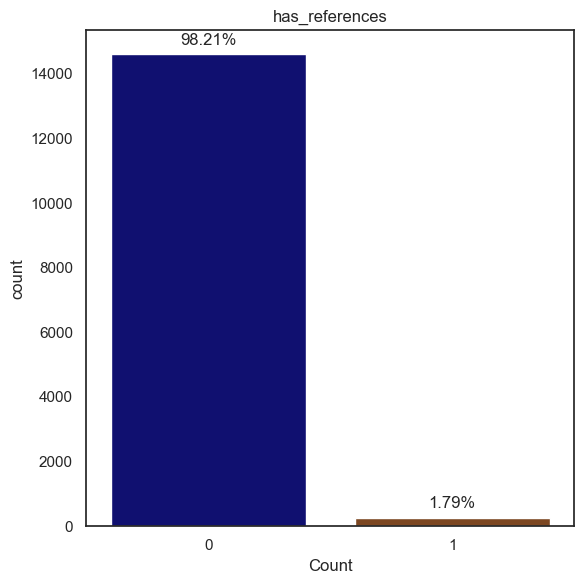

In [154]:
# Create subplots
fig, axes = plt.subplots(1, 1, figsize=(6, 6))

# Define two colors for the bars: navy blue and brown
colors = ['navy', 'saddlebrown']

# Create horizontal countplots for each binary feature
for i, feature in enumerate(binary_feature for binary_feature in binary_features if binary_feature == 'has_references'):
    ax = sns.countplot(data=df_feature_engineer, x=feature, ax=axes, palette=colors)  # Use x instead of y
    axes.set_title(f'{feature}')
    axes.set_xlabel('Count')  # Set label for the x-axis

    # Calculate percentage values
    total = len(no_outlier_df)
    for p in ax.patches:
        # Calculate the percentage as (count of category / total) * 100
        percentage = 100 * p.get_height() / total
        
        # Annotate the percentage on top of each bar
        ax.annotate(f'{percentage:.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

In [155]:
# Drop the feature 'has_references' from the dataset due to the extremely lack of variability 
df_feature_engineer.drop('has_references', axis=1, inplace=True)

# Remove 'has_references' from the 'binary_features' list
binary_features.remove('has_references')

**New Binary Feature ('has_references') Approach Explanation**

After introducing the new feature 'has_references,' which signifies whether a customer has references (number_of_references > 0), and infers the existence of family or friendship relationships in the XYZ Sports Company, it was observed that, after the preprocessing steps undertaken so far, this feature remained univariate at class 0. This univariate nature indicates that, following the preprocessing steps, all customers exhibit no family or friendship relationships within the XYZ Sports Company. Consequently, in light of the lack of variability and informativeness provided by this feature, it has been decided to drop 'has_references' from the dataset to enhance the efficiency of the subsequent custom segmentation analysis.

#### *New Categorical Feature*

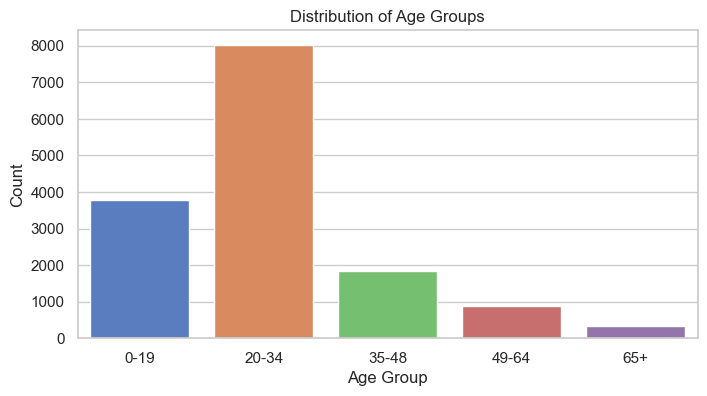

In [156]:
sns.set(style="whitegrid")

# Create a bar plot for the 'age_group' feature
plt.figure(figsize=(8, 4))
sns.countplot(x='age_group', data=df_feature_engineer, palette='muted')

# Set plot labels and title
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.title('Distribution of Age Groups')

# Show the plot
plt.show()

In [157]:
df_feature_engineer['age_group'].value_counts(normalize=True)*100

age_group
20-34    53.917484
0-19     25.453568
35-48    12.404247
49-64     5.906464
65+       2.318237
Name: proportion, dtype: float64

**New Categorical Feature ('age_groups') Approach Explanation**

The distribution of the 'age_groups' variable reveals important insights into the demographic composition of customers in the XYZ Sports Company dataset. The majority of customers, constituting ~53.92%, fall within the age group of 20 to 34 years. Following closely, the 0-19 age group represents a significant portion at ~25.45%, highlighting a considerable presence of younger individuals.

Additionally, the dataset includes customers aged 35-48 (12.40%), 49-64 (5.91%), and those aged 65 and above (~2.32%). These findings suggest a diverse age range among customers, with a notable concentration in the 20-34 and 0-19 age brackets. Understanding these age distributions is crucial for tailoring business strategies and services to cater effectively to the different demographic segments within the customer base.

#### *New Metric Features*

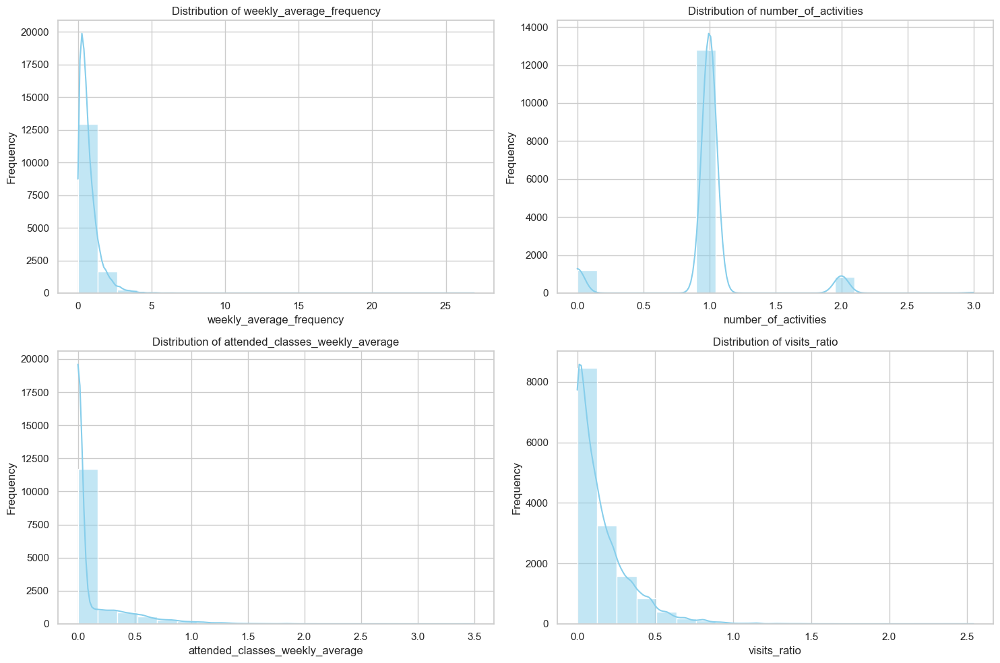

In [158]:
# Set the style for the plot
sns.set(style="whitegrid")

# Create subplots for each metric feature
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))

# Flatten the axes for easy iteration
axes = axes.flatten()

# List of metric features
metric_features_to_plot = ['weekly_average_frequency', 'number_of_activities', 'attended_classes_weekly_average', 'visits_ratio']

# Create histograms for each metric feature
for i, feature in enumerate(metric_features_to_plot):
    sns.histplot(df_feature_engineer[feature], bins=20, kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Frequency')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

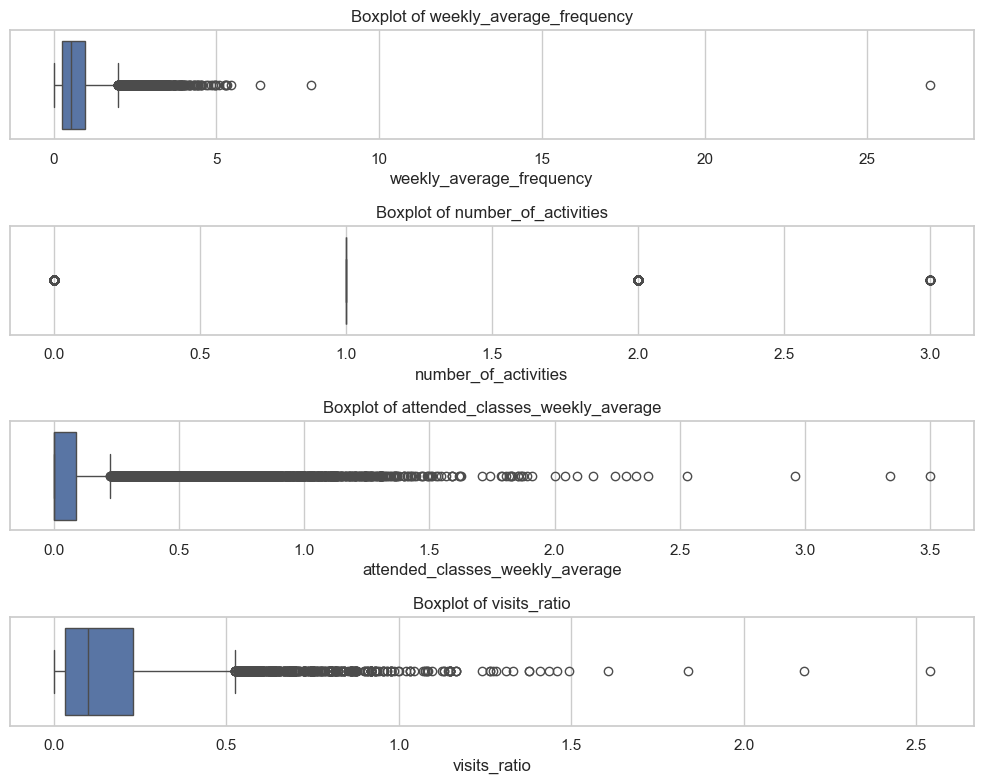

In [159]:
# Features to plot
features_to_plot = ['weekly_average_frequency', 'number_of_activities', 'attended_classes_weekly_average', 'visits_ratio']

# Create subplots
fig, axes = plt.subplots(nrows=len(features_to_plot), figsize=(10, 8))

# Plot boxplots for each feature
for i, feature in enumerate(features_to_plot):
    sns.boxplot(x=df_feature_engineer[feature], ax=axes[i])
    axes[i].set_title(f'Boxplot of {feature}')
    axes[i].set_xlabel(feature)

# Adjust layout
plt.tight_layout()
plt.show()

In [160]:
# Set values greater than 1 in 'visits_ratio' to 1
df_feature_engineer['visits_ratio'] = np.minimum(df_feature_engineer['visits_ratio'], 1)

**New Metric Features ('weekly_average_frequency', 'number_of_activities', 'attended_classes_weekly_average', 'visits_ratio') Approach Explanation**

After thorough analysis of the newly created metrics features, it was observed that in the feature 'visits_ratio', some values exceeded the expected range. The 'visits_ratio' was calculated as the ratio between the 'real_number_of_visits' and the 'allowed_number_of_visits_by_sla,' indicating the extent to which customers utilized their allowed visits in their last period of registration. Given the nature of these variables, the ratio was expected to be at most 1. 

However, anomalies were identified where 'visits_ratio' surpassed 1. This inconsistency suggested a potential issue in the dataset or an oversight in data entry. To address this, all instances where 'visits_ratio' exceeded 1 were adjusted to 1. This decision was based on the assumption that customers who appeared to have surpassed their allowed visits had attended special extra open days or company events during their last registration period. For the purpose of this analysis, these instances were normalized by setting the 'visits_ratio' to 1, indicating that these customers fulfilled their allowed visits during the specified period.

In [161]:
# Initialize the Scaler
scaler = StandardScaler()

# Standardize the metric features
df_feature_engineer[metric_features] = scaler.fit_transform(df_feature_engineer[metric_features])

# Confirm the success of the standardization
df_feature_engineer[metric_features].head(3)

,age,income,days_without_frequency,lifetime_value,number_of_frequencies,attended_classes,allowed_weekly_visits_by_sla,allowed_number_of_visits_by_sla,real_number_of_visits,number_of_renewals,number_of_references,enrollment_duration,last_period_duration,date_last_visit,weekly_average_frequency,number_of_activities,attended_classes_weekly_average,visits_ratio
0,2.401238,2.113262,-0.555225,-0.594253,-0.478170,-0.106109,-1.073562,-1.783152,-0.533008,-0.871492,-0.134905,-0.861866,-0.736914,1.245067,0.537432,0.051428,2.747465,0.929332
1,0.210276,0.263346,-0.146529,0.501383,-0.262387,-0.318304,-1.730501,-1.217108,-0.694298,0.578429,-0.134905,-0.090615,1.299564,-1.409964,-0.453653,-2.569616,-0.395200,-0.564332
2,-0.213781,-0.155624,-0.513662,-0.739691,-0.524409,-0.353670,0.615709,-0.576370,0.112151,-0.871492,-0.134905,-0.925380,-0.770668,-0.259507,0.993648,0.051428,-0.462016,0.250367


<a name="2nd-outlier-removal"></a>
## 3.5. 2nd Outlier Removal

### *Correlation Matrix*

locator: <matplotlib.ticker.AutoLocator object at 0x00000214205F6950>


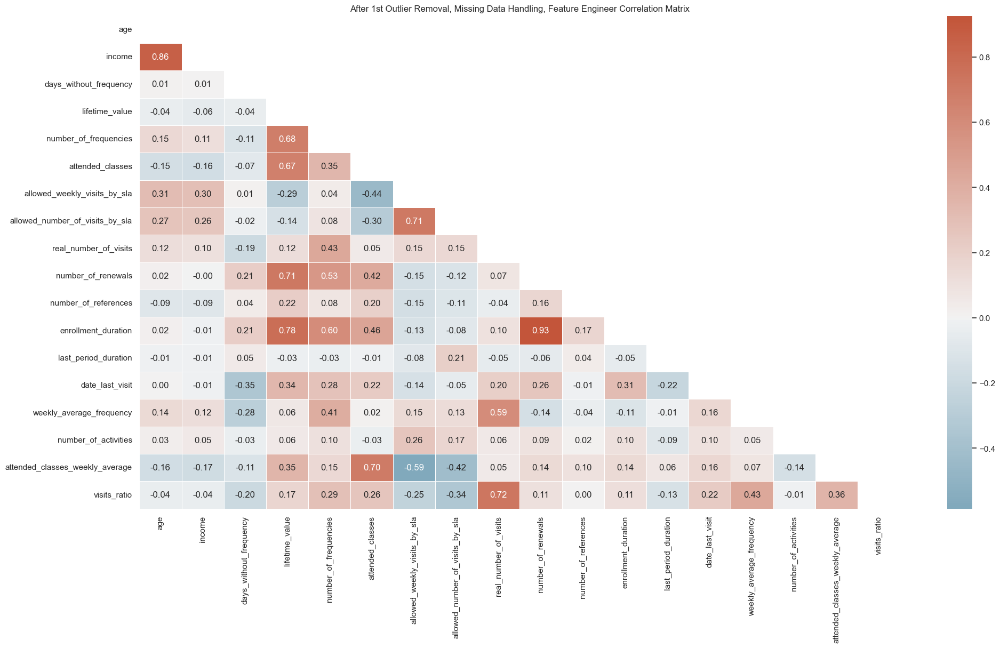

In [162]:
# Calculate the correlation matrix for the DataFrame 'df_feature_engineer'
correlation_matrix = df_feature_engineer[metric_features].corr()

# Create a mask for the upper triangle of the correlation matrix
upper_triangle = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the figure for the heatmap and define its size
plt.figure(figsize=(23, 12))

# Set the style for the heatmap
sns.set(style="white")

# Create a color palette for the heatmap using a diverging color scheme
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Create the heatmap using the correlation matrix, applying the mask, and annotating values
sns.heatmap(correlation_matrix, mask=upper_triangle, annot=True, cmap=cmap, center=0, linewidths=0.5, fmt=".2f")

# Set the title for the heatmap
plt.title("After 1st Outlier Removal, Missing Data Handling, Feature Engineer Correlation Matrix")

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)

# Show the correlation matrix heatmap
plt.show()

### *Takeaways*

#### Positive Strong Correlations
- **Age and Income**: A strong positive correlation suggests that income may increase with age.
- **Lifetime Value, Number of Renewals, and Enrollment Duration**: Indicates that longer memberships tend to contribute significantly to a customer's lifetime value and enhance the change of a membership renewal.

#### Positive Moderate Correlations
- **Number of Frequencies, and Enrollment Duration**: Moderately positive correlation could imply that frequent visitors are more likely to have longer membership contracts.
- **Allowed Weekly Visits by SLA and Allowed Number of Visits by SLA**: This moderate correlation suggests an alignment between these two visitation policy metrics.
- **Real Number of Visits and Visits Ratio**: This moderate positive correlation suggests an alignment between the total number of visits a customer made to the facility in the last period of the registration and the ratio between that same metric over the allowed number of visits to the facilities according to the service hired.

#### Negative Strong Correlations
- *No strong negative correlations observed in the dataset.*

#### Negative Moderate Correlations
- **Allowed Weekly Visits by SLA and Attended Weekly Average**: Moderately negative correlation indicating that members with fewer allowed visits may present a higher attendence in classes.

<a name="metric-features-2nd-outlier"></a>
### Metric Features

#### *age*

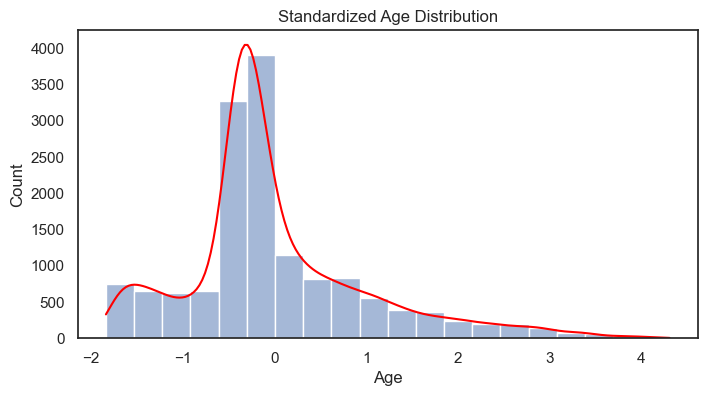

In [163]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized age distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['age'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Age')
plt.title('Standardized Age Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

In [164]:
# Identify potential outliers based on the standardized 'age' feature
potential_outliers = df_feature_engineer[df_feature_engineer['age'] >= 4]

# Store the indices of these potential outliers in the outlier list
outlier_indices.extend(potential_outliers.index.tolist())

# Print information about potential outliers
print("Detected outliers on age:")
print(potential_outliers.shape[0])
print('\n')

# Calculate and print the percentage of data loss
percentage_loss = (potential_outliers.shape[0] / df_feature_engineer.shape[0]) * 100
print("Percentage of data loss:")
print(f"{percentage_loss:.2f}%")
print('\n')

# Remove records with 'age' above 4
df_feature_engineer = df_feature_engineer[df_feature_engineer['age'] < 4]

# Display the updated shape of the DataFrame after removal
print("Shape of DataFrame after outlier removal:")
print(df_feature_engineer.shape)

Detected outliers on age:
14


Percentage of data loss:
0.09%


Shape of DataFrame after outlier removal:
(14868, 24)


#### *income*

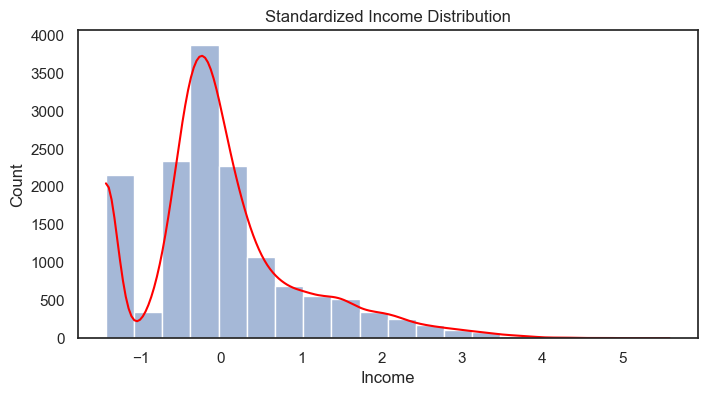

In [165]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized income distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['income'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Income')
plt.title('Standardized Income Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

In [166]:
# Identify potential outliers based on the standardized 'income' feature
potential_outliers_income = df_feature_engineer[df_feature_engineer['income'] >= 4]

# Store the indices of these potential outliers in the outlier list
outlier_indices.extend(potential_outliers_income.index.tolist())

# Print information about potential outliers
print("Detected outliers on income:")
print(potential_outliers_income.shape[0])
print('\n')

# Calculate and print the percentage of data loss
percentage_loss_income = (potential_outliers_income.shape[0] / df_feature_engineer.shape[0]) * 100
print("Percentage of data loss on income:")
print(f"{percentage_loss_income:.2f}%")
print('\n')

# Remove records with 'income' above 4
df_feature_engineer = df_feature_engineer[df_feature_engineer['income'] < 4]

# Display the updated shape of the DataFrame after removal
print("Shape of DataFrame after outlier removal on income:")
print(df_feature_engineer.shape)

Detected outliers on income:
17


Percentage of data loss on income:
0.11%


Shape of DataFrame after outlier removal on income:
(14851, 24)


#### *days_without_frequency*

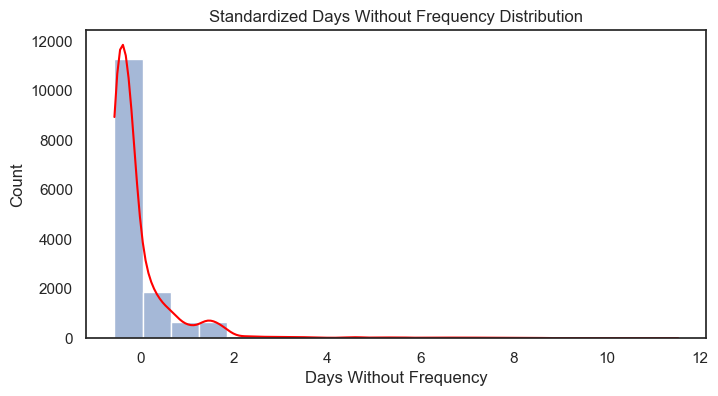

In [167]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized days_without_frequency distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['days_without_frequency'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Days Without Frequency')
plt.title('Standardized Days Without Frequency Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

In [168]:
# Identify potential outliers based on the standardized 'days_without_frequency' feature
potential_outliers_days = df_feature_engineer[df_feature_engineer['days_without_frequency'] >= 10]

# Store the indices of these potential outliers in the outlier list
outlier_indices.extend(potential_outliers_days.index.tolist())

# Print information about potential outliers
print("Detected outliers on days_without_frequency:")
print(potential_outliers_days.shape[0])
print('\n')

# Calculate and print the percentage of data loss
percentage_loss_days = (potential_outliers_days.shape[0] / df_feature_engineer.shape[0]) * 100
print("Percentage of data loss on days_without_frequency:")
print(f"{percentage_loss_days:.2f}%")
print('\n')

# Remove records with 'days_without_frequency' above 10
df_feature_engineer = df_feature_engineer[df_feature_engineer['days_without_frequency'] < 10]

# Display the updated shape of the DataFrame after removal
print("Shape of DataFrame after outlier removal on days_without_frequency:")
print(df_feature_engineer.shape)

Detected outliers on days_without_frequency:
14


Percentage of data loss on days_without_frequency:
0.09%


Shape of DataFrame after outlier removal on days_without_frequency:
(14837, 24)


#### *lifetime_value*

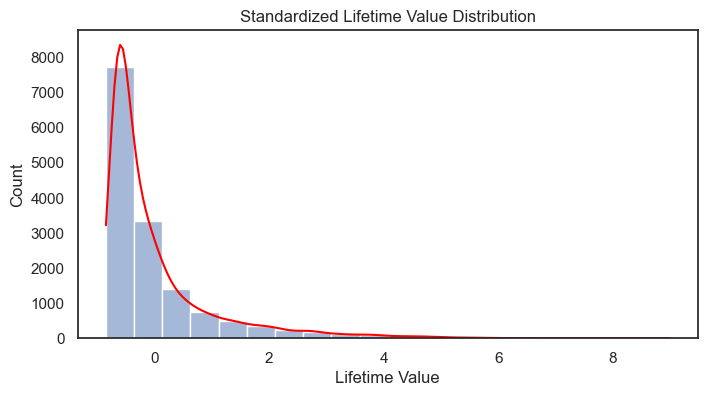

In [169]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized lifetime_value distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['lifetime_value'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Lifetime Value')
plt.title('Standardized Lifetime Value Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

In [170]:
# Identify potential outliers based on the standardized 'lifetime_value' feature
potential_outliers_lifetime = df_feature_engineer[df_feature_engineer['lifetime_value'] >= 6]

# Store the indices of these potential outliers in the outlier list
outlier_indices.extend(potential_outliers_lifetime.index.tolist())

# Print information about potential outliers
print("Detected outliers on lifetime_value:")
print(potential_outliers_lifetime.shape[0])
print('\n')

# Calculate and print the percentage of data loss
percentage_loss_lifetime = (potential_outliers_lifetime.shape[0] / df_feature_engineer.shape[0]) * 100
print("Percentage of data loss on lifetime_value:")
print(f"{percentage_loss_lifetime:.2f}%")
print('\n')

# Remove records with 'lifetime_value' above 6
df_feature_engineer = df_feature_engineer[df_feature_engineer['lifetime_value'] < 6]

# Display the updated shape of the DataFrame after removal
print("Shape of DataFrame after outlier removal on lifetime_value:")
print(df_feature_engineer.shape)

Detected outliers on lifetime_value:
12


Percentage of data loss on lifetime_value:
0.08%


Shape of DataFrame after outlier removal on lifetime_value:
(14825, 24)


#### *number_of_frequencies*

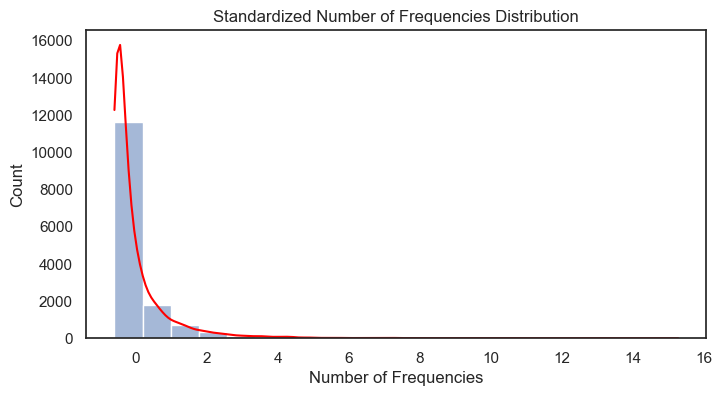

In [171]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized number_of_frequencies distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['number_of_frequencies'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Number of Frequencies')
plt.title('Standardized Number of Frequencies Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

In [172]:
# Identify potential outliers based on the standardized 'number_of_frequencies' feature
potential_outliers_frequencies = df_feature_engineer[df_feature_engineer['number_of_frequencies'] >= 8]

# Store the indices of these potential outliers in the outlier list
outlier_indices.extend(potential_outliers_frequencies.index.tolist())

# Print information about potential outliers
print("Detected outliers on number_of_frequencies:")
print(potential_outliers_frequencies.shape[0])
print('\n')

# Calculate and print the percentage of data loss
percentage_loss_frequencies = (potential_outliers_frequencies.shape[0] / df_feature_engineer.shape[0]) * 100
print("Percentage of data loss on number_of_frequencies:")
print(f"{percentage_loss_frequencies:.2f}%")
print('\n')

# Remove records with 'number_of_frequencies' above 8
df_feature_engineer = df_feature_engineer[df_feature_engineer['number_of_frequencies'] < 8]

# Display the updated shape of the DataFrame after removal
print("Shape of DataFrame after outlier removal on number_of_frequencies:")
print(df_feature_engineer.shape)

Detected outliers on number_of_frequencies:
25


Percentage of data loss on number_of_frequencies:
0.17%


Shape of DataFrame after outlier removal on number_of_frequencies:
(14800, 24)


#### *attended_classes*

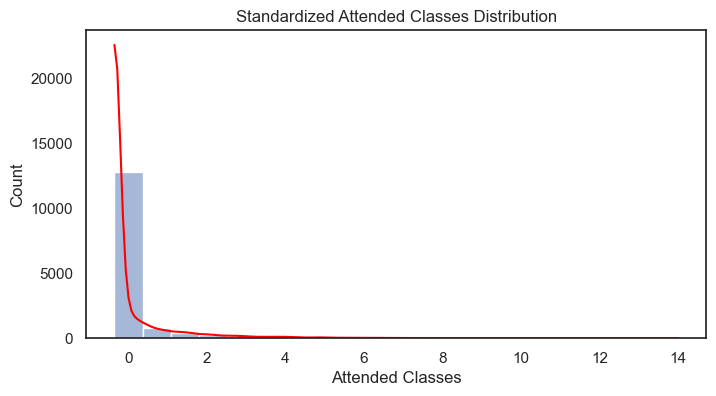

In [173]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized attended_classes distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['attended_classes'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Attended Classes')
plt.title('Standardized Attended Classes Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

In [174]:
# Identify potential outliers based on the standardized 'attended_classes' feature
potential_outliers_attended = df_feature_engineer[df_feature_engineer['attended_classes'] >= 7]

# Store the indices of these potential outliers in the outlier list
outlier_indices.extend(potential_outliers_attended.index.tolist())

# Print information about potential outliers
print("Detected outliers on attended_classes:")
print(potential_outliers_attended.shape[0])
print('\n')

# Calculate and print the percentage of data loss
percentage_loss_attended = (potential_outliers_attended.shape[0] / df_feature_engineer.shape[0]) * 100
print("Percentage of data loss on attended_classes:")
print(f"{percentage_loss_attended:.2f}%")
print('\n')

# Remove records with 'attended_classes' above 7
df_feature_engineer = df_feature_engineer[df_feature_engineer['attended_classes'] < 7]

# Display the updated shape of the DataFrame after removal
print("Shape of DataFrame after outlier removal on attended_classes:")
print(df_feature_engineer.shape)

Detected outliers on attended_classes:
35


Percentage of data loss on attended_classes:
0.24%


Shape of DataFrame after outlier removal on attended_classes:
(14765, 24)


#### *allowed_weekly_visits_by_sla*

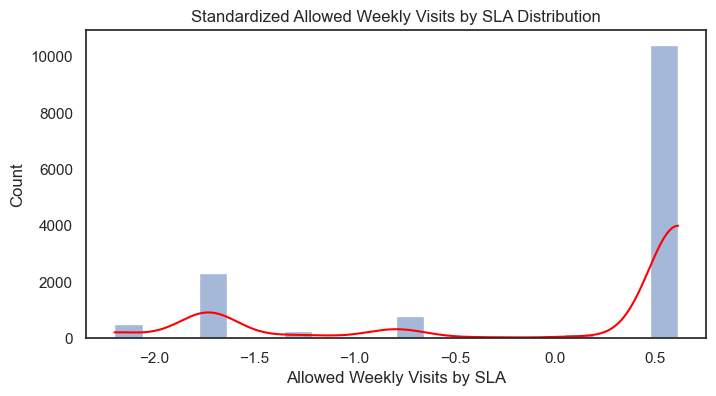

In [175]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized allowed_weekly_of_visits_by_sla distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['allowed_weekly_visits_by_sla'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Allowed Weekly Visits by SLA')
plt.title('Standardized Allowed Weekly Visits by SLA Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

No outliers worth removing were detected on 'allowed_weekly_visits_by_sla'.

#### *allowed_number_visits_by_sla*

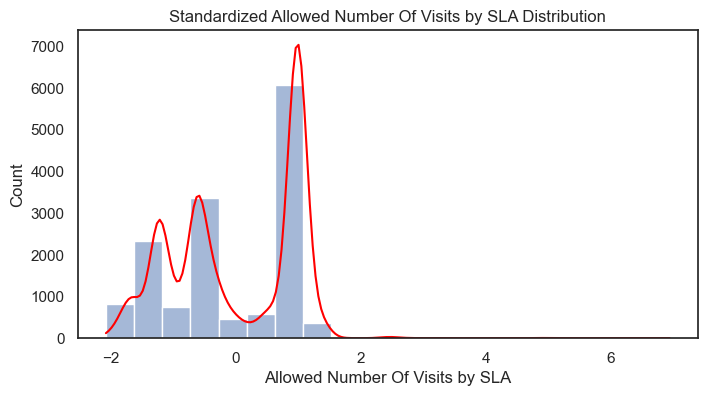

In [176]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized allowed_number_of_visits_by_sla distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['allowed_number_of_visits_by_sla'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Allowed Number Of Visits by SLA')
plt.title('Standardized Allowed Number Of Visits by SLA Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

In [177]:
# Identify potential outliers based on the standardized 'allowed_number_of_visits_by_sla' feature
potential_outliers_visits = df_feature_engineer[df_feature_engineer['allowed_number_of_visits_by_sla'] >= 3]

# Store the indices of these potential outliers in the outlier list
outlier_indices.extend(potential_outliers_visits.index.tolist())

# Print information about potential outliers
print("Detected outliers on allowed_number_of_visits_by_sla:")
print(potential_outliers_visits.shape[0])
print('\n')

# Calculate and print the percentage of data loss
percentage_loss_visits = (potential_outliers_visits.shape[0] / df_feature_engineer.shape[0]) * 100
print("Percentage of data loss on allowed_number_of_visits_by_sla:")
print(f"{percentage_loss_visits:.2f}%")
print('\n')

# Remove records with 'allowed_number_of_visits_by_sla' above 3
df_feature_engineer = df_feature_engineer[df_feature_engineer['allowed_number_of_visits_by_sla'] < 3]

# Display the updated shape of the DataFrame after removal
print("Shape of DataFrame after outlier removal on allowed_number_of_visits_by_sla:")
print(df_feature_engineer.shape)

Detected outliers on allowed_number_of_visits_by_sla:
11


Percentage of data loss on allowed_number_of_visits_by_sla:
0.07%


Shape of DataFrame after outlier removal on allowed_number_of_visits_by_sla:
(14754, 24)


#### *real_number_of_visits*

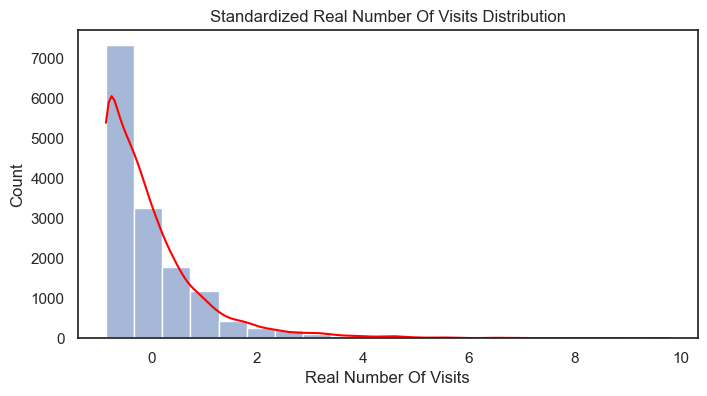

In [178]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized real_number_of_visits distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['real_number_of_visits'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Real Number Of Visits')
plt.title('Standardized Real Number Of Visits Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

In [179]:
# Identify potential outliers based on the standardized 'real_number_of_visits' feature
potential_outliers_visits_real = df_feature_engineer[df_feature_engineer['real_number_of_visits'] >= 6]

# Store the indices of these potential outliers in the outlier list
outlier_indices.extend(potential_outliers_visits_real.index.tolist())

# Print information about potential outliers
print("Detected outliers on real_number_of_visits:")
print(potential_outliers_visits_real.shape[0])
print('\n')

# Calculate and print the percentage of data loss
percentage_loss_visits_real = (potential_outliers_visits_real.shape[0] / df_feature_engineer.shape[0]) * 100
print("Percentage of data loss on real_number_of_visits:")
print(f"{percentage_loss_visits_real:.2f}%")
print('\n')

# Remove records with 'real_number_of_visits' above 6
df_feature_engineer = df_feature_engineer[df_feature_engineer['real_number_of_visits'] < 6]

# Display the updated shape of the DataFrame after removal
print("Shape of DataFrame after outlier removal on real_number_of_visits:")
print(df_feature_engineer.shape)

Detected outliers on real_number_of_visits:
24


Percentage of data loss on real_number_of_visits:
0.16%


Shape of DataFrame after outlier removal on real_number_of_visits:
(14730, 24)


#### *number_of_renewals*

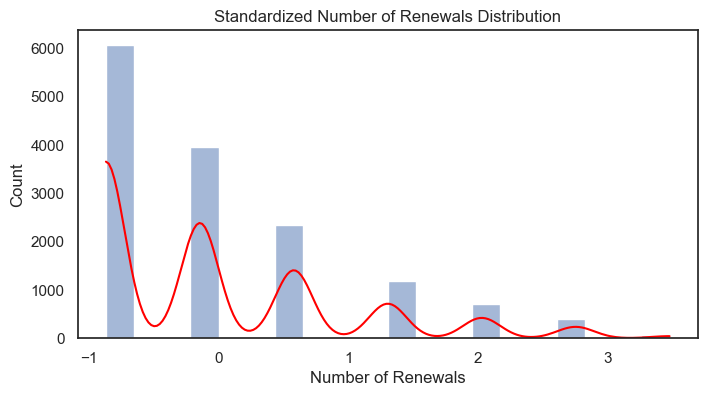

In [180]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized number_of_renewals distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['number_of_renewals'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Number of Renewals')
plt.title('Standardized Number of Renewals Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

No outliers worth removing were detected on 'number_of_renewals'.

#### *number_of_references*

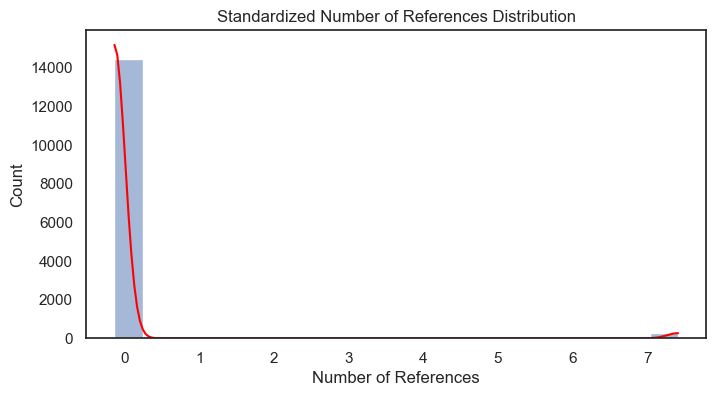

In [181]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized number_of_references distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['number_of_references'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
if ax.lines:
    ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Number of References')
plt.title('Standardized Number of References Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

In [182]:
# Confirming the value distribution of 'number_of_references'
df_feature_engineer['number_of_references'].value_counts()

number_of_references
-0.134905    14478
 7.412649      252
Name: count, dtype: int64

No outliers worth removing were detected on 'number_of_references'.

#### *enrollment_duration*

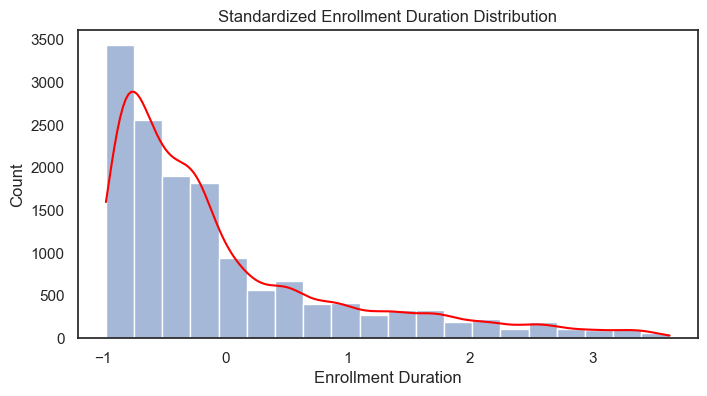

In [183]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized enrollment_duration distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['enrollment_duration'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
if ax.lines:
    ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Enrollment Duration')
plt.title('Standardized Enrollment Duration Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

No outliers worth removing were detected on 'enrollment_duration'.

#### *last_period_duration*

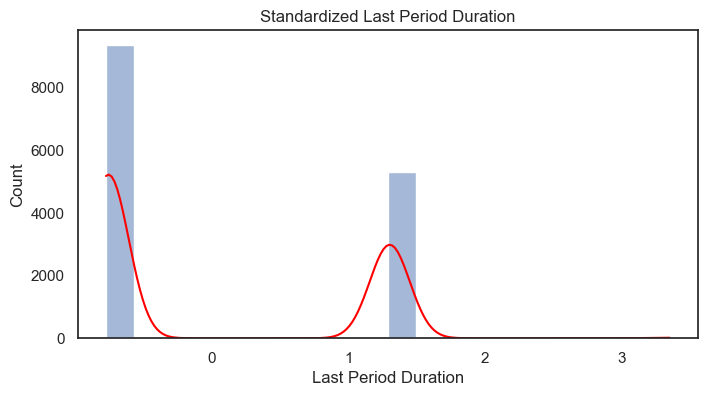

In [184]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized last_period_duration distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['last_period_duration'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
if ax.lines:
    ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Last Period Duration')
plt.title('Standardized Last Period Duration')  # Setting the title of the plot

# Displaying the plot
plt.show()

No outliers worth removing were detected on 'last_period_duration'.

#### *date_last_visit*

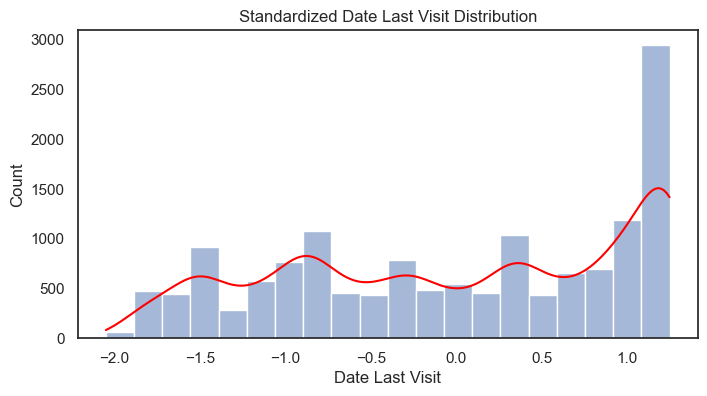

In [185]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized date_last_visit distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['date_last_visit'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
if ax.lines:
    ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Date Last Visit')
plt.title('Standardized Date Last Visit Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

No outliers worth removing were detected on 'date_last_visit'.

#### *weekly_average_frequency*

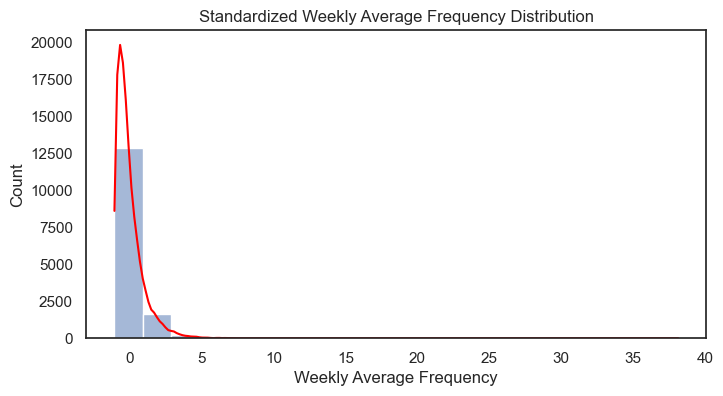

In [186]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized weekly_average_frequency distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['weekly_average_frequency'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
if ax.lines:
    ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Weekly Average Frequency')
plt.title('Standardized Weekly Average Frequency Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

In [187]:
# Identify potential outliers based on the standardized 'weekly_average_frequency' feature
potential_outliers_weekly_freq = df_feature_engineer[df_feature_engineer['weekly_average_frequency'] >= 5]

# Store the indices of these potential outliers in the outlier list
outlier_indices.extend(potential_outliers_weekly_freq.index.tolist())

# Print information about potential outliers
print("Detected outliers on weekly_average_frequency:")
print(potential_outliers_weekly_freq.shape[0])
print('\n')

# Calculate and print the percentage of data loss
percentage_loss_weekly_freq = (potential_outliers_weekly_freq.shape[0] / df_feature_engineer.shape[0]) * 100
print("Percentage of data loss on weekly_average_frequency:")
print(f"{percentage_loss_weekly_freq:.2f}%")
print('\n')

# Remove records with 'weekly_average_frequency' above 5
df_feature_engineer = df_feature_engineer[df_feature_engineer['weekly_average_frequency'] < 5]

# Display the updated shape of the DataFrame after removal
print("Shape of DataFrame after outlier removal on weekly_average_frequency:")
print(df_feature_engineer.shape)

Detected outliers on weekly_average_frequency:
28


Percentage of data loss on weekly_average_frequency:
0.19%


Shape of DataFrame after outlier removal on weekly_average_frequency:
(14702, 24)


#### *number_of_activities*

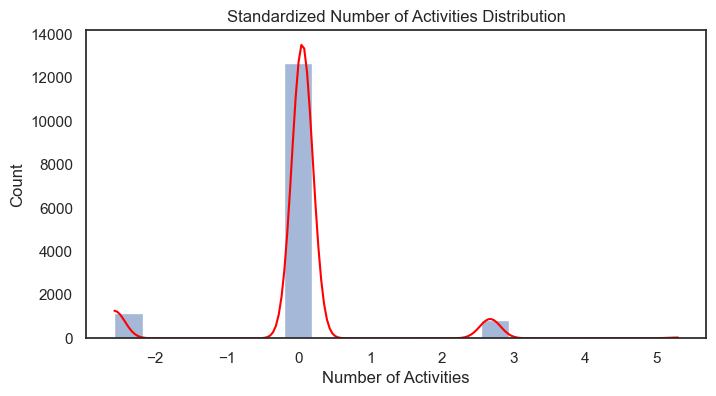

In [188]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized number_of_activities distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['number_of_activities'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
if ax.lines:
    ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Number of Activities')
plt.title('Standardized Number of Activities Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

In [189]:
# Identify potential outliers based on the standardized 'number_of_activities' feature
potential_outliers_activities = df_feature_engineer[df_feature_engineer['number_of_activities'] >= 5]

# Store the indices of these potential outliers in the outlier list
outlier_indices.extend(potential_outliers_activities.index.tolist())

# Print information about potential outliers
print("Detected outliers on number_of_activities:")
print(potential_outliers_activities.shape[0])
print('\n')

# Calculate and print the percentage of data loss
percentage_loss_activities = (potential_outliers_activities.shape[0] / df_feature_engineer.shape[0]) * 100
print("Percentage of data loss on number_of_activities:")
print(f"{percentage_loss_activities:.2f}%")
print('\n')

# Remove records with 'number_of_activities' above 5
df_feature_engineer = df_feature_engineer[df_feature_engineer['number_of_activities'] < 5]

# Display the updated shape of the DataFrame after removal
print("Shape of DataFrame after outlier removal on number_of_activities:")
print(df_feature_engineer.shape)

Detected outliers on number_of_activities:
31


Percentage of data loss on number_of_activities:
0.21%


Shape of DataFrame after outlier removal on number_of_activities:
(14671, 24)


#### *attended_classes_weekly_average*

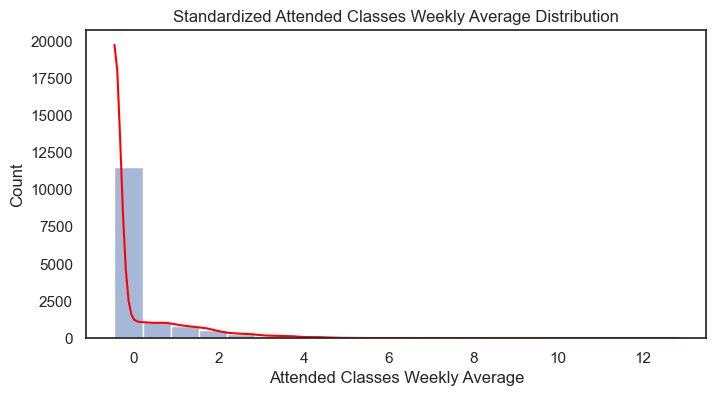

In [190]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized attended_classes_weekly_average distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['attended_classes_weekly_average'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
if ax.lines:
    ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Attended Classes Weekly Average')
plt.title('Standardized Attended Classes Weekly Average Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

In [191]:
# Identify potential outliers based on the standardized 'attended_classes_weekly_average' feature
potential_outliers_classes_avg = df_feature_engineer[df_feature_engineer['attended_classes_weekly_average'] >= 5]

# Store the indices of these potential outliers in the outlier list
outlier_indices.extend(potential_outliers_classes_avg.index.tolist())

# Print information about potential outliers
print("Detected outliers on attended_classes_weekly_average:")
print(potential_outliers_classes_avg.shape[0])
print('\n')

# Calculate and print the percentage of data loss
percentage_loss_classes_avg = (potential_outliers_classes_avg.shape[0] / df_feature_engineer.shape[0]) * 100
print("Percentage of data loss on attended_classes_weekly_average:")
print(f"{percentage_loss_classes_avg:.2f}%")
print('\n')

# Remove records with 'attended_classes_weekly_average' above 5
df_feature_engineer = df_feature_engineer[df_feature_engineer['attended_classes_weekly_average'] < 5]

# Display the updated shape of the DataFrame after removal
print("Shape of DataFrame after outlier removal on attended_classes_weekly_average:")
print(df_feature_engineer.shape)

Detected outliers on attended_classes_weekly_average:
43


Percentage of data loss on attended_classes_weekly_average:
0.29%


Shape of DataFrame after outlier removal on attended_classes_weekly_average:
(14628, 24)


#### *visits_ratio*

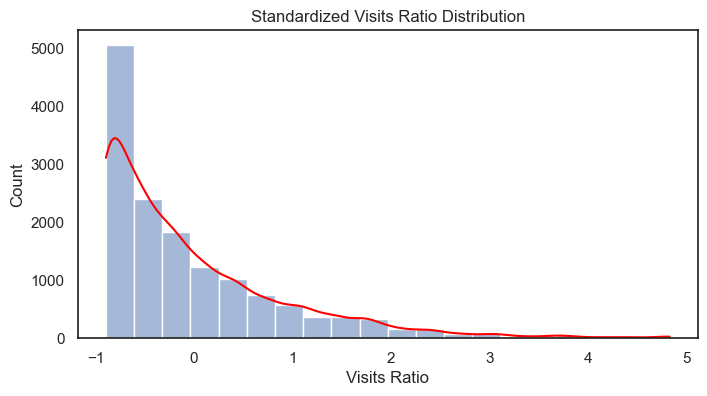

In [192]:
# Creating a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 4))

# Plotting the standardized visits_ratio distribution using a histogram with 20 bins and a kernel density estimate (kde)
ax = sns.histplot(df_feature_engineer['visits_ratio'], bins=20, kde=True)

# Highlighting the kernel density estimate line in red for better visibility
if ax.lines:
    ax.lines[0].set_color('red')

# Adding labels to the x-axis and y-axis
plt.xlabel('Visits Ratio')
plt.title('Standardized Visits Ratio Distribution')  # Setting the title of the plot

# Displaying the plot
plt.show()

In [193]:
# Identify potential outliers based on the standardized 'visits_ratio' feature
potential_outliers_visits_ratio = df_feature_engineer[df_feature_engineer['visits_ratio'] >= 4.5]

# Store the indices of these potential outliers in the outlier list
outlier_indices.extend(potential_outliers_visits_ratio.index.tolist())

# Print information about potential outliers
print("Detected outliers on visits_ratio:")
print(potential_outliers_visits_ratio.shape[0])
print('\n')

# Calculate and print the percentage of data loss
percentage_loss_visits_ratio = (potential_outliers_visits_ratio.shape[0] / df_feature_engineer.shape[0]) * 100
print("Percentage of data loss on visits_ratio:")
print(f"{percentage_loss_visits_ratio:.2f}%")
print('\n')

# Remove records with 'visits_ratio' above 4.5
df_feature_engineer = df_feature_engineer[df_feature_engineer['visits_ratio'] < 4.5]

# Display the updated shape of the DataFrame after removal
print("Shape of DataFrame after outlier removal on visits_ratio:")
print(df_feature_engineer.shape)

Detected outliers on visits_ratio:
38


Percentage of data loss on visits_ratio:
0.26%


Shape of DataFrame after outlier removal on visits_ratio:
(14590, 24)


In [194]:
print(f'The cumulative percentage of original data removed after the Metric Features 2nd Outlier Removal stage is {(round(1 - df_feature_engineer.shape[0]/df.shape[0],3))*100}%')

The cumulative percentage of original data removed after the Metric Features 2nd Outlier Removal stage is 2.4%


In [195]:
# Initialize the StandardScaler
scaler = StandardScaler()

# After the removal, re-standardize the metric features in the dataset 'df_feature_engineer' to make each metric feature have mean 0 and 
# standard deviation 1, again
df_feature_engineer[metric_features] = scaler.fit_transform(df_feature_engineer[metric_features])

# Confirm the success of the re-standardization procedure
df_feature_engineer[metric_features].head(3)

,age,income,days_without_frequency,lifetime_value,number_of_frequencies,attended_classes,allowed_weekly_visits_by_sla,allowed_number_of_visits_by_sla,real_number_of_visits,number_of_renewals,number_of_references,enrollment_duration,last_period_duration,date_last_visit,weekly_average_frequency,number_of_activities,attended_classes_weekly_average,visits_ratio
0,2.454929,2.164377,-0.581005,-0.601884,-0.517657,-0.085861,-1.083450,-1.803460,-0.544646,-0.872269,-0.132037,-0.866386,-0.738568,1.258662,0.643046,0.064248,3.093106,1.048424
1,0.227214,0.279569,-0.149588,0.556096,-0.263879,-0.330133,-1.741996,-1.231128,-0.721060,0.605141,-0.132037,-0.074284,1.301729,-1.404217,-0.475381,-2.644957,-0.402384,-0.568182
2,-0.203956,-0.147303,-0.537132,-0.755598,-0.572038,-0.370845,0.609952,-0.583271,0.161009,-0.872269,-0.132037,-0.931618,-0.772385,-0.250360,1.157881,0.064248,-0.476701,0.313574


<a name="removal-with-db-scan"></a>
### Outlier Removal with DBSCAN

  File "C:\Users\sebas\anaconda3\envs\main_env\lib\site-packages\joblib\externals\loky\backend\context.py", line 217, in _count_physical_cores
    raise ValueError(


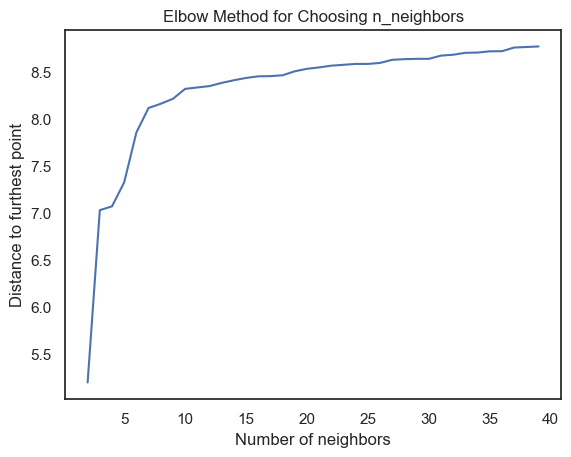

In [196]:
# Define a range of values for the number of nearest neighbors to consider
neighbors_range = range(2, 40)  

# Initialize an empty list to store the distance to the furthest neighbor for each number of neighbors
elbow_values = []

# Iterate over each number of neighbors in the specified range
for n_neighbors in neighbors_range:
    # Create a NearestNeighbors model with the current number of neighbors
    neigh = NearestNeighbors(n_neighbors=n_neighbors)

    # Fit the NearestNeighbors model to the metric features of the DataFrame
    neigh.fit(df_feature_engineer[metric_features])

    # Find the n_neighbors nearest neighbors for each point in the dataset
    # distances: array containing distances to the nearest neighbors for each point
    # _: (ignored variable) indices of the nearest neighbors for each point
    distances, _ = neigh.kneighbors(df_feature_engineer[metric_features])

    # For each point, find the distance to its furthest (nth) neighbor and sort these distances
    # Append the largest of these distances (i.e., the distance to the furthest neighbor of the point with the largest such distance) to 
    # elbow_values
    elbow_values.append(np.sort(distances[:, -1])[-1])

# Plotting the results
# Create a line plot with the number of neighbors on the x-axis and the distance to the furthest neighbor on the y-axis
plt.plot(neighbors_range, elbow_values)

# Label the x-axis as 'Number of neighbors'
plt.xlabel('Number of neighbors')

# Label the y-axis as 'Distance to furthest point'
plt.ylabel('Distance to furthest point')

# Title the plot as 'Elbow Method for Choosing n_neighbors'
plt.title('Elbow Method for Choosing n_neighbors')

# Display the plot
plt.show()

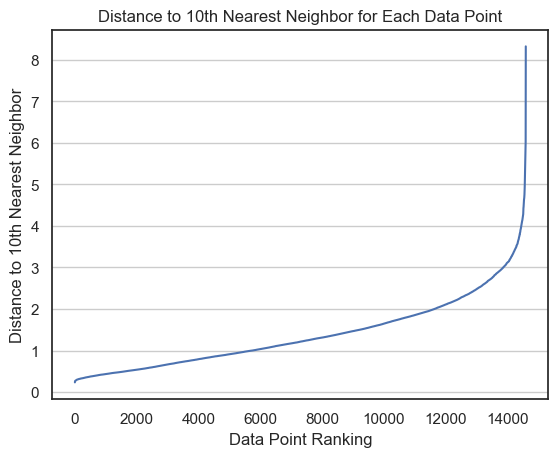

In [197]:
# Initialize a NearestNeighbors model with n_neighbors set to 10
# This model will be used to find the 10 nearest neighbors for each point in the dataset
neigh = NearestNeighbors(n_neighbors=10)

# Fit the NearestNeighbors model on the specified features of the dataset
# df_feature_engineer[metric_features] contains the metric features to be considered
neigh.fit(df_feature_engineer[metric_features])

# Find the 10 nearest neighbors for each point in the dataset
# Returns two arrays: distances and indices of these neighbors
# Here, only the distances are used, so indices are discarded (indicated by '_')
distances, _ = neigh.kneighbors(df_feature_engineer[metric_features])

# Sort the distances for each point and select the distance to the 10th nearest neighbor
# This gives the distance to the furthest (10th) neighbor for each point
distances = np.sort(distances[:, -1])

# Plotting the distances to the 10th nearest neighbor for each point
plt.plot(distances)

# Adding grid lines along the y-axis for better readability of the plot
plt.grid(axis='y')

# Adding a title to the plot
plt.title('Distance to 10th Nearest Neighbor for Each Data Point')

# Labeling the x-axis as 'Data Point Ranking'
plt.xlabel('Data Point Ranking')

# Labeling the y-axis as 'Distance to 20th Nearest Neighbor'
plt.ylabel('Distance to 10th Nearest Neighbor')

# Display the plot
plt.show()

The "elbow" or knee of the plot is where there is a noticeable change in the rate at which the distance increases. This typically indicates the density drop-off point between points that should be considered part of clusters (below the elbow) and outliers (above the elbow).

The steep rise towards the end of the plot indicates that these points are significantly more isolated from the cluster cores, marking them as potential outliers.

The eps value for DBSCAN should ideally be chosen just before this rise, where the graph starts to "bend" upwards sharply. This way, the eps encompasses all the points in the dense area (potential cluster members) while excluding the more distant, sparse points (potential outliers).

In the above graph the ideal eps value appears to be around the distance value of approximately 3.5.

In [198]:
# Initialize a DBSCAN object with an epsilon of 3.5 and a minimum sample size of 35.
# eps=4: This means that two points are considered neighbors if the distance between them is less than or equal to 3.5 units.
# min_samples=35: This is the minimum number of points required to form a dense region, which is considered a cluster 
# (based on 2 * dimensionality).
# The min_samples includes the point itself, so min_samples-1 are the neighboring points.
dbscan = DBSCAN(eps=3.5, min_samples=35)

# Fit the DBSCAN algorithm to the metric features and predict the cluster labels for each point.
# Points that do not belong to any cluster are labeled as -1 and considered outliers.
dbscan_labels = dbscan.fit_predict(df_feature_engineer[metric_features])

# Store the indices of outliers identified by DBSCAN in the outlier list
outlier_indices_dbscan = df_feature_engineer[dbscan_labels == -1].index
outlier_indices.extend(outlier_indices_dbscan.tolist())

# Filter the DataFrame to include only the data points that were labeled as outliers by DBSCAN.
# These points are considered as noise and will be subject to a further reclassification for the final clustering solution.
dbscan_outliers = df_feature_engineer[dbscan_labels == -1]

# Update the original DataFrame by removing the outliers.
# This results in a DataFrame containing only the points that were classified as part of a cluster.
df_feature_engineer = df_feature_engineer[dbscan_labels != -1]

In [199]:
print(f'DBSCAN removed: {len(dbscan_outliers)} outliers')
print(f'The cumulative percentage of original data removed after the second Metric Features outlier handling is {(round(1 - df_feature_engineer.shape[0]/df.shape[0],3))*100}%')

DBSCAN removed: 220 outliers
The cumulative percentage of original data removed after the second Metric Features outlier handling is 3.8%


**Metric Features 2nd Outlier Removal Approach Explanation**

In the "Metric Features 2nd Outlier Removal Approach" a systematic process was employed to identify and eliminate potential outliers in the metric features of the dataset. The approach focused on maintaining data integrity while improving the robustness of subsequent customer segmentation analyses. Firstly, a manual removal of the outliers was carried out feature by feature. The decisions were as follows:

| Feature                           | Standardized Threshold | Records Removed | % Data Loss |
|-----------------------------------|------------------------|-----------------|-------------|
| Age                               | >= 4                   | 14              | 0.09        |
| Income                            | >= 4                   | 17              | 0.11        |
| Days Without Frequency            | >= 10                  | 14              | 0.09        |
| Lifetime Value                    | >= 6                   | 12              | 0.08        |
| Number of Frequencies             | >= 8                   | 25              | 0.17        |
| Attended Classes                  | >= 7                   | 35              | 0.24        |
| Allowed Weekly Visits by SLA      | None                   | 0               | 0           |
| Allowed Number of Visits by SLA   | >= 3                   | 11              | 0.07        |
| Real Number of Visits             | >= 6                   | 24              | 0.16        |
| Number of Renewals                | None                   | 0               | 0           |
| Number of References              | None                   | 0               | 0           |
| Enrollment Duration               | None                   | 0               | 0           |
| Last Period Duration              | None                   | 0               | 0           |
| Date Last Visit                   | None                   | 0               | 0           |
| Weekly Average Frequency          | >= 5                   | 28              | 0.19        |
| Number of Activities              | >= 5                   | 31              | 0.21        |
| Attended Classes Weekly Average   | >= 5                   | 43              | 0.29        |
| Visits Ratio                      | >= 4.5                 | 38              | 0.26        |

Secondly, uppon the manual outlier removal, a DBSCAN-based outlier removal was carried out. Key parameters were carefully chosen based on the Elbow Plot. This plot is instrumental in selecting the number of neighbors to consider, which in this case, was determined to be 10. The choice of 10 neighbors aligns with the 'elbow' of the plot, the point where the curve starts to flatten out, indicating a reasonable threshold for the density of points necessary to form clusters.

The choice of the epsilon (eps) value is equally critical. For this dataset, an eps of 3.5 was selected because it is approximately the point where the distance to the 10th nearest neighbors begins to increase exponentially on the Elbow Plot. This steep increase is indicative of a transition from densely packed points, which are potential cluster members, to sparsely located points, which are potential outliers. By setting eps just before this sharp rise, the DBSCAN algorithm is fine-tuned to encompass all the points within the dense regions while excluding those that are more distant and isolated.

Thus, the eps value of 3.5 acts as a cut-off point that separates the core cluster members from outliers. This precise demarcation ensures that the DBSCAN algorithm effectively identifies the core points of clusters, leading to a more refined and accurate clustering outcome. This process resulted in the removal of 220 outliers, accounting for cumulative 3.8% reduction in the original dataset and enhancing its structure for subsequent analysis.
The choice of the epsilon (eps) value is equally critical. For this dataset, an eps of 3.5 was selected because it is approximately the point where the distance to the 10th nearest neighbors begins to increase exponentially on the Elbow Plot. This steep increase is indicative of a transition from densely packed points, which are potential cluster members, to sparsely located points, which are potential outliers. By setting eps just before this sharp rise, the DBSCAN algorithm is fine-tuned to encompass all the points within the dense regions while excluding those that are more distant and isolated.

Thus, the eps value of 3.5 acts as a cut-off point that separates the core cluster members from outliers. This precise demarcation ensures that the DBSCAN algorithm effectively identifies the core points of clusters, leading to a more refined and accurate clustering outcome. This process resulted in the removal of 220 data points, accounting for a cumulative 3.8% reduction in the original dataset and enhancing its structure for subsequent analysis.

<a name="binary-features-2nd-outlier
"></a>
### Binary Features

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

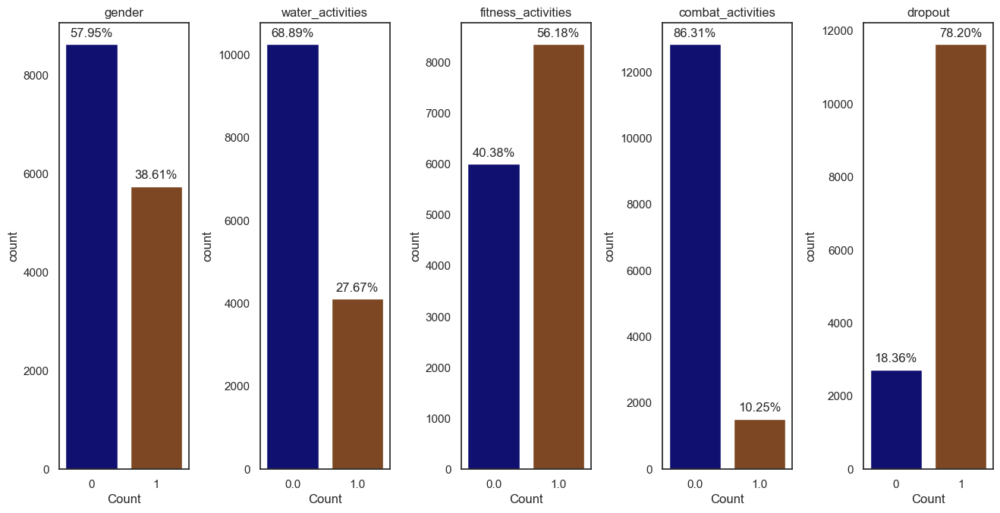

In [200]:
# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 13))

# Flatten the axes array to easily iterate through the subplots
axes = axes.flatten()

# Create horizontal countplots for each binary feature
for i, feature in enumerate(binary_features):
    ax = sns.countplot(data=df_feature_engineer, x=feature, ax=axes[i], palette=colors)  # Use x instead of y
    axes[i].set_title(f'{feature}')
    axes[i].set_xlabel('Count')  # Set label for the x-axis

    # Calculate percentage values
    total = len(no_outlier_no_missing_df)
    for p in ax.patches:
        # Calculate the percentage as (count of category / total) * 100
        percentage = 100 * p.get_height() / total
        
        # Annotate the percentage on top of each bar
        ax.annotate(f'{percentage:.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Hide the second row and sixth column subplot
for i in range(len(binary_features), num_rows * num_cols):
    fig.delaxes(axes[i])

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

**Binary Features 2nd Outlier Removal Approach Explanation**

After thorough analysis of count plots for each binary feature following the initial 1st Outlier Removal and subsequent 2nd Outlier Removal from metric features, it is evident that the distribution of binary classes is now well-balanced. Notably, the least represented class, observed in the 'combat_activities' feature with a 10.25% representation, demonstrates the effectiveness of the outlier removal steps undertaken. This balanced distribution across binary features signifies the success of the data preprocessing stages, contributing to a more robust and representative dataset for subsequent customer segmentation analysis.

### *Categorical Feature*

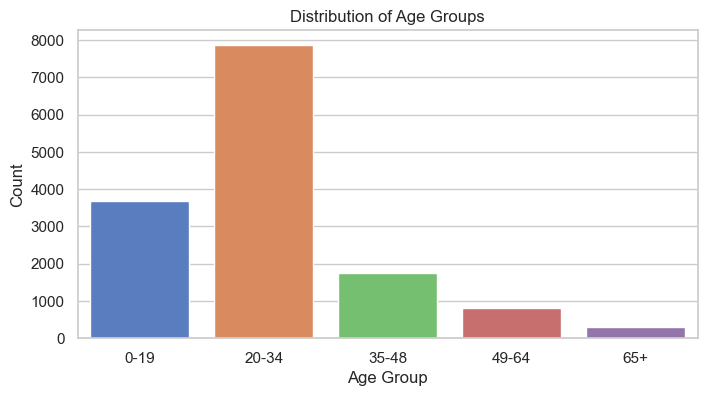

In [201]:
sns.set(style="whitegrid")

# Create a bar plot for the 'age_group' feature
plt.figure(figsize=(8, 4))
sns.countplot(x='age_group', data=df_feature_engineer, palette='muted')

# Set plot labels and title
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.title('Distribution of Age Groups')

# Show the plot
plt.show()

In [202]:
df_feature_engineer['age_group'].value_counts()

age_group
20-34    7870
0-19     3669
35-48    1738
49-64     800
65+       293
Name: count, dtype: int64

**Categorical Feature 2nd Outlier Removal Approach Explanation**

Recognizing the potential significance of age as a crucial factor in customer segmentation, a meticulous examination of the age group distribution was undertaken. The data reveals a diverse distribution across various age brackets:

* 20-34: 7870 individuals
* 0-19: 3669 individuals
* 35-48: 1738 individuals
* 49-64: 800 individuals
* 65+: 293 individuals

Given the distinctive numerical representation within each age group, it became evident that these segments harbor unique characteristics and behaviors. Acknowledging the intuitive understanding that diverse age brackets likely exhibit distinct customer behaviors, it was deemed prudent to retain all age groups in the analysis. By preserving the granularity of age-based segmentation, the analysis remains poised to capture the nuanced preferences and patterns that may vary significantly across different life stages. This approach ensures a comprehensive exploration of customer dynamics and sets the stage for targeted strategies tailored to the specific needs and behaviors associated with each age group.

In [203]:
print(f'The cumulative percentage of original data removed after the 2nd Outlier Removal stage is {(round(1 - df_feature_engineer.shape[0]/df.shape[0],3))*100}%')

The cumulative percentage of original data removed after the 2nd Outlier Removal stage is 3.8%


<a name="feature-selection"></a>
## 3.6. Feature Selection

In [204]:
# Creating a copy of the df_feature_engineer DataFrame for feature selection
df_feature_selection = df_feature_engineer.copy()

# The df_feature_selection DataFrame is now a duplicate of df_feature_engineer, allowing for separate manipulation
# This ensures that any feature selection techniques applied to df_feature_selection won't affect the original dataset

<a name="metric-features-feature-selection"></a>
### Metric Features

#### *Correlation Matrix*

locator: <matplotlib.ticker.AutoLocator object at 0x0000021426344130>


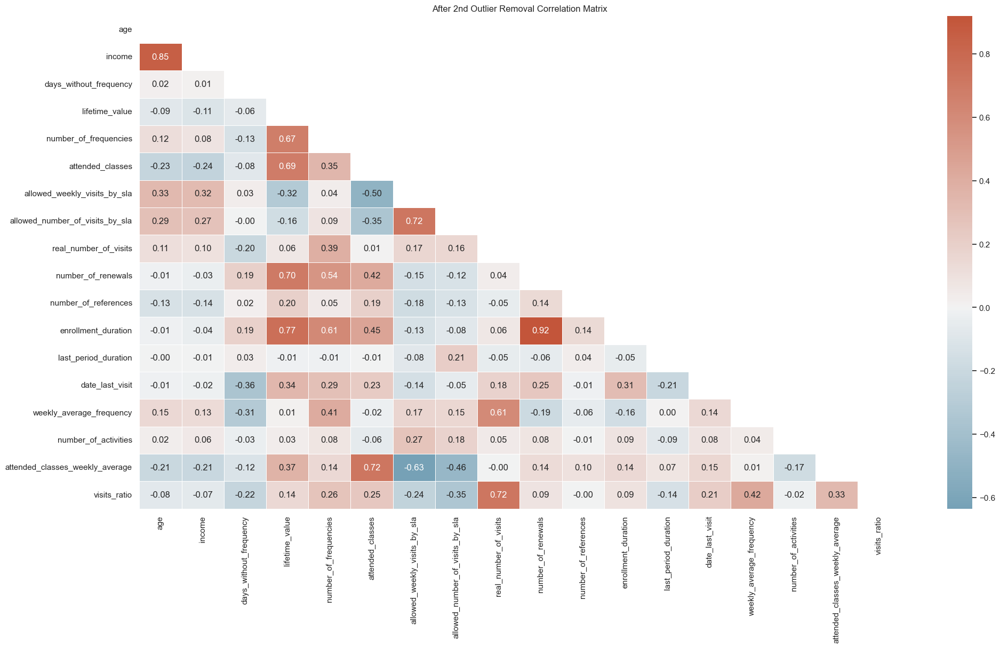

In [205]:
# Calculate the correlation matrix for the DataFrame 'df_feature_selection'
correlation_matrix = df_feature_selection[metric_features].corr()

# Create a mask for the upper triangle of the correlation matrix
upper_triangle = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the figure for the heatmap and define its size
plt.figure(figsize=(23, 12))

# Set the style for the heatmap
sns.set(style="white")

# Create a color palette for the heatmap using a diverging color scheme
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Create the heatmap using the correlation matrix, applying the mask, and annotating values
sns.heatmap(correlation_matrix, mask=upper_triangle, annot=True, cmap=cmap, center=0, linewidths=0.5, fmt=".2f")

# Set the title for the heatmap
plt.title("After 2nd Outlier Removal Correlation Matrix")

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)

# Show the correlation matrix heatmap
plt.show()

locator: <matplotlib.ticker.AutoLocator object at 0x00000214277C7190>


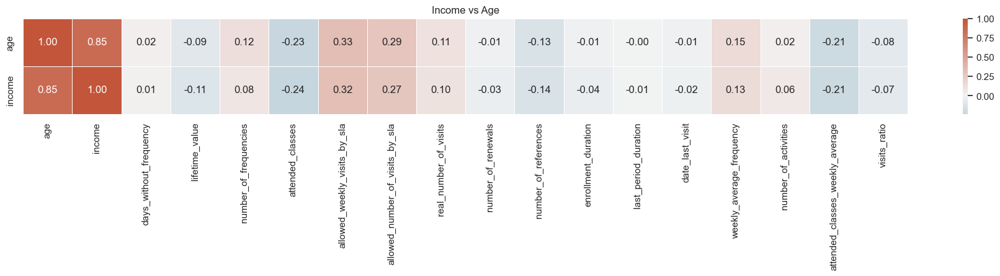

In [206]:
subset_correlation_matrix = correlation_matrix.loc[['age', 'income'], :]

# Set up the figure for the heatmap and define its size
plt.figure(figsize=(23, 2))

# Set the style for the heatmap
sns.set(style="white")

# Create a color palette for the heatmap using a diverging color scheme
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Create the heatmap using the correlation matrix, applying the mask, and annotating values
sns.heatmap(subset_correlation_matrix,  annot=True, cmap=cmap, center=0, linewidths=0.5, fmt=".2f")

# Set the title for the heatmap
plt.title("Income vs Age")

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)

# Show the correlation matrix heatmap
plt.show()

locator: <matplotlib.ticker.AutoLocator object at 0x00000214298BDC60>


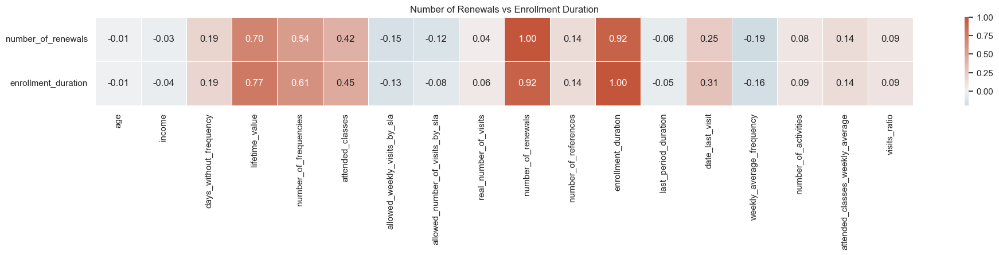

In [207]:
subset_correlation_matrix = correlation_matrix.loc[['number_of_renewals', 'enrollment_duration'], :]

# Set up the figure for the heatmap and define its size
plt.figure(figsize=(23, 2))

# Set the style for the heatmap
sns.set(style="white")

# Create a color palette for the heatmap using a diverging color scheme
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Create the heatmap using the correlation matrix, applying the mask, and annotating values
sns.heatmap(subset_correlation_matrix,  annot=True, cmap=cmap, center=0, linewidths=0.5, fmt=".2f")

# Set the title for the heatmap
plt.title("Number of Renewals vs Enrollment Duration")

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)

# Show the correlation matrix heatmap
plt.show()

locator: <matplotlib.ticker.AutoLocator object at 0x0000021428A79C90>


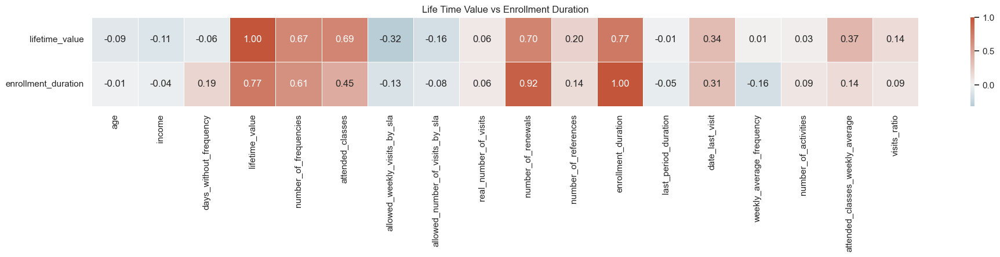

In [208]:
subset_correlation_matrix = correlation_matrix.loc[['lifetime_value', 'enrollment_duration'], :]

# Set up the figure for the heatmap and define its size
plt.figure(figsize=(23, 2))

# Set the style for the heatmap
sns.set(style="white")

# Create a color palette for the heatmap using a diverging color scheme
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Create the heatmap using the correlation matrix, applying the mask, and annotating values
sns.heatmap(subset_correlation_matrix,  annot=True, cmap=cmap, center=0, linewidths=0.5, fmt=".2f")

# Set the title for the heatmap
plt.title("Life Time Value vs Enrollment Duration")

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)

# Show the correlation matrix heatmap
plt.show()

**Feature Selection on Metric Features using Correlation Matrix Approach Explanation**

By scrutinizing the correlation matrix, a compelling case emerges for potential feature selection within the metric features. Notably, the features 'age' and 'income' exhibit a notable redundancy, prompting consideration for the removal of one to streamline the clustering solution. The decision-making process involves two key factors: the extent of correlation with other features and the presence of missing values in the original features. 'age' and 'income' displays a very similar degree of correlation scores with other variables, with 'income' having an absolute correlation magnitude difference of +3 compared to 'income'. However, 'age' stands out as it harbors no missing values, unlike 'income,' which originally presented a 3.30% missing data proportion. Consequently, it was determined that the more suitable candidate for removal was 'income'.

In addition to this, strong correlations were identified between certain features, more specifically 'number_of_renewals' and 'enrollment_duration', as well as 'lifetime_value' and 'enrollment_duration'. These correlations are intuitive given the XYZ Sports Company business area: 'number_of_renewals' and 'enrollment_duration' are closely related as longer enrollment durations often lead to more opportunities for renewals. Similarly, 'lifetime_value' tends to increase with longer 'enrollment_duration', as prolonged engagement typically results in higher cumulative spending. Given the logical and expected nature of these relationships, it was decided to leverage an additional feature selection criterion - Self Organizing Maps (SOM). SOMs offer a nuanced approach to feature selection, providing insights into feature importance and interrelationships beyond linear correlations. This methodological inclusion aims to create a more refined and insightful feature set, enhancing the quality and interpretability of the clustering solution.

#### *Self Organizing Maps*

In [209]:
# Set the random seed to ensure reproducibility
np.random.seed(42)

# Initialize a Self-Organizing Map (SOM) using the SOMFactory provided by the sompy library
# The SOM is built using the metric features of the DataFrame 'df_feature_selection'
# The mapsize parameter determines the size of the SOM grid, here set to 10x10
# 'random' initialization initializes the weights randomly
# 'gaussian' neighborhood function specifies the type of neighborhood to use during training
# 'batch' training mode indicates that the entire dataset is used for each iteration during training
# 'hexa' lattice defines the shape of the grid as hexagonal
# The component_names parameter assigns names to the components of the metric features
sm = sompy.SOMFactory().build(
    df_feature_selection[metric_features].values, 
    mapsize=[10, 10],  
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=metric_features
)

# Train the SOM with specified parameters
# n_job sets the number of parallel jobs to use during training (here, 4 parallel jobs)
# verbose='info' displays detailed information during the training process
# train_rough_len and train_finetune_len control the lengths of the rough and fine-tune training phases, respectively
sm.train(n_job=4, verbose='info', train_rough_len=200, train_finetune_len=200)

 Training...
 random_initialization took: 0.002000 seconds
 Rough training...
 radius_ini: 4.000000 , radius_final: 1.000000, trainlen: 200

 epoch: 1 ---> elapsed time:  0.091000, quantization error: 9.617191

 epoch: 2 ---> elapsed time:  0.118000, quantization error: 3.842084

 epoch: 3 ---> elapsed time:  0.084000, quantization error: 3.765329

 epoch: 4 ---> elapsed time:  0.082000, quantization error: 3.718274

 epoch: 5 ---> elapsed time:  0.084000, quantization error: 3.699002

 epoch: 6 ---> elapsed time:  0.086000, quantization error: 3.690016

 epoch: 7 ---> elapsed time:  0.084000, quantization error: 3.683759

 epoch: 8 ---> elapsed time:  0.081000, quantization error: 3.679120

 epoch: 9 ---> elapsed time:  0.083000, quantization error: 3.675184

 epoch: 10 ---> elapsed time:  0.111000, quantization error: 3.673003

 epoch: 11 ---> elapsed time:  0.087000, quantization error: 3.671200

 epoch: 12 ---> elapsed time:  0.086000, quantization error: 3.669486

 epoch: 13 ---> 

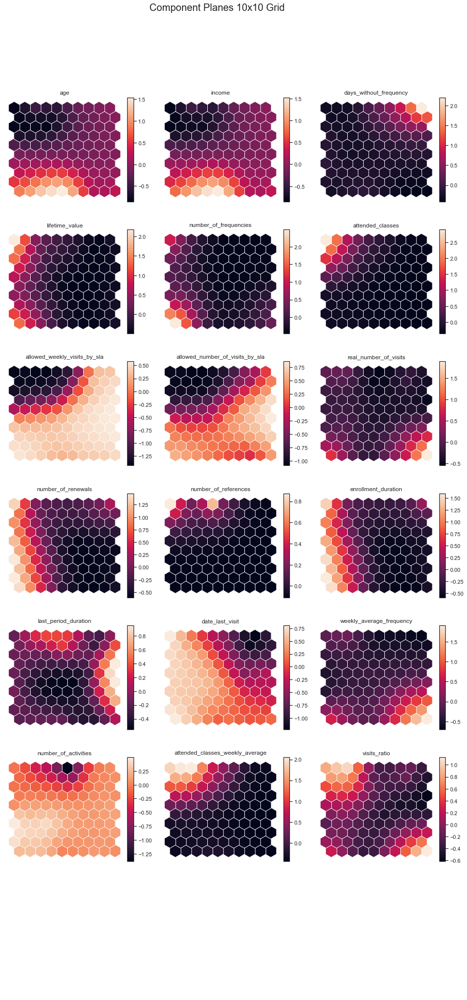

In [210]:
# Set the DPI (dots per inch) for the figure
plt.rcParams['figure.dpi'] = 72

# Create a 2D view of the SOM's component planes (feature values)
view2D = View2D(12, 12, "", text_size=10)

# Display the component planes using the SOMPY library
view2D.show(sm, col_sz=3, what='codebook')

# Adjust subplot layout and set title
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes 10x10 Grid", fontsize=20)

# Show the plot
plt.show()

**Feature Selection on Metric Features using Self Organizing Maps Approach Explanation**

Upon scrutinizing the Component Planes derived from the Self-Organizing Maps, a conclusive determination regarding feature retention was reached. Notably, a close examination revealed that 'age' and 'income' exhibited nearly identical Component Plane disposition. Consequently, adhering to the criteria established from the earlier Correlation Matrix analysis, the decision was made to retain 'age' as the more pertinent feature.

In refining the feature set for clustering, several features were evaluated for their distribution across the Self-Organizing Map (SOM) units. 'days_without_frequency' and 'number_of_frequencies' exhibited minimal variation across the SOM units, suggesting a univariate distribution that would not contribute meaningfully to differentiating clusters. Consequently, these features were omitted from the final clustering solution.

Similarly, 'attended_classes' was excluded in favor of 'attended_classes_weekly_average', which provides analogous insights but on a more granular, weekly basis, enhancing the engagement measures within the clusters. 'allowed_number_of_visits_by_sla' was also dropped due to its redundancy with 'allowed_weekly_visits_by_sla', with the latter preferred for its weekly engagement analysis relevance.

'real_number_of_visits' and 'number_of_references' were removed due to their univariate distributions along the SOM units, which did not exhibit distinct hotspots or clear divisions.

Despite its limited variability, 'number_of_activities' was retained. It presents a discernible hotspot across the SOM units, albeit covering few units, indicating its potential utility in the clustering solution by tracking the diversity of customer activity participation. 'visits_ratio' was similarly kept; although challenging to identify a hotspot on the SOM, its ability to measure the ratio of actual to allowed visits in the last registration period provides valuable insights for customer engagement patterns.

These decisions were made with a strategic view of retaining features that offer the most significant insights and differentiation potential for the customer segmentation cluster model.

In [211]:
# Drop specified columns from the DataFrame 'df_feature_selection'
# The 'income,' 'days_without_frequency,' 'number_of_frequencies', 'attended_classes,' 
# and 'allowed_number_of_visits_by_sla', 'real_number_of_visits' and 'number_of_references' columns are removed from the DataFrame
# The 'inplace=True' parameter ensures that the changes are applied directly to the original DataFrame
df_feature_selection.drop(columns=['income', 'days_without_frequency', 'number_of_frequencies', 'attended_classes', 
                                   'allowed_number_of_visits_by_sla', 'real_number_of_visits', 'number_of_references'], inplace=True)

<a name="binary-features-feature-selection"></a>
### Binary Features

In [212]:
# A reminder of the current dataset's structure
df_feature_selection.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14370 entries, 0 to 14941
Data columns (total 17 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   age                              14370 non-null  float64 
 1   gender                           14370 non-null  int64   
 2   date_last_visit                  14370 non-null  float64 
 3   lifetime_value                   14370 non-null  float64 
 4   water_activities                 14370 non-null  float64 
 5   fitness_activities               14370 non-null  float64 
 6   combat_activities                14370 non-null  float64 
 7   allowed_weekly_visits_by_sla     14370 non-null  float64 
 8   number_of_renewals               14370 non-null  float64 
 9   dropout                          14370 non-null  int64   
 10  enrollment_duration              14370 non-null  float64 
 11  last_period_duration             14370 non-null  float64 
 12  age_group

In [213]:
# A reminder of the list of metric features still present
metric_features = ['age', 'date_last_visit', 'lifetime_value',
                   'allowed_weekly_visits_by_sla', 'number_of_renewals', 
                  'enrollment_duration', 'last_period_duration', 'weekly_average_frequency', 'number_of_activities',
                   'attended_classes_weekly_average', 'visits_ratio']

# A reminder of the list of binary features still present
binary_features = ['gender', 'water_activities', 'fitness_activities', 'combat_activities', 'dropout']

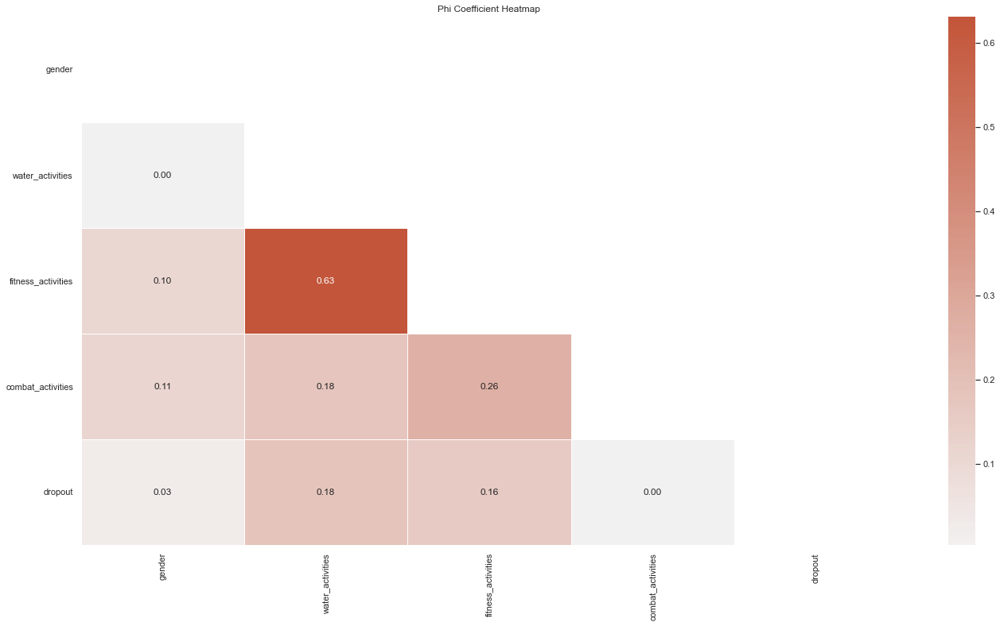

In [214]:
# Function to calculate the Phi coefficient
def phi_coefficient(x, y):
    contingency_table = pd.crosstab(x, y)
    chi2, _, _, _ = chi2_contingency(contingency_table)
    n = sum(contingency_table.sum())
    return np.sqrt(chi2 / n)

# Initialize an empty DataFrame for the Phi coefficients
phi_df = pd.DataFrame(index=binary_features, columns=binary_features)

# Calculate the Phi coefficient for each pair of features
for feature1 in binary_features:
    for feature2 in binary_features:
        phi_df.loc[feature1, feature2] = phi_coefficient(df_feature_selection[feature1], df_feature_selection[feature2])

# Convert the values to float for proper visualization
phi_df = phi_df.astype(float)

upper_triangle = np.triu(np.ones_like(phi_df, dtype=bool))

# Set up the figure for the heatmap and define its size
plt.figure(figsize=(23, 12))

# Set the style for the heatmap
sns.set(style="white")

# Create a color palette for the heatmap using a diverging color scheme
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Create the heatmap using the correlation matrix, applying the mask, and annotating values
sns.heatmap(phi_df, mask=upper_triangle, annot=True, cmap=cmap, center=0, linewidths=0.5, fmt=".2f")

# Set the title for the heatmap
plt.title("Phi Coefficient Heatmap")

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)
plt.yticks(rotation=0)

# Show the correlation matrix heatmap
plt.show()

**Feature Selection on Binary Features Phi Coefficient Heatmap Explanation**

The Phi Coefficient is a statistical measure used to assess the association between two binary variables. It is computed based on a contingency table formed by the frequencies of the different combinations of the two variables. The formula involves calculating the chi-square statistic for independence, and the Phi Coefficient is the square root of the chi-square divided by the total number of observations. This coefficient ranges from -1 to 1, where 0 indicates no association, -1 indicates a perfect negative association and 1 indicates a perfect positive association.

In the context of Feature Selection for binary features, Phi Coefficients are useful for quantifying the strength and direction of relationships between pairs of binary variables. A higher absolute value of Phi Coefficient suggests a stronger association, while a lower absolute coefficient indicates a weaker connection.

Analyzing Phi Coefficients for all binary features revealed insights into the relevance of each feature. Specifically, the 'gender' feature exhibited minimal coefficients (maximum absolute value of 0.11) with other binary features, indicating a lack of substantial association. This suggests that 'gender' may be a strong candidate for removal due to its limited relevance in the context of the other binary features.

Similarly, the 'dropout' feature displayed relatively modest coefficients (maximum absolute value of 0.18) with other binary features, suggesting a potential lack of significance in association. This observation makes 'dropout' a possible candidate for removal from the feature set.

It's essential to note that Phi Coefficient analysis is just one aspect of the overall Feature Selection process. Further criteria and analyses will be considered to ensure accurate and comprehensive Feature Selection for the binary features, enhancing the robustness of subsequent clustering analyses.

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

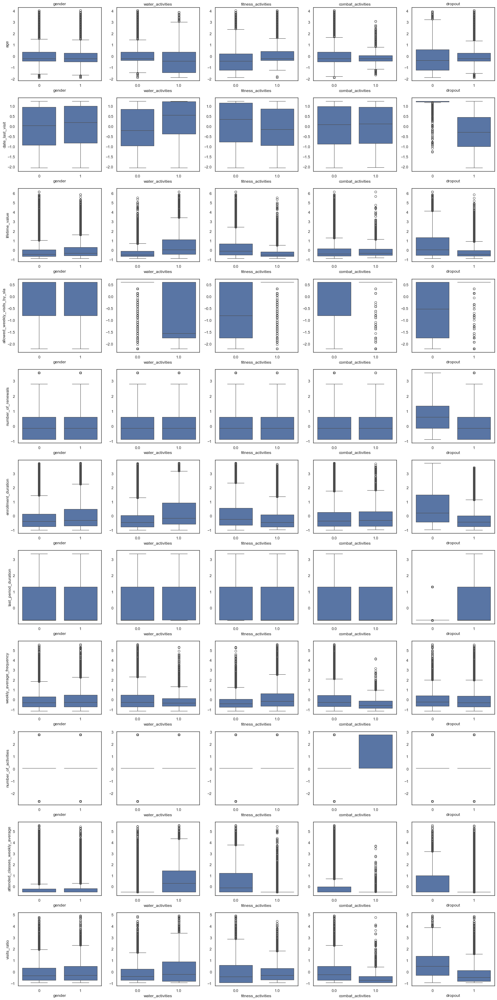

In [215]:
# Setting the number of plots per column (for each binary feature)
num_plots_per_col = len(metric_features)

# Create a figure and set of subplots
plt.figure(figsize=(20, 40))  # Adjust figure size as needed

# Iterate through each metric feature
for i, continuous in enumerate(metric_features, 1):
    # Iterate through each binary feature
    for j, binary in enumerate(binary_features, 1):
        # Set the subplot position based on the current metric and binary feature
        plt.subplot(num_plots_per_col, len(binary_features), (i - 1) * len(binary_features) + j)
        
        # Create a boxplot for the current binary and metric feature combination
        sns.boxplot(x=binary, y=continuous, data=df_feature_selection)
        
        # Set title for the first column of subplots
        if i == 1:
            plt.title(binary)
        
        # Set ylabel for the first row of subplots
        if j == 1:
            plt.ylabel(continuous)
        else:
            plt.ylabel('')  # Clear ylabel for other subplots in the same row

# Adjust layout to prevent subplot overlap
plt.tight_layout()
plt.show()

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

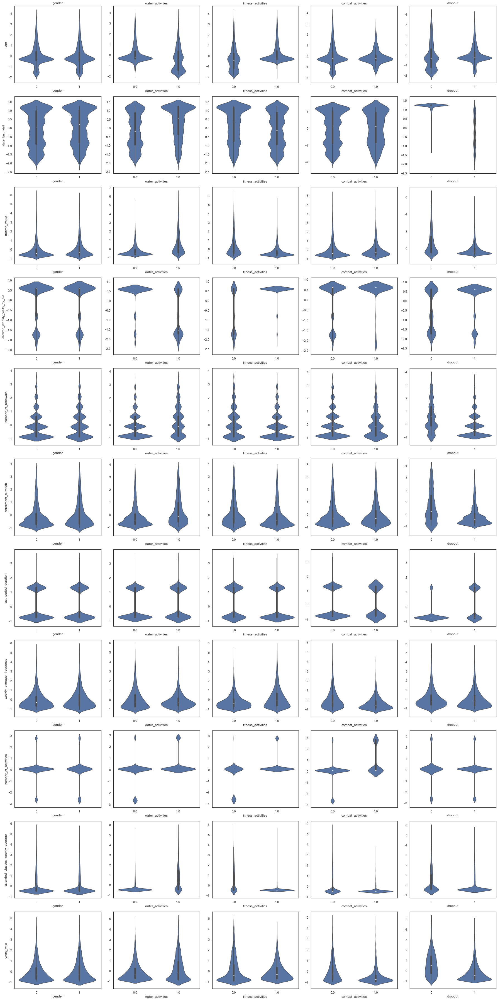

In [216]:
# Create a 10x5 grid of violin plots
plt.figure(figsize=(25, 50))  # Adjust the size as needed

# Iterate through each metric feature
for i, continuous in enumerate(metric_features, 1):
    # Iterate through each binary feature
    for j, binary in enumerate(binary_features, 1):
        ax = plt.subplot(len(metric_features), len(binary_features), (i - 1) * len(binary_features) + j)
        
        # Perform ANOVA to test for statistical significance between the binary categories
        group1 = df_feature_selection[df_feature_selection[binary] == df_feature_selection[binary].unique()[0]][continuous]
        group2 = df_feature_selection[df_feature_selection[binary] == df_feature_selection[binary].unique()[1]][continuous]
        f_val, p_val = stats.f_oneway(group1, group2)

        # Plot a violin plot for the current binary and metric feature combination
        sns.violinplot(x=binary, y=continuous, data=df_feature_selection)

        # Set titles for the top row and leftmost column
        if i == 1:
            ax.set_title(binary)
        
        # Set ylabel for the leftmost column
        if j == 1:
            ax.set_ylabel(continuous)
        else:
            ax.set_ylabel('')  # Clear ylabel for other subplots in the same row

plt.tight_layout()
plt.show()

**Feature Selection on Binary Features Boxplots & Violinplots Analysis Explanation**

After a comprehensive analysis of Boxplots and Violinplots, several key insights emerged:

* 'gender': The metric features display minimal variation between genders, suggesting an insignificant correlation with 'gender.' This lack of diversity in behavior across genders supports a strong case for the removal of 'gender' in the context of clustering, as it contributes little to the differentiation of customer segments.

* 'fitness_activities': The enrollment in fitness activities shows unclear correlation with the remaining metric features. The unclear variations in customer behavior based on participation in fitness activities during the enrollment period make it necessary for further investigation regarding removal in the clustering process, as it is not clear if it contributes to segmenting customers.

* 'combat_activities': Similar to 'fitness_activities,' enrollment in combat sports activities exhibits an unclear correlation with other metric features. The unclear variations in customer behavior related to combat activities during the enrollment period suggest that further investigation is necessary regarding its removal in the clustering process, as its impact on segmenting customers may be unclear.

It is important to note that these observations are based on a specific set of criteria and further analyses will be conducted to ensure a robust feature selection process for the clustering task. Different methodologies and criteria will be explored to refine the selection of relevant features for an accurate and meaningful segmentation of customers.

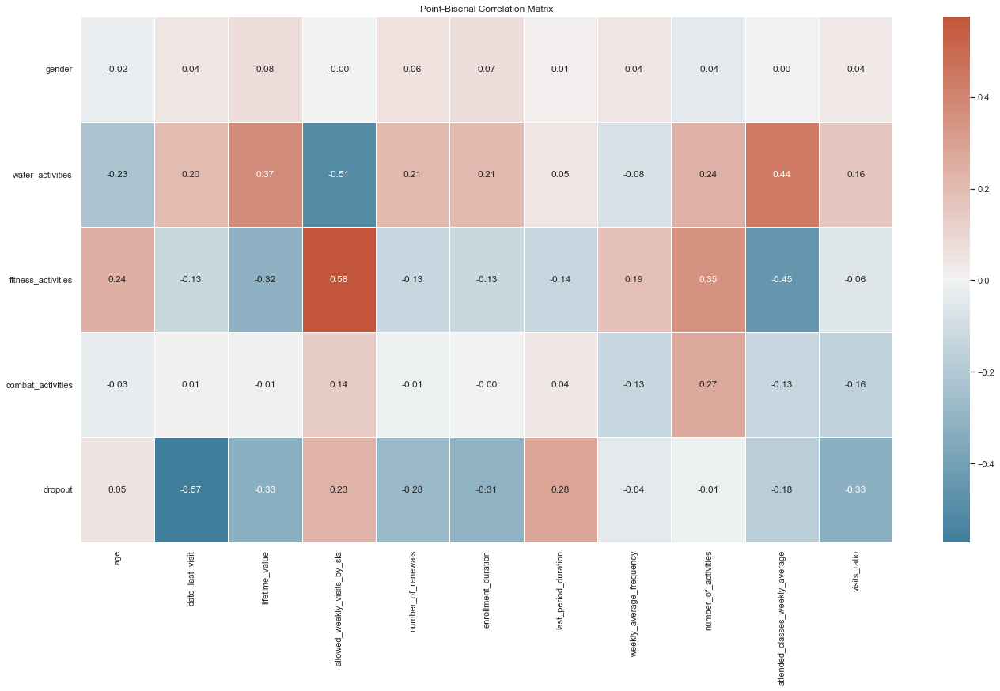

In [217]:
# Initialize an empty DataFrame to store Point-Biserial Correlation results
results_df = pd.DataFrame(columns=metric_features, index=binary_features)

# Calculate Point-Biserial Correlation for each pair of binary and continuous variables
for binary_feature in binary_features:
    for metric_feature in metric_features:
        # Compute Point-Biserial Correlation coefficient
        correlation, _ = pointbiserialr(df_feature_selection[binary_feature], df_feature_selection[metric_feature])
        # Store the correlation coefficient in the results DataFrame
        results_df.loc[binary_feature, metric_feature] = correlation

# Convert the results DataFrame to float type for proper visualization in the heatmap
results_df = results_df.astype(float)

# Set up the figure for the heatmap and define its size
plt.figure(figsize=(23, 12))

# Set the style for the heatmap
sns.set(style="white")

# Create a color palette for the heatmap using a diverging color scheme
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Create the heatmap using the correlation matrix, apply the mask, and annotate values
sns.heatmap(results_df, annot=True, cmap=cmap, center=0, linewidths=0.5, fmt=".2f")

# Set the title for the heatmap
plt.title("Point-Biserial Correlation Matrix")

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)
plt.yticks(rotation=0)

# Show the correlation matrix heatmap
plt.show()

**Feature Selection on Binary Features Point-Biserial Correlation Matrix Anaysis Explanation**

The Point-Biserial Correlation Matrix is a statistical measure that quantifies the relationship between a binary variable and a continuous variable. It assesses how changes in the binary variable are associated with variations in the continuous variable. Computed through the Point-Biserial Correlation coefficient, this method is particularly relevant for Feature Selection, helping identify binary features that exhibit meaningful correlations with continuous metrics.

* In this analysis, 'gender' once again demonstrates negligible correlations with every metric feature, with the highest correlation coefficient reaching only 0.08 in absolute value. This reaffirms the insignificance of 'gender' in capturing variations within the metric features, providing strong evidence for its removal in the context of clustering.

* Similarly, 'combat_activities' exhibits relatively weak correlations with every metric feature, with the highest correlation coefficient in absolute value reaching 0.27. This analysis using the Point-Biserial Correlation Matrix supports the recommendation for the removal of 'combat_activities' due to its limited association with the continuous metrics, contributing to more effective Feature Selection for subsequent clustering procedures.

**Feature Selection on Binary Features Wrap-up**

| Feature                           | Phi Coefficient Heatmap  | Boxplots & Violinplots | Point-Biserial Correlation Matrix |
| ----------------------------------- | ------ | ------ | --------- |
| gender  | Drop   | Drop | Drop   |
| water_activities   | Keep | Keep | Keep |
| fitness_activities   | Keep   | Keep | Keep |
| combat_activities    | Drop | Keep | Drop |
| dropout           | Drop | Keep | Keep |

In [218]:
df_feature_selection.drop(['gender', 'combat_activities'], inplace=True, axis=1)

In [219]:
# Remove the dropped binary features from the respective list
binary_features.remove('gender')
binary_features.remove('combat_activities')

**Feature Selection on Categorical Feature Approach Explanation**

Recognizing the paramount importance of the 'age' feature for the efficacy of the clustering solution, a strategic decision was made to exclude the 'age_groups' variable from the initial clustering calculations. The rationale behind this choice lies in the understanding that 'age' itself holds comprehensive and nuanced information critical for the formation of meaningful clusters.

However, it is important to note that the 'age_groups' feature, derived from 'age,' will not be discarded but reserved for subsequent stages of the analysis. This deliberate decision aims to leverage the simplicity and interpretability offered by age groupings during the interpretation phase of the formed clusters. By temporarily setting aside 'age_group' from the clustering calculations, it optimizes the model's ability to discern intricate patterns within the 'age' feature while preserving the means to articulate cluster insights through the lens of age groupings in the final interpretation.

In [220]:
df_feature_selection.drop('age_group', inplace=True, axis=1)

<a name="clustering"></a>
# 4. Clustering

In [221]:
# Create a copy of the DataFrame 'df_feature_selection' for clustering purposes
clustering_df = df_feature_selection.copy()

In [222]:
# A reminder of the features of the 'clustering_df' dataset
clustering_df.columns

Index(['age', 'date_last_visit', 'lifetime_value', 'water_activities',
       'fitness_activities', 'allowed_weekly_visits_by_sla',
       'number_of_renewals', 'dropout', 'enrollment_duration',
       'last_period_duration', 'weekly_average_frequency',
       'number_of_activities', 'attended_classes_weekly_average',
       'visits_ratio'],
      dtype='object')

In [223]:
# A preview of the first 3 rows of the 'clustering_df' dataset
clustering_df.head(3)

,age,date_last_visit,lifetime_value,water_activities,fitness_activities,allowed_weekly_visits_by_sla,number_of_renewals,dropout,enrollment_duration,last_period_duration,weekly_average_frequency,number_of_activities,attended_classes_weekly_average,visits_ratio
0,2.454929,1.258662,-0.601884,0.0,1.0,-1.083450,-0.872269,0,-0.866386,-0.738568,0.643046,0.064248,3.093106,1.048424
1,0.227214,-1.404217,0.556096,0.0,0.0,-1.741996,0.605141,1,-0.074284,1.301729,-0.475381,-2.644957,-0.402384,-0.568182
2,-0.203956,-0.250360,-0.755598,0.0,1.0,0.609952,-0.872269,1,-0.931618,-0.772385,1.157881,0.064248,-0.476701,0.313574


In [224]:
def get_r2_clustering(df, clustering_model):
    """
    Compute the R2 score for a clustering solution given by a clustering model.
    R2 is a measure of the homogeneity of a cluster solution, calculated as:
    R2 = 1 - (SSw / SSt), where SSt = SSb + SSw
    
    Parameters:
    df (DataFrame): The dataset to apply clustering.
    clustering_model (object): Clustering model object from scikit-learn (or compatible).
    
    Returns:
    float: R2 value for the clustering solution.
    """
    
    # Fit the clustering model to the dataset and obtain the cluster labels
    labels = clustering_model.fit_predict(df)
    
    # Calculate the overall centroid of the dataset
    overall_centroid = df.mean()
    
    # Calculate total sum of squares (SSt), which is the total variance in the dataset
    sst = ((df - overall_centroid) ** 2).sum().sum()
    
    # Calculate the within-cluster sum of squares (SSw)
    unique_labels = np.unique(labels)  # Get unique cluster labels
    ssw = 0
    for k in unique_labels:
        cluster_df = df.loc[labels == k]  # Data points in cluster k
        cluster_centroid = cluster_df.mean()  # Centroid of cluster k
        ssw += ((cluster_df - cluster_centroid) ** 2).sum().sum()  # Sum of squares for cluster k

    # Calculate the between-cluster sum of squares (SSb)
    ssb = sst - ssw
    
    # Compute the R2 score
    r2_score = ssb / sst
    
    return r2_score

<a name="hierarchical-clustering"></a>
## 4.1. Hierarchical Clustering

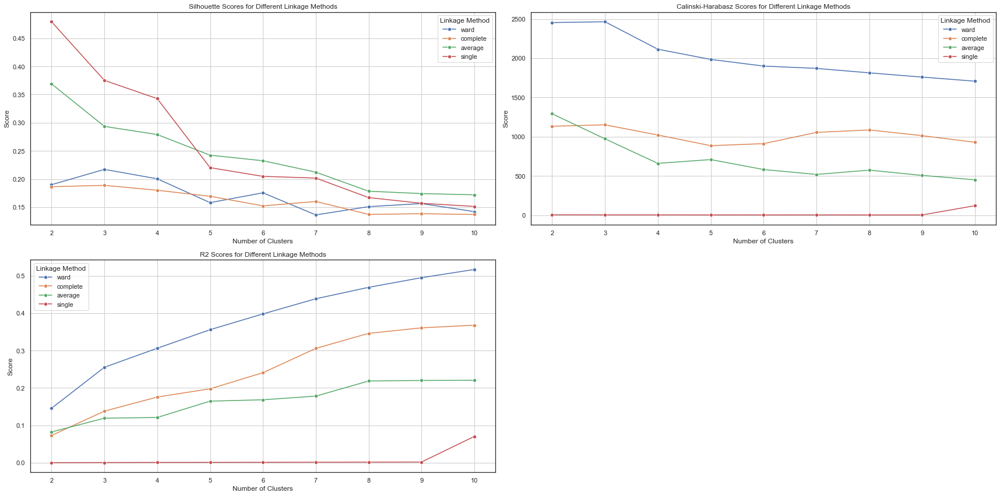

In [225]:
# Range of number of clusters to try (2 to 10 clusters)
num_clusters_range = range(2, 11)

# Linkage methods to try (ward, complete, average, single)
linkage_methods = ['ward', 'complete', 'average', 'single']

# Initialize a list to store the scores and corresponding configurations
scores_data = []

# Iterate over the range of number of clusters and linkage methods
for num_clusters in num_clusters_range:
    for linkage_method in linkage_methods:
        # Perform hierarchical clustering
        cluster = AgglomerativeClustering(n_clusters=num_clusters, affinity='euclidean', linkage=linkage_method)
        
        # Fit the model and predict clusters
        labels = cluster.fit_predict(clustering_df[metric_features])
        
        # Calculate silhouette score
        silhouette = silhouette_score(clustering_df[metric_features], labels)
        scores_data.append({'Metric': 'Silhouette', 'Linkage Method': linkage_method, 'Number of Clusters': num_clusters, 'Score': silhouette})
        
        # Calculate Calinski-Harabasz score
        calinski = calinski_harabasz_score(clustering_df[metric_features], labels)
        scores_data.append({'Metric': 'Calinski-Harabasz', 'Linkage Method': linkage_method, 'Number of Clusters': num_clusters, 'Score': calinski})
        
        # Calculate R2 score using the custom function
        r2_score = get_r2_clustering(clustering_df[metric_features], cluster)
        scores_data.append({'Metric': 'R2', 'Linkage Method': linkage_method, 'Number of Clusters': num_clusters, 'Score': r2_score})

# Convert scores data to a DataFrame
scores_df = pd.DataFrame(scores_data)

# Plotting the results using Seaborn
plt.figure(figsize=(24, 12))

# Silhouette score plot
plt.subplot(2, 2, 1)
sns.lineplot(data=scores_df[scores_df['Metric'] == 'Silhouette'], x='Number of Clusters', y='Score', hue='Linkage Method', marker='o')
plt.title('Silhouette Scores for Different Linkage Methods')
plt.grid(True)

# Calinski-Harabasz score plot
plt.subplot(2, 2, 2)
sns.lineplot(data=scores_df[scores_df['Metric'] == 'Calinski-Harabasz'], x='Number of Clusters', y='Score', hue='Linkage Method', marker='o')
plt.title('Calinski-Harabasz Scores for Different Linkage Methods')
plt.grid(True)

# R2 score plot
plt.subplot(2, 2, 3)
sns.lineplot(data=scores_df[scores_df['Metric'] == 'R2'], x='Number of Clusters', y='Score', hue='Linkage Method', marker='o')
plt.title('R2 Scores for Different Linkage Methods')
plt.grid(True)

plt.tight_layout()
plt.show()

After applying Hierarchical Clustering with an Agglomerative approach, with various linkages, considering a range of clusters from 2 to 10 and taking the Euclidean distance as the distance metric, the optimal number of clusters was determined based on relevant evaluation metrics. Despite the Silhouette score peaking for 2 clusters, indicating high quality of clustering, it was deemed insufficient for the XYZ Sports Company's business context. The decision was made to consider solutions with 3 or more clusters, under the assumption that at least 3 distinct segments are required to accurately capture the demographic and engagement patterns of the customer base. This decision is further supported by the Calinski-Harabasz index, which shows a significant peak at 3 clusters for the 'ward' linkage method, suggesting well-differentiated clusters. While the R² score improves with an increasing number of clusters, the sharp decline in Silhouette and Calinski-Harabasz scores beyond 3 clusters implies that more clusters do not necessarily enhance the quality of the segmentation. Consequently, 3 clusters were chosen as the optimal solution to align with the company's strategic business objectives and to provide a nuanced understanding of customer behaviors.

<a name="kmeans"></a>
### 4.2. K-Means

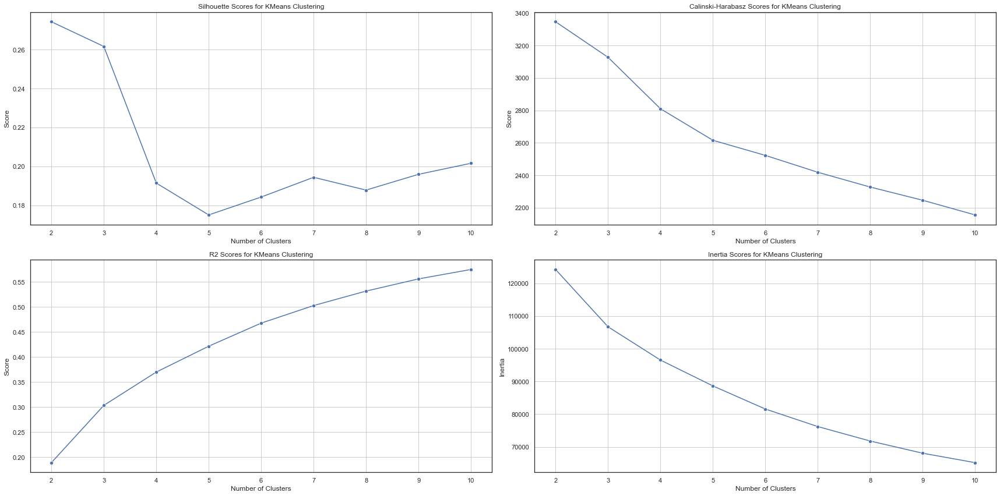

In [226]:
# Range of number of clusters to try (2 to 10 clusters)
num_clusters_range = range(2, 11)

# Initialize a list to store the scores and corresponding configurations
scores_data = []
inertia_scores = []

for num_clusters in num_clusters_range:
    # Perform KMeans clustering
    cluster = KMeans(n_clusters=num_clusters, random_state=42, n_init=500)
    labels = cluster.fit_predict(clustering_df[metric_features])

    # Store inertia score
    inertia_scores.append({'Number of Clusters': num_clusters, 'Inertia': cluster.inertia_})

    # Calculate and store other metrics
    silhouette = silhouette_score(clustering_df[metric_features], labels)
    scores_data.append({'Metric': 'Silhouette', 'Number of Clusters': num_clusters, 'Score': silhouette})

    calinski = calinski_harabasz_score(clustering_df[metric_features], labels)
    scores_data.append({'Metric': 'Calinski-Harabasz', 'Number of Clusters': num_clusters, 'Score': calinski})

    r2_score = get_r2_clustering(clustering_df[metric_features], cluster)
    scores_data.append({'Metric': 'R2', 'Number of Clusters': num_clusters, 'Score': r2_score})

# Convert scores data to a DataFrame
scores_df = pd.DataFrame(scores_data)
inertia_df = pd.DataFrame(inertia_scores)

# Plotting the results using Seaborn
plt.figure(figsize=(24, 12))

# Silhouette score plot
plt.subplot(2, 2, 1)
sns.lineplot(data=scores_df[scores_df['Metric'] == 'Silhouette'], x='Number of Clusters', y='Score', marker='o')
plt.title('Silhouette Scores for KMeans Clustering')
plt.grid(True)

# Calinski-Harabasz score plot
plt.subplot(2, 2, 2)
sns.lineplot(data=scores_df[scores_df['Metric'] == 'Calinski-Harabasz'], x='Number of Clusters', y='Score', marker='o')
plt.title('Calinski-Harabasz Scores for KMeans Clustering')
plt.grid(True)

# R2 score plot
plt.subplot(2, 2, 3)
sns.lineplot(data=scores_df[scores_df['Metric'] == 'R2'], x='Number of Clusters', y='Score', marker='o')
plt.title('R2 Scores for KMeans Clustering')
plt.grid(True)

# Inertia score plot
plt.subplot(2, 2, 4)
sns.lineplot(data=inertia_df, x='Number of Clusters', y='Inertia', marker='o')
plt.title('Inertia Scores for KMeans Clustering')
plt.grid(True)

plt.tight_layout()
plt.show()

In determining the optimal number of clusters for the K-Means clustering model, with parameters including n_init=500 and init='k-means++', a suite of evaluation metrics was employed. The analysis of the Silhouette Scores reveals that while the peak performance occurs at 2 clusters, this number was considered insufficient for the nuanced customer segmentation required by XYZ Sports Company. As a result, cluster solutions starting from 3 clusters were evaluated, aligning with the business necessity to capture diverse customer demographics and engagement levels.

The R² Scores, which reflect the proportion of variance explained by the clusters, show a continuous increase, suggesting improved homogeneity with more clusters. However, it is the Calinski-Harabasz Score that provides a decisive insight; although it decreases steadily as the number of clusters grows, indicating less distinct clustering, the highest value is observed at 2 clusters. Despite this, to meet the business imperatives, a minimum of 3 clusters was preferred.

Inertia, a measure of within-cluster variance, also declines with the increase in the number of clusters, hinting at tighter clusters. Yet, in considering the business context and the need for actionable segmentation, a balance between too few and too many clusters was essential. Thus, the decision was made to adopt a clustering solution that reflects a comprehensive understanding of the customer base, surpassing the highest statistical scores to meet strategic business goals and providing a foundation for targeted marketing strategies.

Conclusively, the optimal number of clusters for the K-Means clustering, considering both the statistical evidence and the business context, was determined to be higher than the suggested 2 clusters by Silhouette Scores, with a preference of 3 clusters to ensure a robust and insightful customer segmentation. This decision aligns with the strategic objectives of XYZ Sports Company and allows for the development of nuanced marketing strategies targeting distinct customer segments identified through the clustering process.

### *K-Means Silhoutte Analysis*

For n_clusters = 2, the average silhouette_score is : 0.27429874487769623


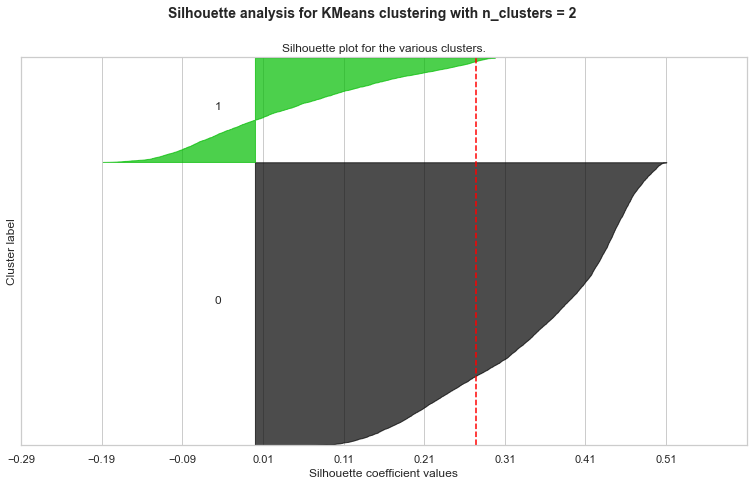

For n_clusters = 3, the average silhouette_score is : 0.26160591558405305


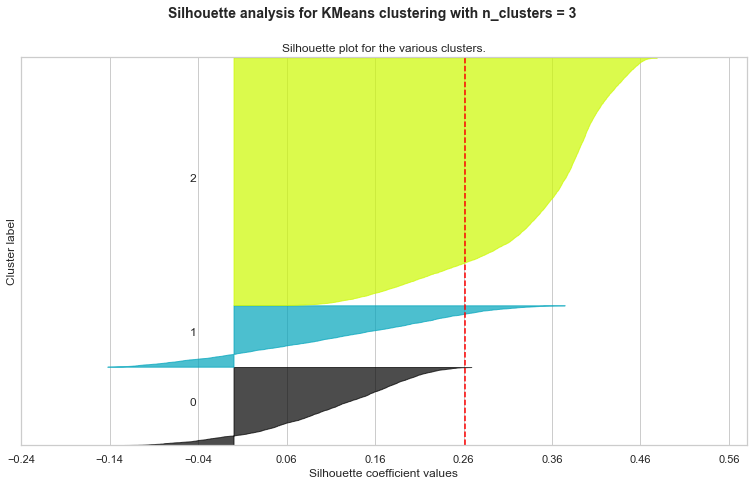

For n_clusters = 4, the average silhouette_score is : 0.19143520497058336


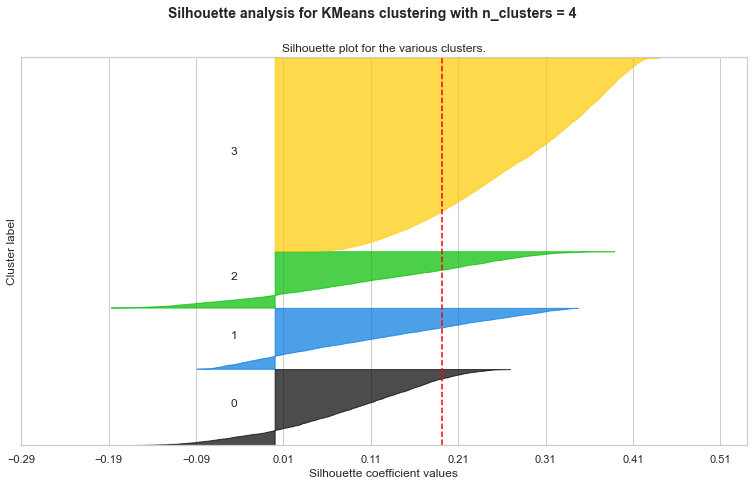

For n_clusters = 5, the average silhouette_score is : 0.17507536742266536


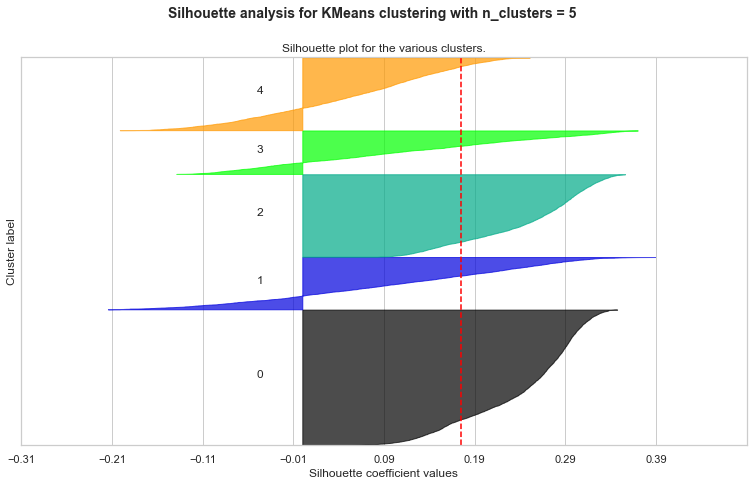

For n_clusters = 6, the average silhouette_score is : 0.18426330828023701


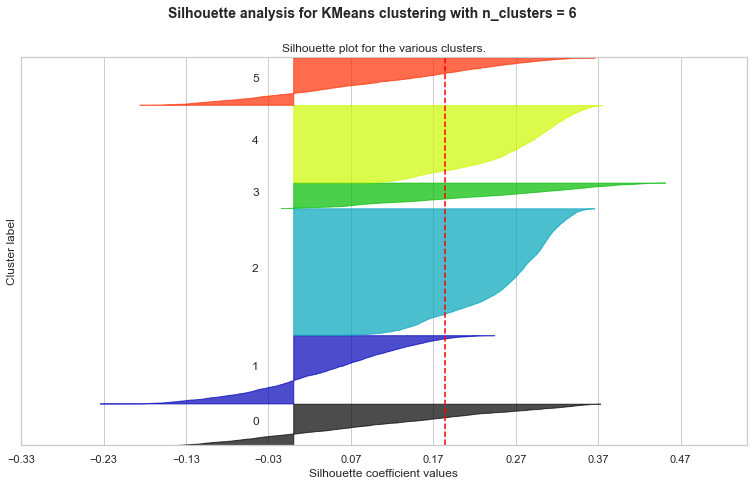

For n_clusters = 7, the average silhouette_score is : 0.1943993263582134


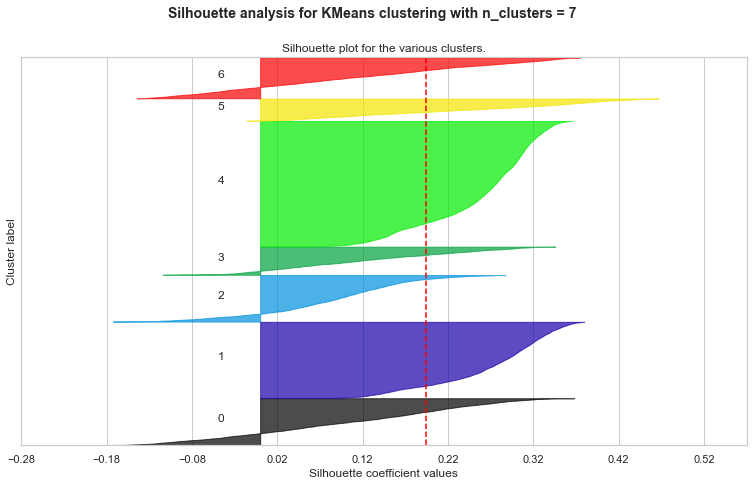

For n_clusters = 8, the average silhouette_score is : 0.18783801598286712


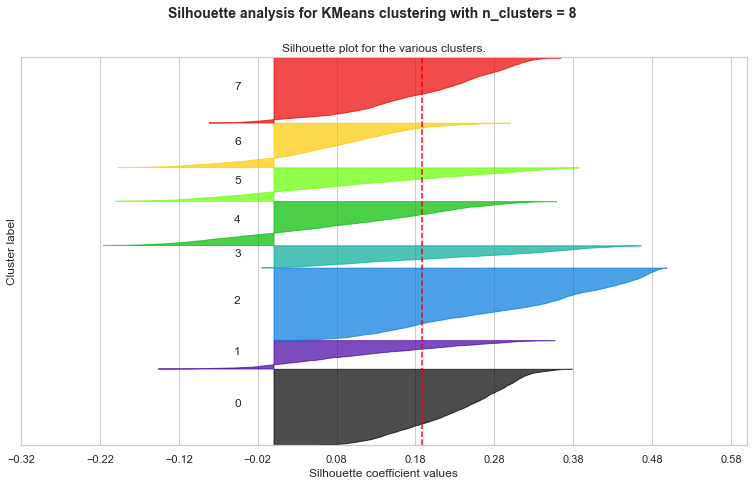

For n_clusters = 9, the average silhouette_score is : 0.1959261772157062


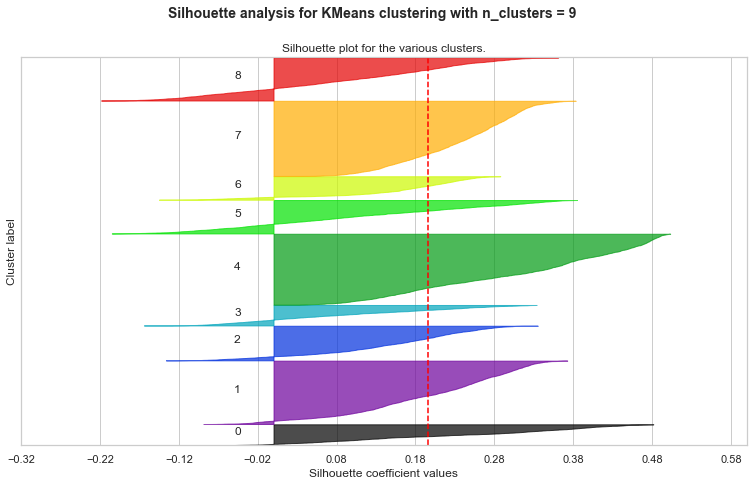

For n_clusters = 10, the average silhouette_score is : 0.2015959152273324


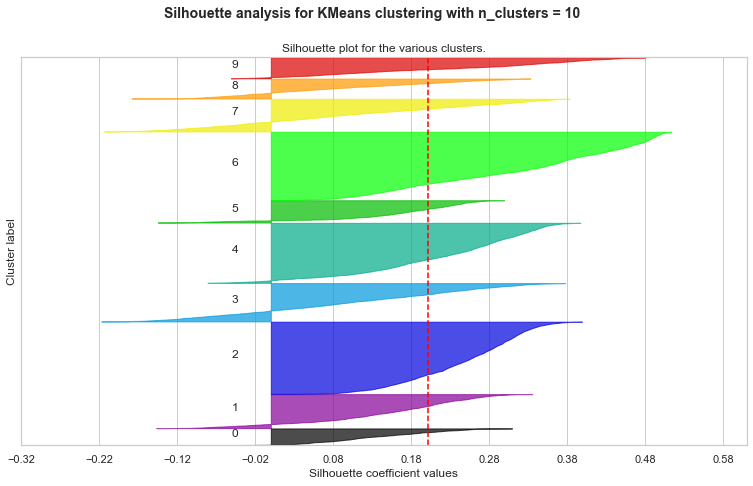

In [227]:
# Define the range of clusters to try
range_clusters = range(2, 11)

# Seaborn style for more beautiful plots
sns.set(style="whitegrid")

for nclus in range_clusters:
    # Create a subplot with 1 row and 1 column
    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(13, 7)

    # Initialize the KMeans object and fit to data
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=500, random_state=42)
    cluster_labels = kmclust.fit_predict(clustering_df[metric_features])

    # Silhouette score for the current number of clusters
    silhouette_avg = silhouette_score(clustering_df[metric_features], cluster_labels)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(clustering_df[metric_features], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / nclus)
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    ax1.set_title("Silhouette plot for the various clusters.")
    ax1.set_xlabel("Silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    xmin, xmax = np.round(sample_silhouette_values.min() - 0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    ax1.set_xlim([xmin, xmax])
    ax1.set_ylim([0, len(clustering_df[metric_features]) + (nclus + 1) * 10])

    ax1.set_yticks([])
    ax1.set_xticks(np.arange(xmin, xmax, 0.1))

    plt.suptitle(f"Silhouette analysis for KMeans clustering with n_clusters = {nclus}", fontsize=14, fontweight='bold')
    plt.show()

<a name="partioning-around-medoids"></a>
### 4.3 Partioning Around Medoids

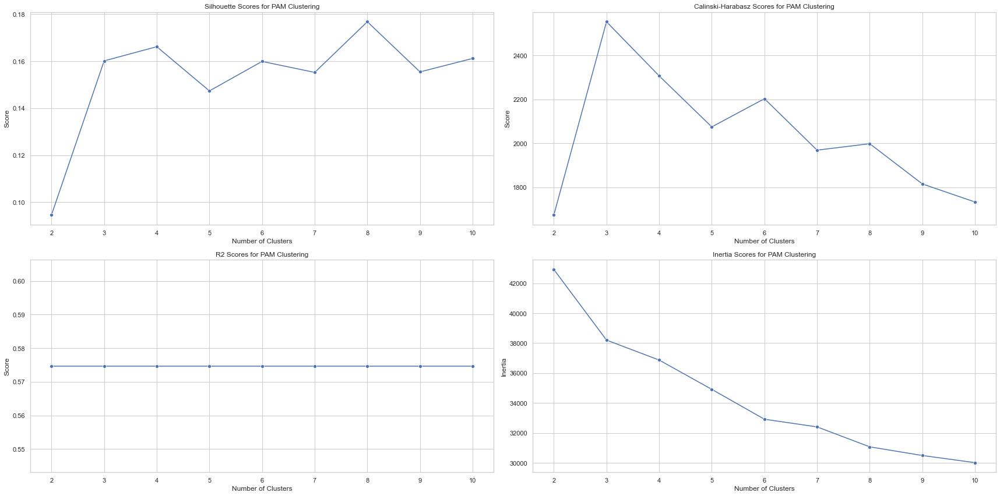

In [228]:
# Range of number of clusters to try (2 to 10 clusters)
num_clusters_range = range(2, 11)

# Initialize a list to store the scores and corresponding configurations
scores_data = []
inertia_scores = []

for num_clusters in num_clusters_range:
    # Perform PAM clustering
    cluster = KMedoids(n_clusters=num_clusters, random_state=42, init='k-medoids++', max_iter=500)
    labels = cluster.fit_predict(clustering_df[metric_features])

    # Store inertia score (total sum of distances to the closest medoid)
    inertia_scores.append({'Number of Clusters': num_clusters, 'Inertia': cluster.inertia_})

    # Calculate and store other metrics
    silhouette = silhouette_score(clustering_df[metric_features], labels)
    scores_data.append({'Metric': 'Silhouette', 'Number of Clusters': num_clusters, 'Score': silhouette})

    calinski = calinski_harabasz_score(clustering_df[metric_features], labels)
    scores_data.append({'Metric': 'Calinski-Harabasz', 'Number of Clusters': num_clusters, 'Score': calinski})

    r2_scores = get_r2_clustering(clustering_df[metric_features], cluster)
    scores_data.append({'Metric': 'R2', 'Number of Clusters': num_clusters, 'Score': r2_score})

# Convert scores data to a DataFrame
scores_df = pd.DataFrame(scores_data)
inertia_df = pd.DataFrame(inertia_scores)

# Plotting the results using Seaborn
plt.figure(figsize=(24, 12))

# Silhouette score plot
plt.subplot(2, 2, 1)
sns.lineplot(data=scores_df[scores_df['Metric'] == 'Silhouette'], x='Number of Clusters', y='Score', marker='o')
plt.title('Silhouette Scores for PAM Clustering')
plt.grid(True)

# Calinski-Harabasz score plot
plt.subplot(2, 2, 2)
sns.lineplot(data=scores_df[scores_df['Metric'] == 'Calinski-Harabasz'], x='Number of Clusters', y='Score', marker='o')
plt.title('Calinski-Harabasz Scores for PAM Clustering')
plt.grid(True)

# R2 score plot
plt.subplot(2, 2, 3)
sns.lineplot(data=scores_df[scores_df['Metric'] == 'R2'], x='Number of Clusters', y='Score', marker='o')
plt.title('R2 Scores for PAM Clustering')
plt.grid(True)

# Inertia score plot
plt.subplot(2, 2, 4)
sns.lineplot(data=inertia_df, x='Number of Clusters', y='Inertia', marker='o')
plt.title('Inertia Scores for PAM Clustering')
plt.grid(True)

plt.tight_layout()
plt.show()

In the application of Partitioning Around Medoids (PAM) clustering, configured with `max_iter=500` and `init='k-medoids++'`, the evaluation metrics suggested that a 3-cluster solution strikes the optimal balance for the XYZ Sports Company's dataset. This conclusion is drawn from a confluence of factors: 

- The Silhouette Score, which assesses the similarity within clusters versus between clusters, indicated a satisfactory level of cluster compactness and separation at three clusters.
- The Calinski-Harabasz Index, a measure of cluster density and distinction, reached its apex at three clusters, signifying the most well-defined cluster structure within the evaluated range.
- The Inertia score, representing the within-cluster sum of squares, decreased significantly when moving from two to three clusters, demonstrating enhanced cluster tightness without over-segmentation.

Conclusively, the choice of three clusters as the optimal number is anchored not just in statistical validity but also in the practical need to capture demographic and engagement level patterns that are actionable for business insights. This number of clusters offers a strong silhouette score, the highest Calinski-Harabasz score, and a substantial reduction in inertia, indicating clear and meaningful segmentation conducive to strategic marketing and customer engagement initiatives.

### *Partioning Around Medoids Silhoutte Analysis*

For n_clusters = 2, the average silhouette_score is : 0.09456660579704147


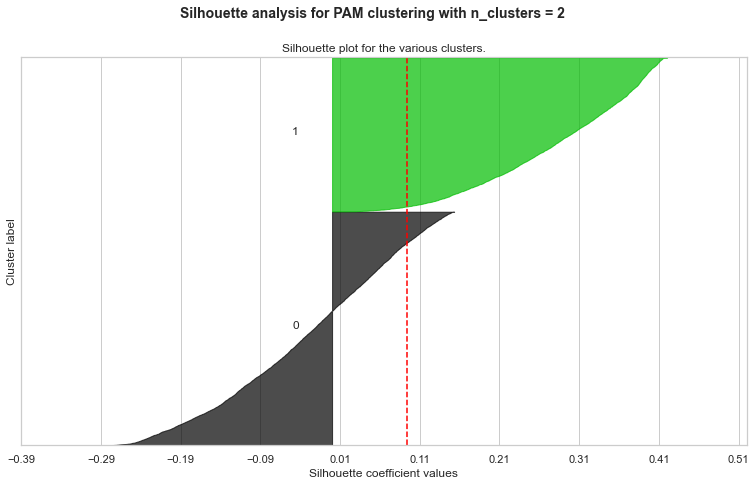

For n_clusters = 3, the average silhouette_score is : 0.1601364312495141


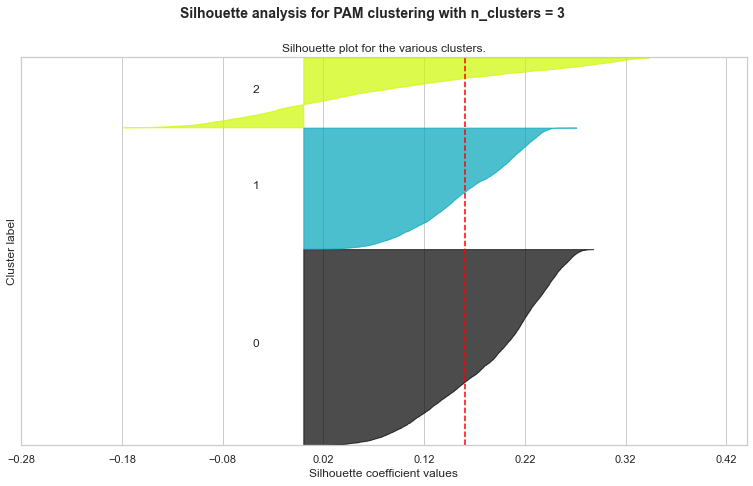

For n_clusters = 4, the average silhouette_score is : 0.1661663467849288


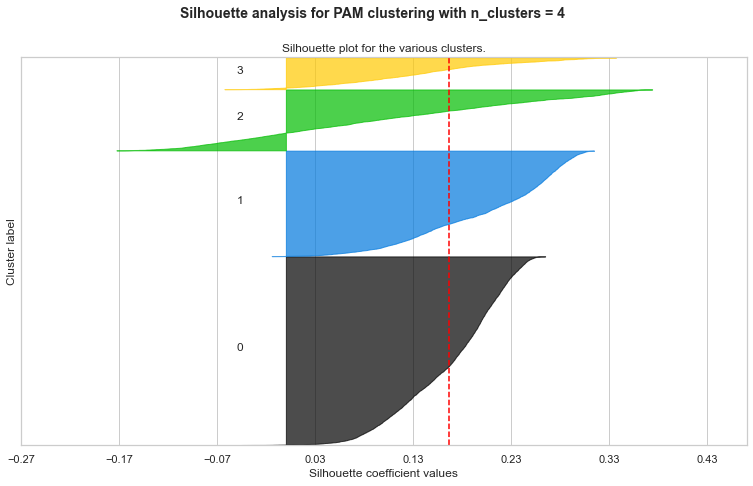

For n_clusters = 5, the average silhouette_score is : 0.147355255888086


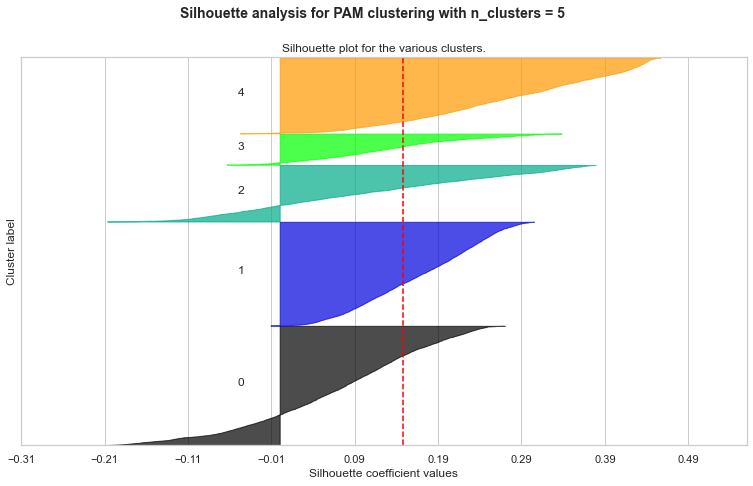

For n_clusters = 6, the average silhouette_score is : 0.15990557156849602


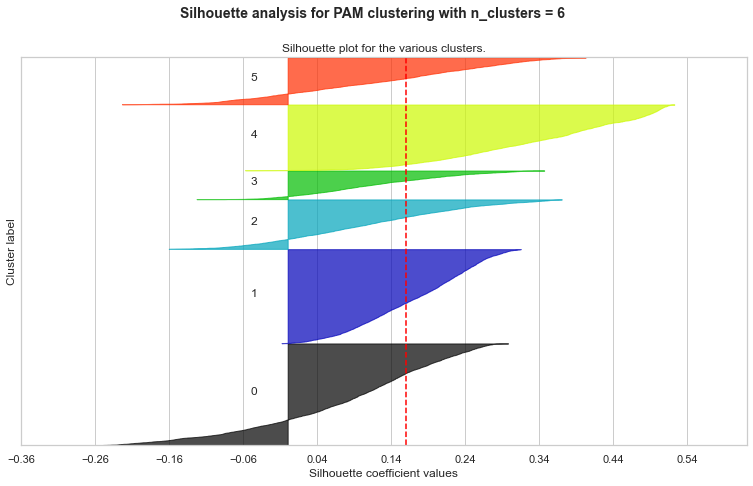

For n_clusters = 7, the average silhouette_score is : 0.1552235660589431


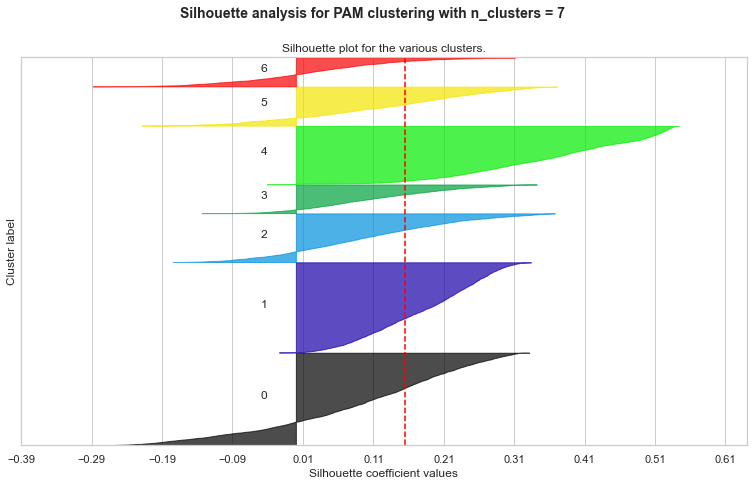

For n_clusters = 8, the average silhouette_score is : 0.17678988412442534


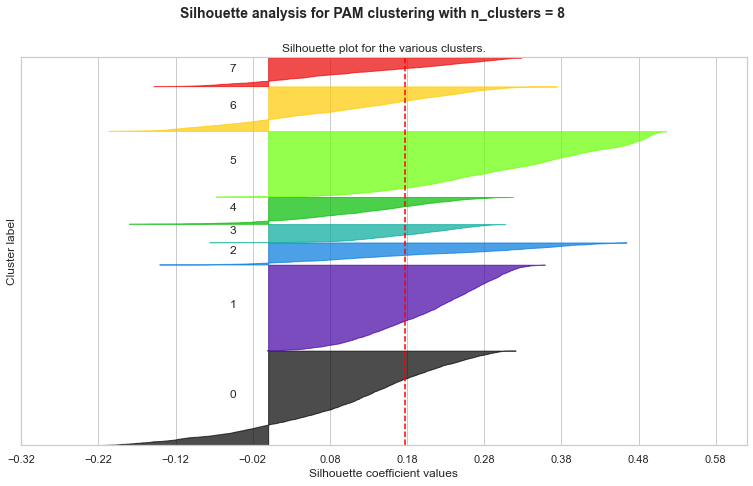

For n_clusters = 9, the average silhouette_score is : 0.15544655272077038


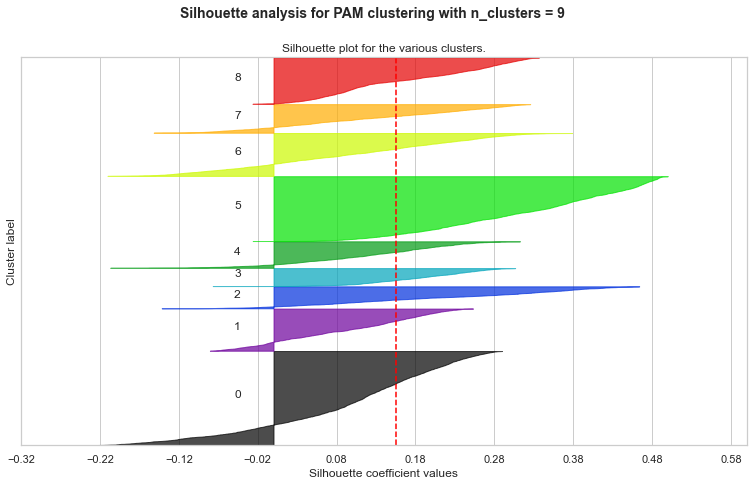

For n_clusters = 10, the average silhouette_score is : 0.16117608710250667


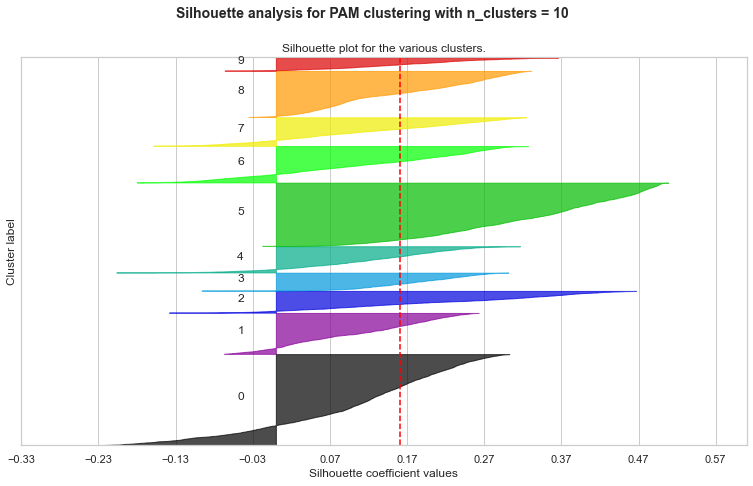

In [229]:
# Define the range of clusters to try
range_clusters = range(2, 11)

# Seaborn style for more beautiful plots
sns.set(style="whitegrid")

for nclus in range_clusters:
    # Create a subplot with 1 row and 1 column
    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(13, 7)

    # Initialize the KMedoids object and fit to data
    medoid_clust = KMedoids(n_clusters=nclus, random_state=42, init='k-medoids++', max_iter=500)
    cluster_labels = medoid_clust.fit_predict(clustering_df[metric_features])

    # Silhouette score for the current number of clusters
    silhouette_avg = silhouette_score(clustering_df[metric_features], cluster_labels)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(clustering_df[metric_features], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / nclus)
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    ax1.set_title("Silhouette plot for the various clusters.")
    ax1.set_xlabel("Silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    xmin, xmax = np.round(sample_silhouette_values.min() - 0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    ax1.set_xlim([xmin, xmax])
    ax1.set_ylim([0, len(clustering_df[metric_features]) + (nclus + 1) * 10])

    ax1.set_yticks([])
    ax1.set_xticks(np.arange(xmin, xmax, 0.1))

    plt.suptitle(f"Silhouette analysis for PAM clustering with n_clusters = {nclus}", fontsize=14, fontweight='bold')
    plt.show()

<a name="self-organizing-maps"></a>
### 4.4 Self Organizing Maps

In [230]:
# Set the random seed to ensure reproducibility
np.random.seed(42)

# Initialize a Self-Organizing Map (SOM) using the SOMFactory provided by the sompy library
# The SOM is built using the metric features of the DataFrame 'clustering_df'
# The mapsize parameter determines the size of the SOM grid, here set to 50x50
# 'random' initialization initializes the weights randomly
# 'gaussian' neighborhood function specifies the type of neighborhood to use during training
# 'batch' training mode indicates that the entire dataset is used for each iteration during training
# 'hexa' lattice defines the shape of the grid as hexagonal
# The component_names parameter assigns names to the components of the metric features
sm = sompy.SOMFactory().build(
    clustering_df[metric_features].values, 
    mapsize=[50, 50],  
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=metric_features
)

# Train the SOM with specified parameters
# n_job sets the number of parallel jobs to use during training (here, 4 parallel jobs)
# verbose='info' displays detailed information during the training process
# train_rough_len and train_finetune_len control the lengths of the rough and fine-tune training phases, respectively
sm.train(n_job=4, verbose='info', train_rough_len=200, train_finetune_len=200)

 Training...
 random_initialization took: 0.003000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 200

 epoch: 1 ---> elapsed time:  0.441000, quantization error: 3.270899

 epoch: 2 ---> elapsed time:  0.414000, quantization error: 3.093232

 epoch: 3 ---> elapsed time:  0.418000, quantization error: 3.066601

 epoch: 4 ---> elapsed time:  0.402000, quantization error: 3.056572

 epoch: 5 ---> elapsed time:  0.392000, quantization error: 3.053210

 epoch: 6 ---> elapsed time:  0.407000, quantization error: 3.050900

 epoch: 7 ---> elapsed time:  0.400000, quantization error: 3.048649

 epoch: 8 ---> elapsed time:  0.407000, quantization error: 3.046464

 epoch: 9 ---> elapsed time:  0.416000, quantization error: 3.044999

 epoch: 10 ---> elapsed time:  0.422000, quantization error: 3.044021

 epoch: 11 ---> elapsed time:  0.406000, quantization error: 3.043247

 epoch: 12 ---> elapsed time:  0.425000, quantization error: 3.042571

 epoch: 13 --->

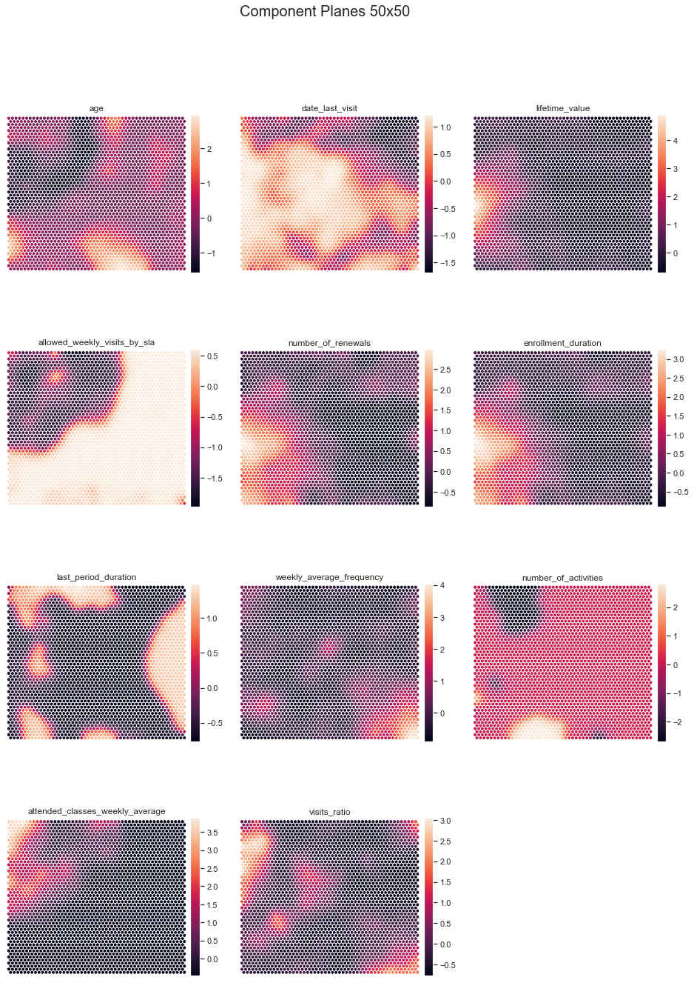

In [231]:
# Component planes on the 50x50 grid
sns.set()
view2D = View2D(12,12,"", text_size=10)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes 50x50", fontsize=20)
plt.show()

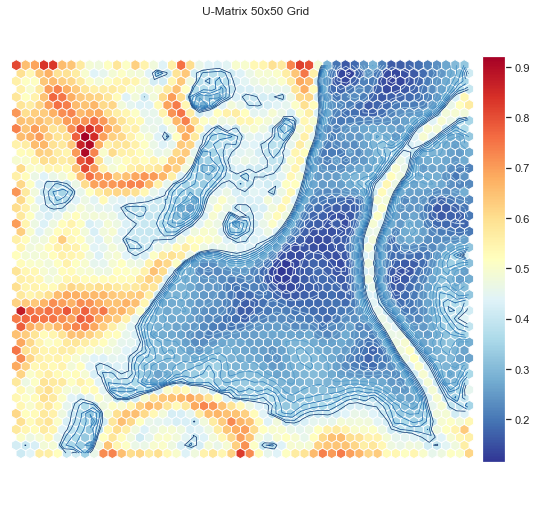

In [232]:
# Create a U-Matrix view for the trained SOM
u = sompy.umatrix.UMatrixView(9, 9, 'U-Matrix 50x50 Grid', show_axis=True, text_size=8, show_text=True)

# Generate the U-Matrix and display it
UMAT = u.show(
    sm, 
    distance=2,  # Distance parameter for U-Matrix calculation
    row_normalized=False, 
    show_data=False, 
    contour=True  # Display contour lines
)

### *Hierarchical Clustering on top of Self Organizing Maps' units*

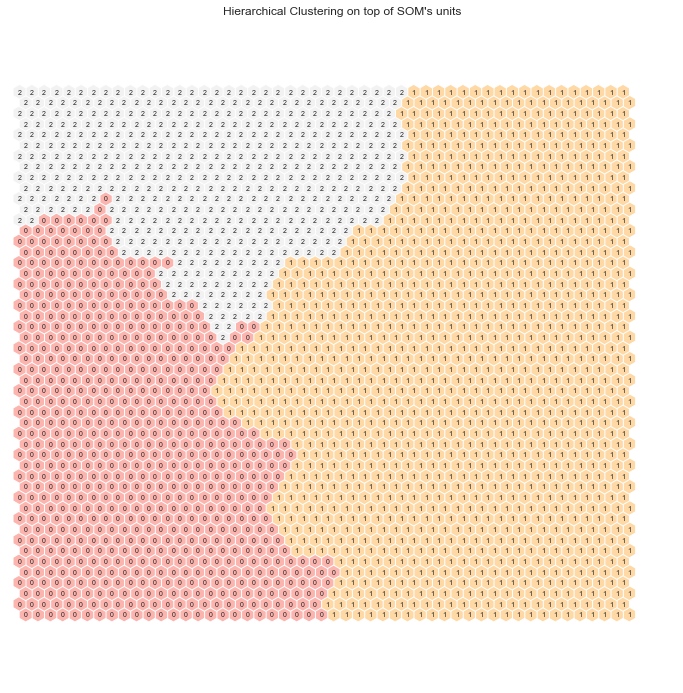

In [233]:
# Perform Hierarchical clustering on top of the 2500 units (sm.get_node_vectors() output)
hierclust = AgglomerativeClustering(n_clusters=3, linkage='ward')
nodeclus_labels = hierclust.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Hierarchical Clustering on top of SOM's units",text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

### *K-Means on top of Self Organizing Maps' units*

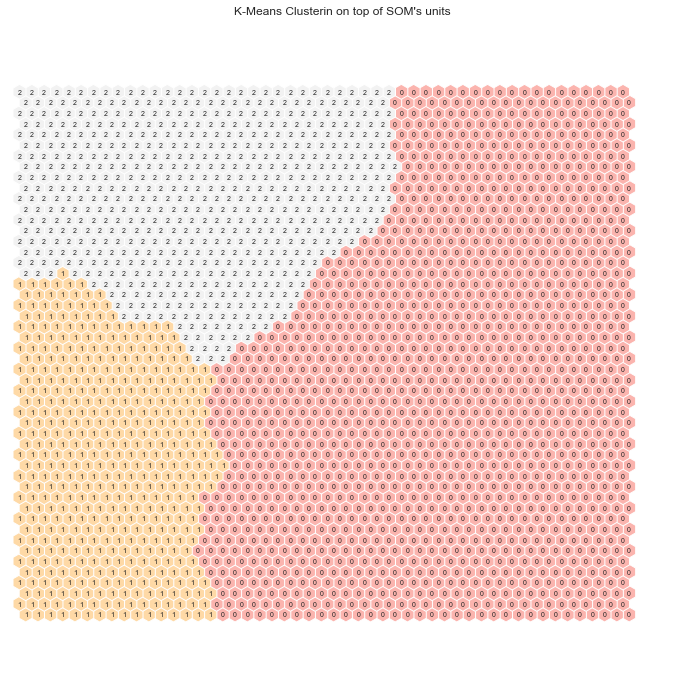

In [234]:
# Perform K-Means clustering on top of the 2500 units (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=3, init='k-means++', n_init=500, random_state=42)
nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"K-Means Clusterin on top of SOM's units", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

Upon applying Hierarchical Agglomerative clustering on a 50x50 Self-Organizing Map (SOM) grid, the division into three distinct clusters demonstrates a clear separation among the clusters, as depicted in the visualization. This clustering solution, underpinned by the chosen optimal number of clusters, reveals tightly grouped units within each cluster with minimal overlap or scattering of units across cluster boundaries. The clusters show a homogenous distribution, which underlines the algorithm's effectiveness in capturing the underlying patterns within the data.

Similarly, the K-Means clustering approach, utilizing the same 50x50 SOM grid and retaining the established optimal three-cluster configuration, corroborates the consistency and reliability of the clustering solution. The K-Means results exhibit distinct clusters with clear demarcations, and no stray units are observed closer to the centroids of other clusters. This reinforces the robustness of the clustering analysis, as each cluster is well-defined and compact, indicating that the chosen features and the number of clusters are well-suited for capturing the intrinsic customer segments within the dataset.

The lack of scattered points near other clusters' centroids in both Hierarchical and K-Means clustering methods affirms the stability and reliability of the clustering solutions. The results suggest that the clusters represent meaningful groupings within the customer data, which can be leveraged to tailor specific strategies and interventions for each identified segment.

<a name="gaussian-mixture-models"></a>
## 4.5. Gaussian Mixture Models

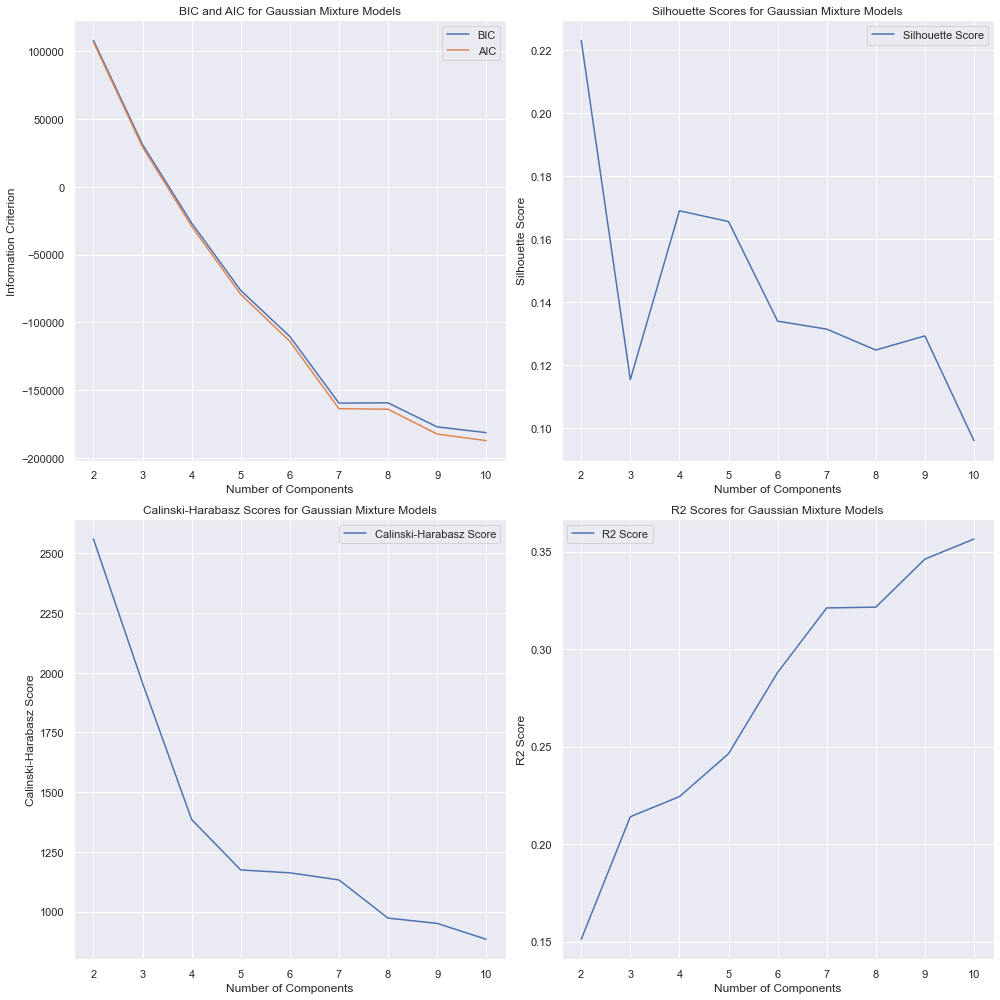

In [235]:
# Extract metric features and convert them to a numpy array for processing
data = clustering_df[metric_features].values

# Selecting number of components based on AIC and BIC
n_components = np.arange(2, 11)
models = [GaussianMixture(n, covariance_type='full', random_state=42, n_init=10).fit(data) for n in n_components]

# Calculate BIC, AIC, Silhouette, Calinski-Harabasz, and R2 scores for each model
bic_values = [m.bic(data) for m in models]
aic_values = [m.aic(data) for m in models]
silhouette_scores = [silhouette_score(data, m.predict(data)) for m in models]
calinski_scores = [calinski_harabasz_score(data, m.predict(data)) for m in models]
r2_scores = [get_r2_clustering(clustering_df[metric_features], m) for m in models]

# Plotting AIC and BIC values
plt.figure(figsize=(14, 14))

# Subplot for BIC and AIC
plt.subplot(2, 2, 1)
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('Number of Components')
plt.ylabel('Information Criterion')
plt.title('BIC and AIC for Gaussian Mixture Models')
plt.xticks(n_components)

# Subplot for Silhouette Score
plt.subplot(2, 2, 2)
plt.plot(n_components, silhouette_scores, label='Silhouette Score')
plt.legend(loc='best')
plt.xlabel('Number of Components')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores for Gaussian Mixture Models')
plt.xticks(n_components)

# Subplot for Calinski-Harabasz Score
plt.subplot(2, 2, 3)
plt.plot(n_components, calinski_scores, label='Calinski-Harabasz Score')
plt.legend(loc='best')
plt.xlabel('Number of Components')
plt.ylabel('Calinski-Harabasz Score')
plt.title('Calinski-Harabasz Scores for Gaussian Mixture Models')
plt.xticks(n_components)

# Subplot for R2 Score
plt.subplot(2, 2, 4)
plt.plot(n_components, r2_scores, label='R2 Score')
plt.legend(loc='best')
plt.xlabel('Number of Components')
plt.ylabel('R2 Score')
plt.title('R2 Scores for Gaussian Mixture Models')
plt.xticks(n_components)

plt.tight_layout()
plt.show()

The evaluation metrics displayed for the Gaussian Mixture Models (GMM) offer critical insights into the optimal clustering of the dataset. The Bayesian Information Criterion (BIC) and Akaike Information Criterion (AIC) both suggest that increasing the number of components (clusters) continually improves the model fit up to a point, after which the improvements plateau. The lowest BIC and AIC scores are observed with a higher number of clusters, indicating better model selection with more components, but the gentle slope beyond the 7-cluster mark suggests diminishing returns.

The Silhouette Score, which assesses the compactness of clusters, peaks notably at 2 clusters, indicating strong intra-cluster similarity and inter-cluster separation at this level. However, the Silhouette score turns out to play an erratic behavior as the number of clusters increases, suggesting that the clusters exhibit a questionable degree of separation and coherence as they are divided further.

The Calinski-Harabasz Score, a measure of cluster validity, is significantly higher for a smaller number of clusters, with a sharp decline as the number increases, suggesting that too many clusters may lead to a loss of cluster definition.

Lastly, the R² Score, which indicates the proportion of variance explained by the clusters, shows a consistent increase as more clusters are added.

In conclusion, while the BIC and AIC point towards a higher number of clusters as being preferable, the other metrics suggest that a simpler model with fewer clusters may be more interpretable and meaningful. Given the context of XYZ Sports Company's business needs and the metrics provided, a 3-cluster solution appears to be the optimal balance. It offers a good compromise between complexity and the clustering's interpretive utility, aligning with the company's strategic imperatives to effectively segment and understand its customer base. This solution, therefore, is selected for its ability to provide actionable insights while maintaining clustering parsimony.

<a name="k-prototypes"></a>
## 4.6. K-Prototypes

In [236]:
# List of binary features remaining
binary_features = ['water_activities', 'fitness_activities', 'dropout']

# Convert each binary feature to boolean
for feature in binary_features:
    clustering_df[feature] = df[feature].astype(bool)

# Now clustering_df[binary_features] are all in boolean format (False/True)

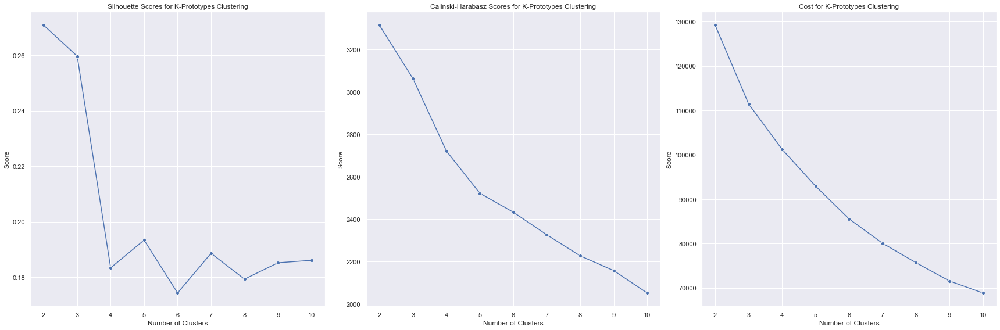

In [237]:
# Range of number of clusters to try (2 to 10 clusters)
num_clusters_range = range(2, 11)

# Initialize a list to store the evaluation metrics
scores_data = []

# Convert binary feature names to their corresponding indices
binary_feature_indices = [clustering_df.columns.get_loc(col) for col in binary_features]

# Iterate over the number of clusters
for num_clusters in num_clusters_range:
    # Perform K-Prototypes clustering
    kproto = KPrototypes(n_clusters=num_clusters, init='Cao', n_init=10, verbose=0)
    clusters = kproto.fit_predict(clustering_df, categorical=binary_feature_indices)

    # Store the cost (measure of dissimilarity; lower values indicate better clustering)
    cost = kproto.cost_
    scores_data.append({'Metric': 'Cost', 'Number of Clusters': num_clusters, 'Score': cost})

    # Calculate and store silhouette and Calinski-Harabasz score
    silhouette = silhouette_score(clustering_df, clusters)
    scores_data.append({'Metric': 'Silhouette', 'Number of Clusters': num_clusters, 'Score': silhouette})

    calinski = calinski_harabasz_score(clustering_df, clusters)
    scores_data.append({'Metric': 'Calinski-Harabasz', 'Number of Clusters': num_clusters, 'Score': calinski})

# Convert scores data to a DataFrame
scores_df = pd.DataFrame(scores_data)

# Plotting the results using Seaborn
plt.figure(figsize=(24, 8))

# Silhouette score plot
plt.subplot(1, 3, 1)
sns.lineplot(data=scores_df[scores_df['Metric'] == 'Silhouette'], x='Number of Clusters', y='Score', marker='o')
plt.title('Silhouette Scores for K-Prototypes Clustering')
plt.grid(True)

# Calinski-Harabasz score plot
plt.subplot(1, 3, 2)
sns.lineplot(data=scores_df[scores_df['Metric'] == 'Calinski-Harabasz'], x='Number of Clusters', y='Score', marker='o')
plt.title('Calinski-Harabasz Scores for K-Prototypes Clustering')
plt.grid(True)

# Cost plot
plt.subplot(1, 3, 3)
sns.lineplot(data=scores_df[scores_df['Metric'] == 'Cost'], x='Number of Clusters', y='Score', marker='o')
plt.title('Cost for K-Prototypes Clustering')
plt.grid(True)

plt.tight_layout()
plt.show()

In the realm of customer segmentation, the K-Prototypes clustering algorithm was employed as a strategic approach. K-Prototypes, an extension of the K-Means algorithm, is uniquely suited for handling mixed data types, combining categorical and numerical data. This makes it possible to be used with the present dataset due to the presence of binary features, which can be considered as categorical.

For the implementation of K-Prototypes, the initialization method 'Cao' was selected. This method is particularly efficient for initializing the centroids in a manner conducive to the mixed data types (numerical and binary). Additionally, n_init was set to 10, a decision influenced by the algorithm's computational intensity, which necessitates a balance between thoroughness and efficiency.

The quest to determine the optimal number of clusters culminated in a decision favoring a 3-cluster solution. This decision was supported by a combination of factors:

**Silhouette Score:** Although the highest silhouette scores were observed at 2 clusters, indicating the strongest cohesion and separation at this number, the 3-cluster solution also demonstrated a robust silhouette score. This suggests a commendable level of internal consistency within clusters and separation between them, even with the additional cluster.

**Calinski-Harabasz Score:** Similar to the silhouette scores, the Calinski-Harabasz Score, which measures cluster density and distinction, peaked at 2 clusters. However, the score for 3 clusters was also notably high, indicating well-defined and dense clusters.

**Cost Metric:** The Cost metric, a measure of the compactness of clusters in K-Prototypes, showed a predictable decrease with the addition of more clusters. However, a 3-cluster solution struck a balance between the complexity of the model and the quality of the clustering, marking it as a practical and efficient choice.

**Business Context Imperatives:** Consistent with the findings from other clustering techniques employed throughout the analysis, a minimum of 3 clusters was preferred. This choice aligns with the business need to effectively capture and model the demographic and engagement patterns of customers, thereby providing actionable insights for targeted marketing strategies. 

<a name="final-solution-and-clustering-by-perspective"></a>
## 4.7. Final Solution & Clustering By Perspective

The clustering explorations encompassed a variety of algorithms and configurations, each with its strengths and particular insights into the customer data. However, after rigorous evaluation, the K-Means clustering algorithm, with three clusters for each perspective (Customer Value & Commitment and Customer Activity & Engagement), emerged as the chosen method for segmenting the XYZ Sports Company's customer base.

This decision was made based on several compelling reasons:

**Optimal Number of Segments:** The three-cluster solution aligned with the business objective of capturing diverse customer demographics and engagement levels without overcomplicating the model with excessive granularity.

**Convergence and Stability:** The parameter n_init=500 ensured that the K-Means algorithm ran 500 times with different centroid seeds, leading to a more stable and reliable outcome, reducing the likelihood of converging to a local minimum of the inertia value.

**Effective Initialization:** The init='k-means++' parameter was instrumental in providing an intelligent initial placement of the centroids, which contributed to better convergence of the algorithm and improved the quality of the clustering.

**Clustering Metrics:** K-Means with these settings produced a satisfactory silhouette score (~0.26), indicating a reasonable distance between the clusters. The clusters were dense and well-separated, which was also supported by the Calinski-Harabasz score (3127.61). The obtained R^2 of approximately 0.30 is the second highest (after PAM) which is also indicative of a good overall solution. 

**Computational Efficiency:** Despite the high number of initializations, the algorithm proved to be computationally efficient, making it a pragmatic choice for the company's ongoing operational use.

**Business Relevance:** The three distinct clusters by perspective offered actionable insights, enabling targeted marketing strategies and customer engagement initiatives, thus providing practical value to the business.

In essence, the computational feasibility and alignment with business strategy rendered the K-Means clustering with three clusters by perspective as the superior choice among the clustering methods considered.

In [238]:
# Define a list of features related to the customer's value and their commitment to the facility.
customer_value_and_commitment = [
    'age',  # Customer's age which is correlated with its income, which can be considered as potential customer value.
    'lifetime_value',  # Cumulative value the customer has provided to the facility over time.
    'enrollment_duration',  # Total time the customer has been enrolled with the facility, indicating the length of the relationship.
    'last_period_duration'  # Duration of the most recent membership period, which can indicate the current level of commitment.
]

# Define a list of features related to the customer's activity levels and engagement with the facility.
customer_activity_and_engagement = [
    'allowed_weekly_visits_by_sla',  # The number of visits a customer is entitled to per week based on their service level agreement.
    'weekly_average_frequency',  # Normalized measure of the customer's visit frequency per week.
    'number_of_activities',  # Count of different activities a customer participates in, reflecting engagement variety.
    'attended_classes_weekly_average',  # Average number of classes attended by the customer on a weekly basis, a sign of active engagement.
    'visits_ratio',  # Ratio of actual visits to the number of visits allowed, indicating utilization of the services provided.
    'date_last_visit',  # Date of the customer's last visit, which helps assess how recently they have engaged with the facility.
]

# Create a new DataFrame for customer value and commitment features for further clustering analysis.
customer_value_and_commitment_df = clustering_df[customer_value_and_commitment].copy()

# Create a new DataFrame for customer activity and engagement features for further clustering analysis.
customer_activity_and_engagement_df = clustering_df[customer_activity_and_engagement].copy()

In [239]:
# Set the number of clusters to 3 for both KMeans clustering models.
n_clusters = 3

# Initialize the KMeans clustering algorithm for the customer value and commitment perspective.
# 'n_init' specifies the number of time the k-means algorithm will be run with different centroid seeds.
kmeans_value_commitment = KMeans(n_clusters=n_clusters, random_state=42, n_init=500)

# Fit the KMeans model to the customer value and commitment DataFrame.
kmeans_value_commitment.fit(customer_value_and_commitment_df)

# Assign the cluster labels to the original DataFrame 'clustering_df' under a new column.
# This labels each customer with the cluster they belong to from the value and commitment perspective.
clustering_df['value_commitment_label'] = kmeans_value_commitment.labels_

# Initialize the KMeans clustering algorithm for the customer activity and engagement perspective.
kmeans_activity_engagement = KMeans(n_clusters=n_clusters, random_state=42, n_init=500)

# Fit the KMeans model to the customer activity and engagement DataFrame.
kmeans_activity_engagement.fit(customer_activity_and_engagement_df)

# Assign the cluster labels to the original DataFrame 'clustering_df' under a new column.
# This labels each customer with the cluster they belong to from the activity and engagement perspective.
clustering_df['activity_engagement_label'] = kmeans_activity_engagement.labels_

# The original DataFrame 'clustering_df' now contains two new columns with clustering labels
# for further analysis, segmentation, and targeted marketing strategies.

In [240]:
# Use pandas crosstab to compute a cross-tabulation of two (or more) factors.
# This function is used here to compare the clustering results from two different perspectives:
# 'value_commitment_label' and 'activity_engagement_label'.
# It will show how many times each combination of the 'value_commitment' and 'activity_engagement' 
# cluster labels occur together, effectively showing the relationship between the two cluster assignments.

pd.crosstab(
    clustering_df['value_commitment_label'],  # The first clustering label used as rows in the crosstab.
    clustering_df['activity_engagement_label']  # The second clustering label used as columns in the crosstab.
)

# The result is a DataFrame where each row represents a cluster from 'value_commitment_label',
# each column represents a cluster from 'activity_engagement_label', and each cell contains
# the count of observations that belong to the corresponding row/column label combination.
# This is helpful for understanding the distribution between the two clustering models.

activity_engagement_label,0,1,2
value_commitment_label,,,
0,1382,1511,4618
1,1012,358,733
2,1330,730,2696


In [241]:
# Group the original DataFrame 'clustering_df' by the labels from both clustering models:
# 'value_commitment_label' and 'activity_engagement_label'.
# This step involves grouping the data such that it is possible to analyze it based on the clusters
# assigned from the two different perspectives (value commitment and activity engagement).

df_centroids = clustering_df.groupby(['value_commitment_label', 'activity_engagement_label'])[
    metric_features].mean()

# Calculate the mean of all the metric features for each group.
# 'metric_features' is a list of numerical columns for which it is desired to calculate the mean.
# The mean is calculated for each unique combination of 'value_commitment_label' and 
# 'activity_engagement_label', resulting in the centroid (average point) of each group.

# Store the resulting centroids in a new DataFrame 'df_centroids'.
# Each row in 'df_centroids' represents the centroid of a unique combination of clusters 
# from value commitment and activity engagement perspectives.
# These centroids can be used to understand the typical profile of each combined cluster group.

# Display the centroids DataFrame
df_centroids

# This resulting DataFrame 'df_centroids' is useful for interpreting the characteristics 
# of each cluster group, as it provides the average values of all metric features for each 
# group. This can help in understanding the defining traits of each cluster segment.

age  date_last_visit  \
value_commitment_label activity_engagement_label                              
0                      0                         -0.576889         0.467321   
                       1                          0.302738         0.429658   
                       2                          0.090867        -0.299017   
1                      0                         -0.909508         0.899224   
                       1                          0.818368         0.997703   
                       2                          0.477309         0.628194   
2                      0                         -0.389770        -0.455766   
                       1                          0.223966        -0.043155   
                       2                          0.142292        -0.394393   

                                                  lifetime_value  \
value_commitment_label activity_engagement_label                   
0                      0                               -0.158026   
                       1                               -0.396589   
                       2                               -0.473875   
1                      0                                2.262071   
                       1                                1.698168   
                       2                                1.018339   
2                      0                                0.022361   
                       1                               -0.239906   
                       2                               -0.337469   

                                                  allowed_weekly_visits_by_sla  \
value_commitment_label activity_engagement_label                                 
0                      0                                             -1.485289   
                       1                                              0.383443   
                       2                                              0.578844   
1                      0                                             -1.514238   
                       1                                              0.602069   
                       2                                              0.559897   
2                      0                                             -1.648625   
                       1                                              0.598354   
                       2                                              0.564414   

                                                  number_of_renewals  \
value_commitment_label activity_engagement_label                       
0                      0                                   -0.312094   
                       1                                   -0.502672   
                       2                                   -0.294486   
1                      0                                    1.580348   
                       1                                    1.585266   
                       2                                    1.818512   
2                      0                                   -0.133564   
                       1                                   -0.478631   
                       2                                   -0.283169   

                                                  enrollment_duration  \
value_commitment_label activity_engagement_label                        
0                      0                                    -0.386352   
                       1                                    -0.513849   
                       2                                    -0.352778   
1                      0                                     1.716220   
                       1                                     1.804803   
                       2                                     2.018915   
2                      0                                    -0.215169   
                       1                                    -0.368105   
          

In [242]:
# Initialize Hierarchical Clustering (Agglomerative Clustering) with specific parameters:
# 'linkage': 'ward' method minimizes the variance of clusters being merged.
# 'metric': Use 'euclidean' distance to measure the dissimilarity between each pair of observations.
# 'distance_threshold': Set to 0 to compute a full dendogram, useful for detailed analysis.
# 'n_clusters': Set to 'None' to allow the algorithm to decide the number of clusters based on the distance threshold.

hclust = AgglomerativeClustering(
    linkage='ward', 
    metric='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)

# Fit the hierarchical clustering model to the centroids DataFrame 'df_centroids' and predict labels.
# 'df_centroids' contains the mean values of the clusters obtained from KMeans clustering.
# This step performs clustering on these centroids to identify hierarchical relationships among them.

hclust_labels = hclust.fit_predict(df_centroids)

# The variable 'hclust_labels' now holds the cluster labels assigned by hierarchical clustering.

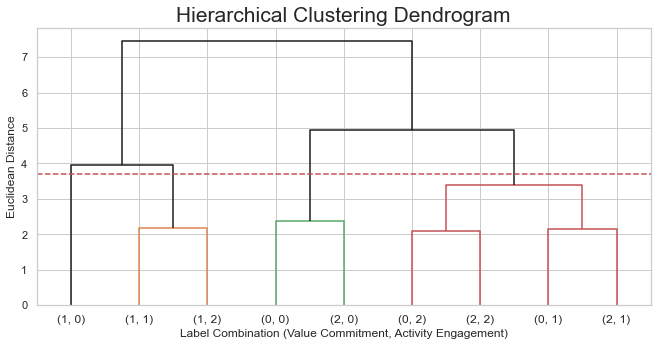

In [244]:
# Calculate the number of samples for use in the dendrogram
n_samples = len(hclust.labels_)

# Initialize an array to hold the count of samples in each node formed during hierarchical clustering
counts = np.zeros(hclust.children_.shape[0])

# Iterate through each merge (pair of clusters or points being merged) in the hierarchical clustering
for i, merge in enumerate(hclust.children_):
    current_count = 0  # Initialize count for the current node
    for child_idx in merge:
        if child_idx < n_samples:
            current_count += 1  # Count individual data point
        else:
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count  # Store the count for the current cluster/node

# Create the linkage matrix required for the dendrogram. It includes:
# - The pairs of clusters merged
# - The distance at which they are merged
# - The number of samples in each newly formed cluster
linkage_matrix = np.column_stack([hclust.children_, hclust.distances_, counts]).astype(float)

# Define y_threshold for dendrogram for clustering merging decision
y_threshold = 3.7

# Plotting the dendrogram
sns.set(style="whitegrid")  # Set the seaborn plot style
fig = plt.figure(figsize=(11, 5))
dendrogram(
    linkage_matrix, 
    truncate_mode='level', 
    labels=df_centroids.index,  
    p=5,  
    color_threshold=y_threshold, 
    above_threshold_color='k'
)
plt.hlines(y_threshold, 0, plt.gca().get_xlim()[1], colors="r", linestyles="dashed")
plt.title('Hierarchical Clustering Dendrogram', fontsize=21)
plt.xlabel('Label Combination (Value Commitment, Activity Engagement)')
plt.ylabel('Euclidean Distance')
plt.show()

The dendrogram offers a detailed illustration of the hierarchical agglomerative clustering process applied to the K-Means-defined clusters. Each join in the dendrogram signifies the fusion of clusters, with the y-axis indicating the Euclidean distance; the greater the height of the join, the greater the dissimilarity between the merging clusters.

The chosen y-threshold for merging, set at a Euclidean distance of 3.7 and highlighted by the dotted line, is a deliberate decision to distinguish between clusters. This threshold ensures a clear demarcation, allowing for the identification of clusters with internal homogeneity while maximizing differentiation between them.

Clusters merging below this threshold, such as those labeled (Value Commitment=1, Activity Engagement=1) and (Value Commitment=1, Activity Engagement=2), display strong within-group similarity, suggesting cohesive cluster characteristics. Conversely, the clusters (Value Commitment=0, Activity Engagement=0) and (Value Commitment=0, Activity Engagement=1), which merge above the threshold, are recognized as distinct entities.

The rationale behind the 3.7 threshold is multifaceted:

**Optimal Cluster Count:** The threshold yields 4 discernible clusters, a number that balances complexity with the necessity of a meaningful customer segmentation.

**Cluster Separation:** The selected distance indicates a natural partition within the data, where an increase in distance would be required to merge clusters, highlighting intrinsic separations.

**Business Context:** For the XYZ Sports Company, 4 clusters afford a granular, yet manageable, understanding of customer demographics and engagement levels, aligning with strategic business applications and allowing for the design of marketing strategies for each of the found clusters.

In essence, the dendrogram and threshold underscore the reliability of the clustering solution, capturing the diversity of the dataset in a manner conducive to targeted marketing and customer engagement strategies.

#### *Cluster Merging*

In [245]:
# Re-running the Hierarchical clustering based on the decided number of final clusters (4 clusters)
hclust = AgglomerativeClustering(
    n_clusters=4,
    metric='euclidean',
    linkage='ward'
)
    
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

df_centroids

age  date_last_visit  \
value_commitment_label activity_engagement_label                              
0                      0                         -0.576889         0.467321   
                       1                          0.302738         0.429658   
                       2                          0.090867        -0.299017   
1                      0                         -0.909508         0.899224   
                       1                          0.818368         0.997703   
                       2                          0.477309         0.628194   
2                      0                         -0.389770        -0.455766   
                       1                          0.223966        -0.043155   
                       2                          0.142292        -0.394393   

                                                  lifetime_value  \
value_commitment_label activity_engagement_label                   
0                      0                               -0.158026   
                       1                               -0.396589   
                       2                               -0.473875   
1                      0                                2.262071   
                       1                                1.698168   
                       2                                1.018339   
2                      0                                0.022361   
                       1                               -0.239906   
                       2                               -0.337469   

                                                  allowed_weekly_visits_by_sla  \
value_commitment_label activity_engagement_label                                 
0                      0                                             -1.485289   
                       1                                              0.383443   
                       2                                              0.578844   
1                      0                                             -1.514238   
                       1                                              0.602069   
                       2                                              0.559897   
2                      0                                             -1.648625   
                       1                                              0.598354   
                       2                                              0.564414   

                                                  number_of_renewals  \
value_commitment_label activity_engagement_label                       
0                      0                                   -0.312094   
                       1                                   -0.502672   
                       2                                   -0.294486   
1                      0                                    1.580348   
                       1                                    1.585266   
                       2                                    1.818512   
2                      0                                   -0.133564   
                       1                                   -0.478631   
                       2                                   -0.283169   

                                                  enrollment_duration  \
value_commitment_label activity_engagement_label                        
0                      0                                    -0.386352   
                       1                                    -0.513849   
                       2                                    -0.352778   
1                      0                                     1.716220   
                       1                                     1.804803   
                       2                                     2.018915   
2                      0                                    -0.215169   
                       1                                    -0.368105   
          

In [246]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

df_ = clustering_df.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_['merged_labels'] = df_.apply(lambda row: cluster_mapper[(row['value_commitment_label'], row['activity_engagement_label'])], axis=1)

# Merged cluster centroids
df_.groupby('merged_labels').mean()[metric_features]

,age,date_last_visit,lifetime_value,allowed_weekly_visits_by_sla,number_of_renewals,enrollment_duration,last_period_duration,weekly_average_frequency,number_of_activities,attended_classes_weekly_average,visits_ratio
merged_labels,,,,,,,,,,,
0,0.149050,-0.191150,-0.405290,0.545363,-0.338283,-0.358779,-0.016808,0.104740,0.149026,-0.446722,-0.154733
1,0.589224,0.749444,1.241417,0.573736,1.741975,1.948656,-0.302346,0.092844,0.459082,-0.387403,-0.024139
2,-0.485124,0.014627,-0.069562,-1.565391,-0.224541,-0.302402,0.279340,-0.341339,-0.674989,1.146661,0.274413
3,-0.909508,0.899224,2.262071,-1.514238,1.580348,1.716220,-0.274074,-0.317534,-0.160626,1.385028,0.597197


In [247]:
# Final dataframe with the final cluster assignment
df_.head(5)

,age,date_last_visit,lifetime_value,water_activities,fitness_activities,allowed_weekly_visits_by_sla,number_of_renewals,dropout,enrollment_duration,last_period_duration,weekly_average_frequency,number_of_activities,attended_classes_weekly_average,visits_ratio,value_commitment_label,activity_engagement_label,merged_labels
0,2.454929,1.258662,-0.601884,False,True,-1.083450,-0.872269,False,-0.866386,-0.738568,0.643046,0.064248,3.093106,1.048424,0,0,2
1,0.227214,-1.404217,0.556096,False,False,-1.741996,0.605141,True,-0.074284,1.301729,-0.475381,-2.644957,-0.402384,-0.568182,2,0,2
2,-0.203956,-0.250360,-0.755598,False,True,0.609952,-0.872269,True,-0.931618,-0.772385,1.157881,0.064248,-0.476701,0.313574,0,1,0
3,-1.210021,0.779445,-0.405694,False,False,-1.741996,-0.872269,True,-0.628755,1.301729,0.296523,-2.644957,-0.106971,0.124708,2,0,2
4,0.658385,0.035131,0.241242,False,True,0.609952,1.343846,True,0.811006,-0.772385,-0.533836,0.064248,-0.476701,-0.923654,0,2,0


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


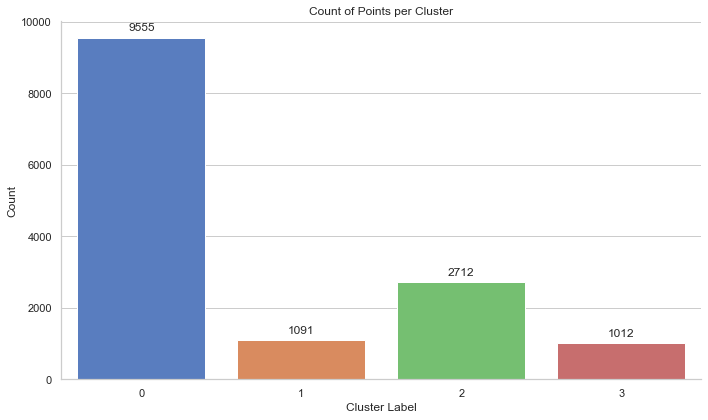

In [248]:
# Count the occurrences of each cluster label
cluster_counts = df_['merged_labels'].value_counts().sort_index()

# Convert the series to DataFrame for plotting
cluster_counts_df = cluster_counts.reset_index()
cluster_counts_df.columns = ['Cluster Label', 'Count']

# Create a bar plot using Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Cluster Label', y='Count', data=cluster_counts_df, palette='muted')

# Adding the text labels for each bar
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                xytext=(0, 10), 
                textcoords='offset points')

plt.title('Count of Points per Cluster')
plt.xlabel('Cluster Label')
plt.ylabel('Count')
plt.xticks(rotation=0)  # Rotate x-axis labels to show them horizontally
sns.despine()  # Remove the top and right spines from plot

plt.tight_layout()
plt.show()

In [249]:
# Create the final dataframe by filtering the original dataframe to keep only the indexes present in df_ (inlier points)
final_df = no_outlier_no_missing_df.loc[df_.index]

# Add the 'merged_labels' column from df_ to the final dataframe
final_df['cluster'] = df_['merged_labels']

# Rename the 'merged_labels' column to 'cluster'
final_df.rename(columns={'merged_labels': 'cluster'}, inplace=True)

# Reverting the standardization of the metric features for future segment identification and marketing policy definition.
# It is important to refer that, for the standardization reversal, the appropriate scaler is the previously defined 'scaler_no_outlier_no_missing'
# object, since this scaler was defined for the Missing Data Handling stage, hence allowing for the absence of missing values in the
# final dataframe containing the original records (inliers) and the final cluster labels assigned them.
final_df[['age','income','days_without_frequency',
          'lifetime_value', 'number_of_frequencies', 
          'attended_classes',
          'allowed_weekly_visits_by_sla', 
          'allowed_number_of_visits_by_sla', 
          'real_number_of_visits',	
          'number_of_renewals',
          'number_of_references','enrollment_duration',
          'last_period_duration', 'date_last_visit']] = scaler_no_outlier_no_missing.inverse_transform(final_df[[
          'age', 'income','days_without_frequency',
          'lifetime_value', 'number_of_frequencies', 
          'attended_classes',
          'allowed_weekly_visits_by_sla', 
          'allowed_number_of_visits_by_sla', 
          'real_number_of_visits',	
          'number_of_renewals',
          'number_of_references','enrollment_duration',
          'last_period_duration', 'date_last_visit']])

# A preview of the first 3 records of the final dataframe
final_df.head(3)

,age,gender,income,date_last_visit,days_without_frequency,lifetime_value,water_activities,fitness_activities,combat_activities,number_of_frequencies,attended_classes,allowed_weekly_visits_by_sla,allowed_number_of_visits_by_sla,real_number_of_visits,number_of_renewals,number_of_references,dropout,enrollment_duration,last_period_duration,cluster
0,60.0,0,5500.0,18199.0,1.0,89.35,0.0,1.0,0.0,9.0,7.0,3.4,6.28,2.0,0.0,0.0,0,58.0,183.0,2
1,29.0,0,2630.0,16632.0,60.0,479.20,0.0,0.0,0.0,23.0,1.0,2.0,17.42,1.0,2.0,0.0,1,398.0,364.0,2
2,23.0,1,1980.0,17311.0,7.0,37.60,0.0,1.0,0.0,6.0,0.0,7.0,30.03,6.0,0.0,0.0,1,30.0,180.0,0


In [250]:
first_segment_interpretation = final_df.rename(columns={'gender': 'gender(%)', 'water_activities': 'water_activities(%)',
                                               'fitness_activities': 'fitness_activities(%)', 'combat_activities': 'combat_activities(%)',
                                                'dropout': 'dropout(%)'})

# Group by 'cluster' and calculate the mean for each cluster
cluster_means = first_segment_interpretation.groupby('cluster').mean().T

# Display the DataFrame with the mean values for each cluster
cluster_means

# Apply a background gradient color styling to the DataFrame
styled_cluster_means = cluster_means.style.background_gradient(cmap='coolwarm', axis=1)

# Display the styled DataFrame
styled_cluster_means

cluster,0,1,2,3
age,27.912297,34.037580,19.087389,13.181818
gender(%),0.383987,0.491292,0.393437,0.468379
income,2434.177080,3001.175069,1503.122419,811.017787
date_last_visit,17345.842595,17899.345555,17466.934366,17987.485178
days_without_frequency,78.432758,113.322640,70.719395,62.543478
lifetime_value,155.535920,709.922796,268.563577,1053.539931
water_activities(%),0.137206,0.283226,0.606195,0.843874
fitness_activities(%),0.762951,0.708524,0.093658,0.042490
combat_activities(%),0.131136,0.153987,0.027286,0.030632
number_of_frequencies,24.883454,126.595784,19.604794,80.321146


In the initial phase of customer segmentation, 19 features were considered to characterize four distinct segments. The above illustration reflects this comprehensive approach, capturing a broad range of customer behaviors and preferences. However, this wide array of features introduced complexity and noise, making the segmentation less clear and harder to interpret in a meaningful business context.

To refine the analysis and create more actionable insights, the feature set was pared down to 10 key attributes, as shown in the following illustration. This reduction was guided by the principle of relevancy; the chosen features are those that most directly influence customer behavior and can be effectively leveraged in targeted marketing campaigns. By focusing on these core attributes, the segmentation now presents a clearer, more distinct picture of each customer group, enabling the development of finely tuned strategies that are likely to resonate with each segment's unique characteristics and needs. This streamlined approach aligns with the business's current context and objectives, ensuring that the segmentation is not only statistically sound but also practically applicable.

In [251]:
final_df_shorter = first_segment_interpretation[['age', 'income', 'days_without_frequency', 'lifetime_value', 'number_of_frequencies', 'attended_classes', 
                      'real_number_of_visits', 'number_of_renewals', 'dropout(%)', 'enrollment_duration', 'cluster']]

# Group by 'cluster' and calculate the mean for each cluster
cluster_means = final_df_shorter.groupby('cluster').mean().T

# Display the DataFrame with the mean values for each cluster
cluster_means 

# Apply a background gradient color styling to the DataFrame
styled_cluster_means = cluster_means.style.background_gradient(cmap='coolwarm', axis=1)

# Display the styled DataFrame
styled_cluster_means

cluster,0,1,2,3
age,27.912297,34.037580,19.087389,13.181818
income,2434.177080,3001.175069,1503.122419,811.017787
days_without_frequency,78.432758,113.322640,70.719395,62.543478
lifetime_value,155.535920,709.922796,268.563577,1053.539931
number_of_frequencies,24.883454,126.595784,19.604794,80.321146
attended_classes,0.298796,3.574702,16.401917,70.639328
real_number_of_visits,5.338985,7.231897,3.281711,4.426877
number_of_renewals,0.722868,3.538955,0.876844,3.320158
dropout(%),0.887179,0.628781,0.763274,0.399209
enrollment_duration,275.884144,1266.322640,300.083333,1166.552372


<a name="cluster-solution-visualization"></a>
## 4.8. Final Solution Visualization

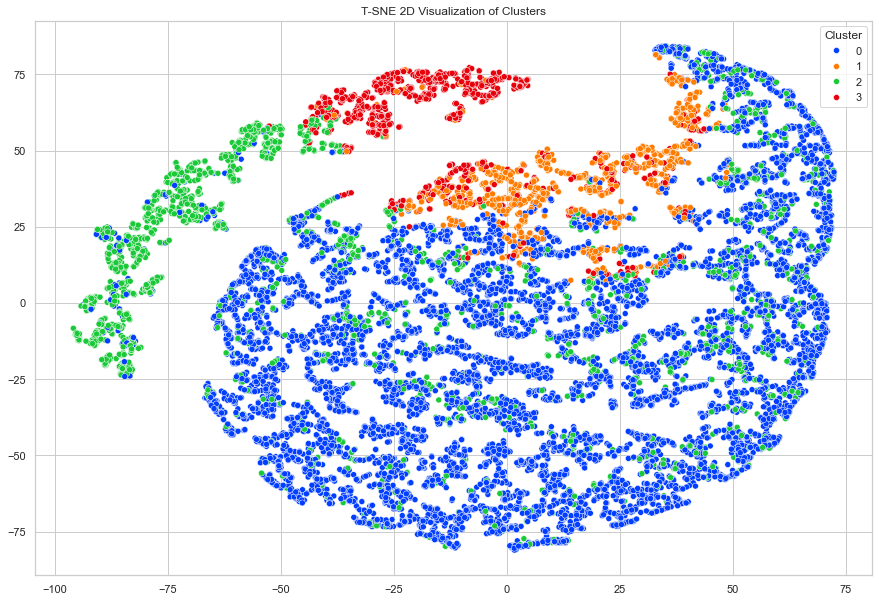

In [252]:
# Initialize T-SNE model
model = TSNE(learning_rate=200, n_components=2, random_state=42)

# Apply T-SNE to only the metric features used for the final segmentation identification
tsne_features = model.fit_transform(final_df[['age', 'income', 'days_without_frequency', 'lifetime_value', 'number_of_frequencies', 
                                              'attended_classes', 'real_number_of_visits', 'number_of_renewals', 
                                              'enrollment_duration']])

# Create a scatter plot
plt.figure(figsize=(15, 10))

palette = sns.color_palette("bright", len(np.unique(final_df['cluster'])))
sns.scatterplot(x=tsne_features[:, 0], y=tsne_features[:, 1], hue=final_df['cluster'], 
                palette=palette)
plt.title('T-SNE 2D Visualization of Clusters')
plt.legend(title='Cluster')
plt.show()

The t-SNE 2D visualization of clusters offers an illustrative representation of the data's inherent groupings, providing valuable insights into the clustering distribution. From the graphic, it is evident that there is a clear delineation of clusters, each occupying distinct regions in the 2D space, which suggests that the clustering algorithm has effectively identified separable groups within the dataset.

Cluster 0, marked in blue, appears to be the most dispersed, indicating a greater within-cluster variance or a wider spectrum of behaviors within this group. This could represent a segment with diverse characteristics but enough commonalities to be grouped together.

Cluster 1, in orange, shows moderate dispersion and is well separated from Clusters 2 and 3 but shares a boundary with Cluster 0. This might highlight a transitional group sharing traits with both the most and least cohesive clusters.

Cluster 2, depicted in green, is somewhat interspersed with Cluster 0 but still maintains a degree of separation. This could suggest overlapping characteristics with Cluster 0 but with distinct differences that justify a separate grouping.

Cluster 3, in red, is more tightly grouped and distinct from the others, implying a high degree of similarity among its data points. Such cohesion within a cluster often indicates strong defining features that are consistent across members of this group.

The t-SNE visualization underpins the clustering solution's robustness, with each cluster's concentration and separation providing a visual affirmation of the underlying patterns the algorithm has captured. It also suggests potential areas for further investigation, particularly where clusters meet, to understand the nuanced differences or similarities between those data points.

This graphical analysis not only validates the clustering approach but also enhances the understanding of the data structure, which is instrumental in driving targeted strategies for each customer segment.

<a name="outlier-reclassification"></a>
# 5. Outlier Reclassification

In [253]:
# Recalling how many outliers have been removed throughout the Preprocessing
len(outlier_indices)

572

In [254]:
# Selecting features and target variable for the decision tree
train_dt_tree_df = final_df[['age', 'income', 'days_without_frequency', 'lifetime_value', 
                             'number_of_frequencies', 'attended_classes', 'real_number_of_visits', 
                             'number_of_renewals', 'dropout', 'enrollment_duration']]

# Defining features (X) and target variable (y)
X = train_dt_tree_df
y = final_df['cluster']

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Setting the parameter grid
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initializing the Grid Search with the Decision Tree Classifier and the parameter grid
grid_search = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, cv=5, verbose=1, n_jobs=-1)

# Fitting Grid Search to the training data
grid_search.fit(X_train, y_train)

# Retrieving the best parameters and the best estimator
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

# Evaluating the best estimator on the test data
best_estimator.fit(X_train, y_train)
test_accuracy = best_estimator.score(X_test, y_test) * 100

# Printing the message with the best score on the test set
print(f"The best hyperparameters found are: {best_params}")
print(f"With these parameters, it is estimated that, on average, the model is able to predict the cluster labels for {test_accuracy:.2f}% of the observations.")

Fitting 5 folds for each of 108 candidates, totalling 540 fits
The best hyperparameters found are: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10}
With these parameters, it is estimated that, on average, the model is able to predict the cluster labels for 94.02% of the observations.


In [255]:
# Assessing feature importance for the Decision Tree model
pd.Series(best_estimator.feature_importances_, index=X_train.columns)

age                       0.051871
income                    0.007990
days_without_frequency    0.012117
lifetime_value            0.077099
number_of_frequencies     0.045251
attended_classes          0.461966
real_number_of_visits     0.002378
number_of_renewals        0.003471
dropout                   0.003085
enrollment_duration       0.334771
dtype: float64

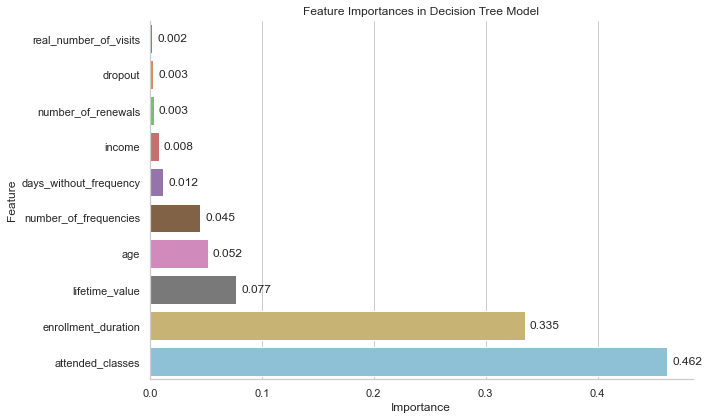

In [256]:
# Create a DataFrame from the feature importances
feature_importances_df = pd.Series(best_estimator.feature_importances_, index=X_train.columns)

# Sorting the DataFrame for better visualization
feature_importances_df = feature_importances_df.sort_values(ascending=True)

# Plotting
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=feature_importances_df, y=feature_importances_df.index, palette='muted')

# Adding the text labels for each bar
for p in ax.patches:
    ax.annotate(f'{p.get_width():.3f}', 
                (p.get_width(), p.get_y() + p.get_height() / 2), 
                ha='center', va='center', 
                xytext=(20, 0), 
                textcoords='offset points')

plt.title('Feature Importances in Decision Tree Model')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.yticks(rotation=0)  # Rotate y-axis labels to show them horizontally
sns.despine()  # Remove the top and right spines from plot

plt.tight_layout()
plt.show()

The output from the Decision Tree model's feature importances provides insight into which features are most influential in predicting the cluster labels:

Attended Classes (46.20%): This is the most significant feature, indicating that the number of classes attended by a customer is the strongest predictor of their cluster assignment. This suggests that engagement level, as measured by class attendance, plays a crucial role in differentiating between customer segments.

Enrollment Duration (33.50%): The second most important feature, it highlights the length of time a customer has been enrolled as a key differentiator among clusters. Longer or shorter enrollment durations could be indicative of different customer behaviors or loyalty.

Lifetime Value (7.70%): This shows a customer's overall value to the company and is the third most indicative feature. A higher lifetime value could correlate with more entrenched or valuable customer segments.

Age (5.20%): As a moderately important feature, the age of customers seems to moderately influence cluster membership, which might reflect different preferences or activity levels across age groups.

Number of Frequencies (4.50%): Slightly less influential than age, the total number of facility visits contributes to cluster differentiation but to a lesser extent.

The remaining features, such as Income, Days Without Frequency, Real Number of Visits, Number of Renewals, and Dropout, have minimal importance scores, suggesting they have little impact on the predictive power of the model regarding cluster membership.

In [257]:
# A preview of the outliers retained during the Preprocessing stage and their original features
df_outliers = df.loc[outlier_indices]
df_outliers.head(3)

,age,gender,income,enrollment_start,enrollment_finish,last_period_start,last_period_finish,date_last_visit,days_without_frequency,lifetime_value,...,other_activities,number_of_frequencies,attended_classes,allowed_weekly_visits_by_sla,allowed_number_of_visits_by_sla,real_number_of_visits,number_of_renewals,has_references,number_of_references,dropout
1032,44,1,4520.0,2015-10-09,2015-10-09,2019-01-01,2019-06-30,2019-05-27,157,959.44,...,0.0,207.0,181,2.0,11.14,7,4,1.0,3,0
1542,37,0,4580.0,2014-09-29,2015-09-16,2015-01-01,2015-12-31,2015-05-09,130,388.20,...,0.0,14.0,0,7.0,60.97,0,1,1.0,2,1
1893,14,1,0.0,2014-06-20,2016-12-06,2016-07-01,2016-12-31,2016-10-15,52,1063.70,...,0.0,29.0,16,4.0,34.84,1,3,1.0,2,1


In [258]:
# Convert date features to datetime format for further processing
for feature in date_features:
    df_outliers[feature] = pd.to_datetime(df[feature])

# Calculate the enrollment duration in days
df_outliers['enrollment_duration'] = (df_outliers['enrollment_finish'] - df_outliers['enrollment_start']).dt.days

# Calculate the last period duration in days
df_outliers['last_period_duration'] = (df_outliers['last_period_finish'] - df_outliers['last_period_start']).dt.days

# Calculate the number of days since the last visit using a reference date
df_outliers['date_last_visit'] = (df_outliers['date_last_visit'] - reference_date).dt.days

# Identify inconsistencies where last period duration is positive but enrollment duration is zero
inconsistencies = (df_outliers['last_period_duration'] > 0) & (df_outliers['enrollment_duration'] == 0)

# Select rows that meet the condition for inconsistency
rows_with_condition = df_outliers[inconsistencies]

# Update the 'enrollment_finish' date for inconsistent records to a specified finish date
df_outliers.loc[inconsistencies, 'enrollment_finish'] = finish_date

# Recalculate the 'enrollment_duration' for these records
df_outliers.loc[inconsistencies, 'enrollment_duration'] = (
    df_outliers.loc[inconsistencies, 'enrollment_finish'] - 
    df_outliers.loc[inconsistencies, 'enrollment_start']
).dt.days

# Identify inconsistencies where the number of frequencies is less than the real number of visits
inconsistencies = df_outliers['number_of_frequencies'] < df_outliers['real_number_of_visits']

# Select inconsistent records for review
inconsistent_records = df_outliers[inconsistencies][['number_of_frequencies', 'real_number_of_visits']]

# Correct the 'number_of_frequencies' to match 'real_number_of_visits' for these records
df_outliers.loc[inconsistencies, 'number_of_frequencies'] = df_outliers.loc[inconsistencies, 'real_number_of_visits']

# Drop the start and finish date columns for enrollment and last period as they are no longer needed
df_outliers.drop(['enrollment_start', 'enrollment_finish', 'last_period_start', 'last_period_finish'], axis=1, inplace=True)

In [259]:
df_outliers.isna().sum()

age                                 0
gender                              0
income                             23
date_last_visit                     0
days_without_frequency              0
lifetime_value                      0
use_by_time                         0
athletics_activities                1
water_activities                    1
fitness_activities                  4
team_activities                     2
racket_activities                   0
combat_activities                   1
special_activities                  0
other_activities                    1
number_of_frequencies               2
attended_classes                    0
allowed_weekly_visits_by_sla       41
allowed_number_of_visits_by_sla     0
real_number_of_visits               0
number_of_renewals                  0
has_references                      7
number_of_references                0
dropout                             0
enrollment_duration                 0
last_period_duration                0
dtype: int64

In [260]:
# List of features to standardize (scale)
features_to_standardize = [
 'age', 'income', 'days_without_frequency', 'lifetime_value',
 'number_of_frequencies', 'attended_classes', 'allowed_weekly_visits_by_sla',
 'allowed_number_of_visits_by_sla', 'real_number_of_visits',
 'number_of_renewals', 'number_of_references', 'enrollment_duration',
 'last_period_duration', 'date_last_visit'
]

# Apply the standard scaling to the specified features. It is important to note that the scaler applied was the same as in the Missing Data
# Handling. This is crucial because some outliers have missing values and the use of this scaler avoids Data Leakage
df_outliers[features_to_standardize] = scaler_no_outlier_no_missing.fit_transform(df_outliers[features_to_standardize])

# List of metric features that may contain missing values
metric_features_with_missing = ['income', 'number_of_frequencies', 'allowed_weekly_visits_by_sla']

# Impute missing values using the KNN imputer for the specified metric features. It is important to note that the KNN Imputer applied was 
# the same as in the Missing Data Handling. This is crucial as it avoids Data Leakage
df_outliers[metric_features_with_missing] = knn_imputer.fit_transform(df_outliers[metric_features_with_missing])

# List of all metric features
metric_features = [
 'age', 'income', 'days_without_frequency', 'lifetime_value',
 'number_of_frequencies', 'attended_classes', 'allowed_weekly_visits_by_sla',
 'allowed_number_of_visits_by_sla', 'real_number_of_visits',
 'number_of_renewals', 'number_of_references', 'enrollment_duration',
 'last_period_duration', 'date_last_visit'
]

# Inverse transform the scaled features back to their original scale, after imputing the missing values, avoiding Data Leakage
df_outliers[metric_features] = scaler_no_outlier_no_missing.inverse_transform(df_outliers[metric_features])

In [261]:
# A preview to confirm the success of the applied transformations
df_outliers.head(3)

,age,gender,income,date_last_visit,days_without_frequency,lifetime_value,use_by_time,athletics_activities,water_activities,fitness_activities,...,attended_classes,allowed_weekly_visits_by_sla,allowed_number_of_visits_by_sla,real_number_of_visits,number_of_renewals,has_references,number_of_references,dropout,enrollment_duration,last_period_duration
1032,44.0,1,4520.0,18043.0,157.0,959.44,0,0.0,1.0,0.0,...,181.0,2.0,11.14,7.0,4.0,1.0,3.0,0,1544.0,180.0
1542,37.0,0,4580.0,16564.0,130.0,388.20,0,0.0,1.0,0.0,...,0.0,7.0,60.97,0.0,1.0,1.0,2.0,1,352.0,364.0
1893,14.0,1,0.0,17089.0,52.0,1063.70,0,0.0,1.0,0.0,...,16.0,4.0,34.84,1.0,3.0,1.0,2.0,1,900.0,183.0


In [262]:
# Define the final set of features to be used for the decision tree model (the same as when the Decision Tree was fitted)
final_features_for_dt = [
    'age',
    'income',
    'days_without_frequency',
    'lifetime_value',
    'number_of_frequencies',
    'attended_classes',
    'real_number_of_visits',
    'number_of_renewals',
    'dropout',
    'enrollment_duration'
]

# Filter the dataframe to only include the final features selected for the decision tree
df_outliers = df_outliers[final_features_for_dt]

# Predict the cluster labels for the data points using the best estimator from the decision tree model
df_outliers['cluster'] = best_estimator.predict(df_outliers)

# Count the occurrences of each predicted cluster label
df_outliers['cluster'].value_counts()

cluster
1    164
3    148
0    145
2    115
Name: count, dtype: int64

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


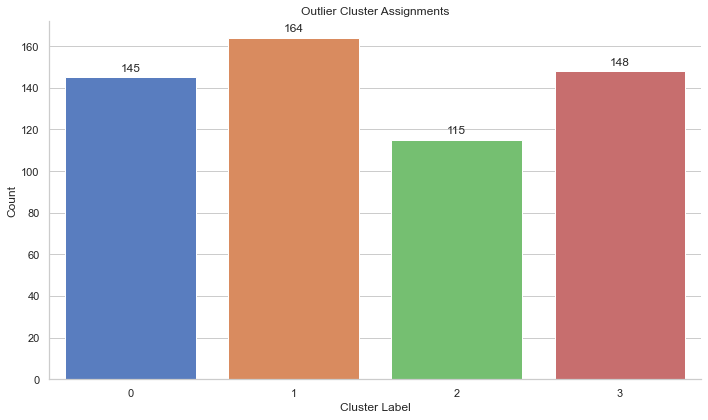

In [263]:
# Count the occurrences of each cluster
cluster_counts = df_outliers['cluster'].value_counts()

# Plotting
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=cluster_counts.index, y=cluster_counts, palette='muted')

# Adding the text labels for each bar
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2, p.get_height()), 
                ha='center', va='bottom', 
                xytext=(0, 4), 
                textcoords='offset points')

plt.title('Outlier Cluster Assignments')
plt.xlabel('Cluster Label')
plt.ylabel('Count')
sns.despine()  # Remove the top and right spines from plot

plt.tight_layout()
plt.show()

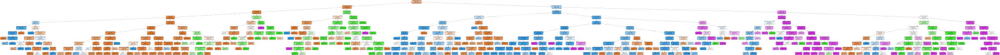

In [264]:
# Use export_graphviz to export the tree in Graphviz format
# This function generates a .dot file representation of the decision tree
dot_data = export_graphviz(
    best_estimator,        # The decision tree classifier model
    out_file=None,         # Specifies that the output will be in memory, not a file
    feature_names=X.columns.to_list(),  # The names of the features in the data
    filled=True,           # Color nodes to show majority class for classification
    rounded=True,          # Render nodes with rounded corners and use Helvetica font
    special_characters=True # Allow special characters in node names
)

# Create a graph from the .dot data
g = graphviz.Source(dot_data)

# Display the graph; this line will render the decision tree visualization
g

### *Final Cluster Distribution*

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


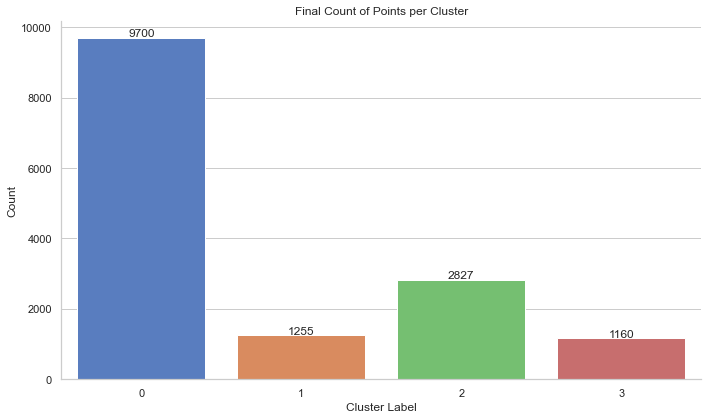

In [265]:
# Concatenate the two dataframes containing the outliers and the inliers along the rows, to show the final cluster distribution
concatenated_df = pd.concat([df_outliers, final_df], axis=0, ignore_index=True)

# Count the occurrences of each cluster label
cluster_counts = concatenated_df['cluster'].value_counts().sort_index()

# Convert the series to DataFrame for plotting
cluster_counts_df = cluster_counts.reset_index()
cluster_counts_df.columns = ['Cluster Label', 'Count']

# Create a bar plot using Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Cluster Label', y='Count', data=cluster_counts_df, palette='muted')

# Adding the text labels for each bar
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                xytext=(0, 4), 
                textcoords='offset points')

plt.title('Final Count of Points per Cluster')
plt.xlabel('Cluster Label')
plt.ylabel('Count')
plt.xticks(rotation=0)  # Rotate x-axis labels to show them horizontally
sns.despine()  # Remove the top and right spines from plot

plt.tight_layout()
plt.show()

<a name="conclusion"></a>
# 6. Conclusion

### Identified Customer Segments
The analysis has culminated in the identification of four distinct customer segments within the XYZ Sports Club membership:

- **Cluster 0:** Young adults (<30 years old), medium-high income, infrequent visits, low spending, and high dropout rate.
- **Cluster 1:** Mid-aged adults (>30 years old), highest income, frequent visits, high spending, active and loyal membership.
- **Cluster 2:** Adolescents (<20 years old), moderate income, low engagement, short enrollment duration.
- **Cluster 3:** Kids with balanced engagement, high frequency, and the highest spending.

### Justification for the Number of Clusters
The decision to delineate four clusters was driven by the diverse demographic and behavioral patterns observed within the data. This granularity allows for the tailoring of marketing and operational strategies to address the unique preferences and tendencies of each segment effectively.

### Explanation of Clusters
- **Cluster 0** represents a segment that, despite their potential, exhibit low engagement, necessitating strategies to boost visit frequency and reduce churn.
- **Cluster 1** comprises the most valuable members, warranting premium services and rewards.
- **Cluster 2** includes the youngest members, where engagement can be fostered through targeted programs.
- **Cluster 3** represents the future prospects, the kids, indicating a need for family-oriented offerings.

### Business Applications and Marketing Approaches
- **Cluster 0**: Target with budget-friendly offers and loyalty discounts to increase engagement and reduce dropout rates. Digital marketing campaigns focusing on the cost-effectiveness of memberships may appeal to this segment.

- **Cluster 1:** Offer premium membership plans with exclusive benefits to capitalize on their higher income and loyalty. Personalized communication highlighting advanced facilities and loyalty rewards could foster long-term retention.

- **Cluster 2:** Engage with community and school programs to increase their attachment and regularity. Promotions on group activities and family memberships might be effective.

- **Cluster 3:** Introduce programs and events for skill development and fun activities that can attract kids and their parents. A family-centric marketing approach with a focus on the long-term health and educational benefits could be successful.

For each cluster, it is important to consider tailored communication strategies and personalized experiences to meet their specific needs and preferences, thereby enhancing customer satisfaction and retention.

By addressing the specific needs of each segment, XYZ Sports Club can optimize its service offerings, bolster member satisfaction, and drive growth.